In [1367]:
#importing necessary libraries
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder, LabelEncoder, PowerTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_transformer
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score,roc_curve, roc_auc_score, plot_roc_curve
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor,RandomForestClassifier, BaggingClassifier
from sklearn.metrics import confusion_matrix, classification_report
from scipy.stats import norm, stats
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
import statistics as st
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import time
#import csv

#import plotty
import warnings
warnings.filterwarnings('ignore')

In [1368]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
df.head() #open the csv file

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


Documentation
1. there are 23 columns in the dataset
2. Out of which 7 columns are object type
3. Date column should be split into three parts day,month,year
4. many columns has missing values
5. there are some duplicate values as well
6. There are two labels in the dataset - 1. rainfall, 2. rain Tomorrow
7. there are lot of zero values in rainfall column
8. rainfall, evaporation column are highly skewed

In [1369]:
df.shape #check the shape of the dataset

(8425, 23)

In [1370]:
df.info() #check the Dtype and null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [1371]:
df.describe() #check the parameters

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [1372]:
df.isnull().sum() #check the null values

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [1373]:
df.duplicated().sum() #check the duplicate value

1663

In [1374]:
df.drop_duplicates(inplace=True) #drop duplicate rows

In [1375]:
df.shape #now, check the shape of dataset

(6762, 23)

# Column1:Date 

In [1376]:
df['Date'].unique() #check the unique value

array(['2008-12-01', '2008-12-02', '2008-12-03', ..., '2013-06-06',
       '2013-06-07', '2013-06-08'], dtype=object)

In [1377]:
df['Date'].value_counts() #check the counts of unique value

2011-02-11    4
2011-03-06    4
2014-06-08    4
2011-03-28    4
2011-03-16    4
             ..
2016-05-25    1
2016-07-27    1
2017-02-19    1
2016-08-30    1
2013-04-18    1
Name: Date, Length: 3004, dtype: int64

In [1378]:
#divide the date, month, years into three columns.
df['Date']=pd.to_datetime(df['Date'])
df['Date_Month']=df['Date'].apply(lambda x:x.month)
df['Date_Day']=df['Date'].apply(lambda x:x.day)
df['Date_Years']=df['Date'].apply(lambda x:x.year)

In [1379]:
df['Date_Month'].unique()#check the unique value

array([12,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [1380]:
df['Date_Month'].value_counts()#check the counts of unique value

6     673
5     646
7     614
3     606
8     589
1     569
12    555
10    529
9     519
11    503
4     480
2     479
Name: Date_Month, dtype: int64

In [1381]:
df['Date_Day'].unique()#check the unique value

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31],
      dtype=int64)

In [1382]:
df['Date_Day'].value_counts() #check the counts of unique value

22    224
10    224
23    224
20    224
24    224
25    224
21    224
7     223
8     223
9     223
11    223
12    223
13    222
18    222
19    222
6     222
15    221
3     221
4     221
2     221
14    221
17    221
5     221
1     221
28    221
16    221
26    220
27    220
29    206
30    202
31    133
Name: Date_Day, dtype: int64

In [1383]:
df['Date_Years'].unique()#check the unique value

array([2008, 2009, 2010, 2011, 2013, 2014, 2015, 2016, 2017, 2012],
      dtype=int64)

In [1384]:
df['Date_Years'].value_counts() #check the counts of unique value

2011    1133
2010    1078
2014     959
2009     950
2012     876
2015     580
2013     543
2016     366
2017     215
2008      62
Name: Date_Years, dtype: int64

Observation:
1. We split date column into three parts - Day, Month, Year

In [1385]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (6762, 26)


# Column2:Location 

In [1386]:
df['Location'].unique() #check the unique value

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

In [1387]:
df['Location'].value_counts() #check the counts of unique value

PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64

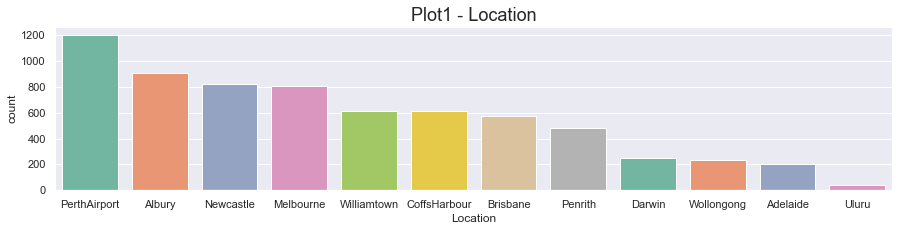

In [1388]:
#plotting each class frequency
fig = plt.figure(figsize=(15,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Location",palette="Set2", data=df, order = df["Location"].value_counts().index)
plt.title('Plot1 - Location', fontsize=18)
plt.show()

In [1389]:
df.groupby('Date_Years')['Location'].value_counts().sort_index(ascending=True).head(50)
#Checking the relationship between Location and Date_Years

Date_Years  Location    
2008        Albury           31
            Wollongong       31
2009        Albury          365
            CoffsHarbour    297
            Melbourne        82
            Wollongong      206
2010        Albury          365
            CoffsHarbour    314
            Melbourne       365
            PerthAirport     34
2011        Albury          146
            Brisbane        317
            Melbourne       335
            PerthAirport    335
2012        Brisbane        262
            Darwin          250
            Melbourne        29
            PerthAirport    335
2013        Newcastle       206
            PerthAirport    337
2014        Adelaide        205
            Newcastle       365
            Penrith         226
            PerthAirport    163
2015        Newcastle       251
            Penrith         256
            Williamtown      73
2016        Williamtown     366
2017        Uluru            39
            Williamtown     176
Name: Location,

In [1390]:
df.groupby('Date_Month')['Location'].value_counts(normalize = True).sort_index(ascending=True).head(50)
#Checking the relationship between Location and Date_Month

Date_Month  Location    
1           Albury          0.163445
            Brisbane        0.077329
            CoffsHarbour    0.054482
            Melbourne       0.159930
            Newcastle       0.108963
            Penrith         0.054482
            PerthAirport    0.217926
            Williamtown     0.108963
            Wollongong      0.054482
2           Albury          0.175365
            Brisbane        0.118998
            CoffsHarbour    0.058455
            Melbourne       0.116910
            Newcastle       0.116910
            Penrith         0.058455
            PerthAirport    0.177453
            Williamtown     0.118998
            Wollongong      0.058455
3           Albury          0.153465
            Brisbane        0.102310
            CoffsHarbour    0.087459
            Darwin          0.042904
            Melbourne       0.102310
            Newcastle       0.102310
            Penrith         0.051155
            PerthAirport    0.204620
            W

Text(0.5, 1.0, 'Plot2: Location vs Date_Month')

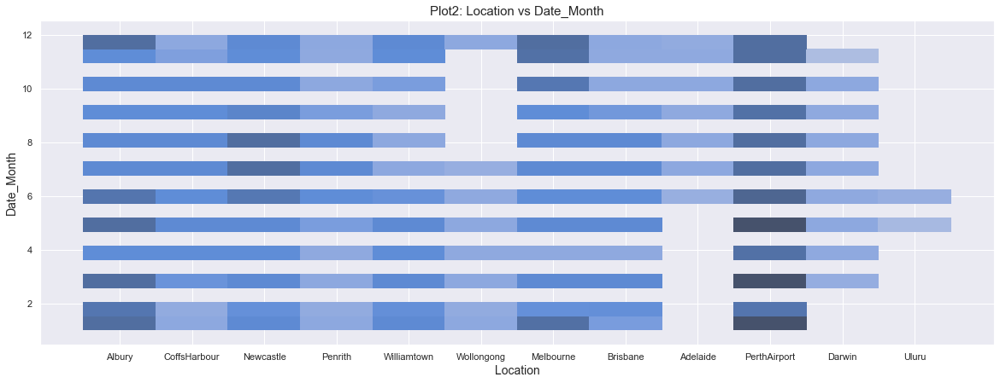

In [1391]:
#visualize this column by Histplot
plt.figure(figsize=(20,7))
sns.histplot(y= 'Date_Month',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Date_Month', fontsize = 14)
plt.title('Plot2: Location vs Date_Month', fontsize = 15)

Observation:
- Results by EDA
1. In plot1, Count of PerthAirport is higher than others
2. In relationship bwteeen location and Date_years, in latest years like 2013,2014,2015,2016 the count of locations is decreasing
3. In plot2, count of perthAirport is higher in 1st,3rd and 5th month

In [1392]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (6762, 26)


# Column3:MinTemp

In [1393]:
df['MinTemp'].unique() #check the unique value

array([13.4,  7.4, 12.9,  9.2, 17.5, 14.6, 14.3,  7.7,  9.7, 13.1, 15.9,
       12.6,  8.4,  9.8, 14.1, 13.5, 11.2, 11.5, 17.1, 20.5, 15.3, 16.2,
       16.9, 20.1, 19.7, 12.5, 12. , 11.3,  9.6, 10.5, 12.3, 13.7, 16.1,
       14. , 17. , 17.3, 17.2, 17.4, 19.8, 14.9, 13.9, 18.6, 19.3, 24.4,
       18.8, 20.8, 15.7, 18.5, 20.4, 21.8, 22.3, 22. , 28. , 21.5, 21.7,
       23.5, 28.3, 18.4, 12.4, 13.3, 18. , 18.7, 15.5,  8.9, 15. , 15.4,
       16. , 12.8, 13.2, 13.8,  7.6,  8.3, 11. , 20.9, 16.4, 10. ,  8.8,
        9.3, 14.4, 10.8, 10.1,  9.1, 10.4, 12.2, 10.7,  7.8,  8.1,  7.5,
        8.2, 11.6, 13. ,  9.9,  3.5,  6.6,  7. ,  5.7,  6.2,  6. , 10.6,
        8.6,  4.5,  5.4,  2.1,  1.8,  7.2,  4.6,  4.2,  5.2,  4.1,  3.2,
        4.3,  3.7,  3.6,  6.9, 10.3,  3. ,  2.6,  5.1,  4.4,  4.7,  6.7,
        8. ,  2.2,  1.7,  2.8,  9. ,  6.3, -2. , -1.3,  2. ,  0.5,  1.2,
        0.6,  0.9,  5. ,  3.9,  3.4,  0. , -1.5, -1.7, -0.4,  0.1,  4.8,
        5.9,  2.9, -0.6, -0.3, -1. ,  0.8, -0.1,  1

In [1394]:
df['MinTemp'].value_counts() #check the counts of unique value

 13.2    58
 12.0    57
 14.8    53
 12.7    53
 10.8    52
         ..
 26.0     1
 25.9     1
-0.8      1
-1.4      1
 28.3     1
Name: MinTemp, Length: 285, dtype: int64

In [1395]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['MinTemp'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['MinTemp'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['MinTemp'].skew())#check the skewness

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 70

 **************************************************
Check the skewness in Column:----------> -0.08327137996747117


In [1396]:
df['MinTemp'].describe()

count    6692.000000
mean       13.109145
std         5.569574
min        -2.000000
25%         9.000000
50%        13.200000
75%        17.500000
max        28.500000
Name: MinTemp, dtype: float64

In [1397]:
df.dropna(subset=["MinTemp"], inplace=True) #drop the null values

In [1398]:
df['MinTemp'] = df['MinTemp'].replace(0,df['MinTemp'].mean()) #replace the zero value by mean

In [1399]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['MinTemp'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['MinTemp'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['MinTemp'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.08007950450159022


In [1400]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['MinTemp'].mean())
print('median of the column--------> ',df['MinTemp'].median())
print('mode of the column--------> ', st.mode(df['MinTemp']))
print('std of the column:----->',df['MinTemp'].std())

mean of the column------->  13.11698095950273
median of the column-------->  13.2
mode of the column-------->  13.2
std of the column:-----> 5.560337782107993


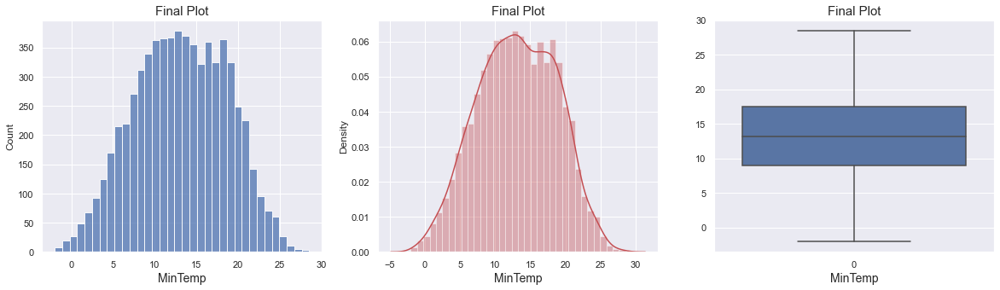

In [1401]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['MinTemp']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('MinTemp', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['MinTemp'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('MinTemp', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['MinTemp']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('MinTemp', fontsize= 14)
plt.show()

Text(0.5, 1.0, 'Plot1: MinTemp vs Location')

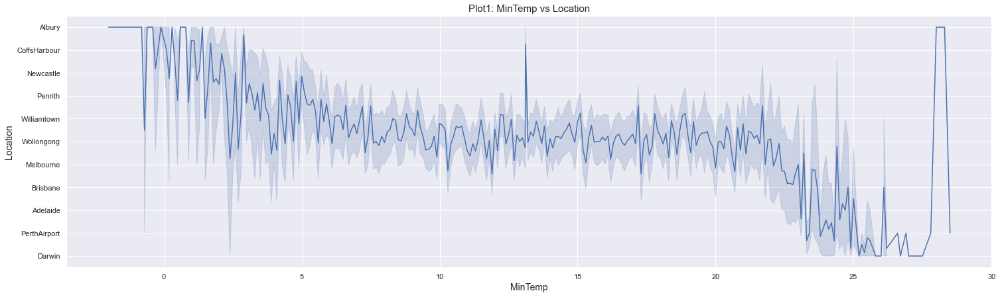

In [1402]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Location',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot1: MinTemp vs Location', fontsize = 15)

Text(0.5, 1.0, 'Plot2: MinTemp vs Date_Years')

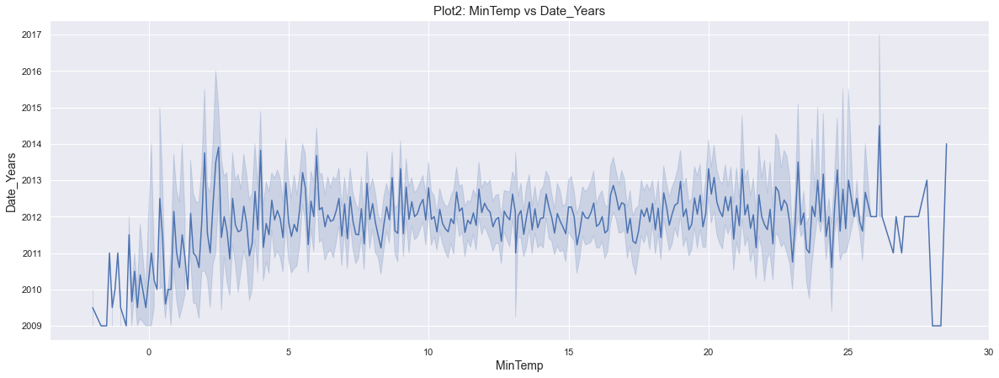

In [1403]:
#visualize this column by lineplot
plt.figure(figsize=(20,7))
sns.lineplot(y= 'Date_Years',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Date_Years', fontsize = 14)
plt.title('Plot2: MinTemp vs Date_Years', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MinTemp vs Date_Month')

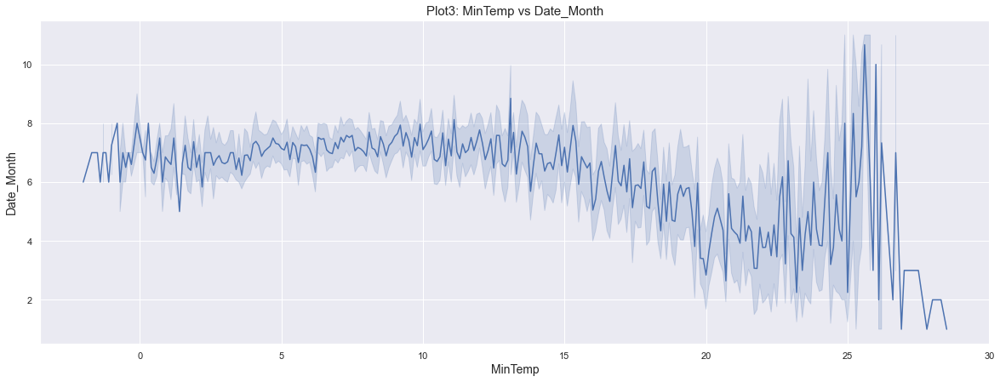

In [1404]:
#visualize this column by ;ineplot
plt.figure(figsize=(20,7))
sns.lineplot(y= 'Date_Month',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Date_Month', fontsize = 14)
plt.title('Plot3: MinTemp vs Date_Month', fontsize = 15)

Observation:
- Data Cleaning
1. Zero values are found and replaced by column mean value
2. Null values are found and we drop those values
3. No outliers are found
4. mean, median, mode values are improved
5. skewness is improved
- Results by EDA
1. In plot1, the mintemp is low at coffsharbour and it is high at Darwin
2. In plot2, We see, As the years are increasing, the minTemp is slightly increasing
3. In plot3, We can see, minTemp is high at early months of the years 

In [1405]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (6692, 26)


# Column4:MaxTemp

In [1406]:
df['MaxTemp'].unique() #check the unique value

array([22.9, 25.1, 25.7, 28. , 32.3, 29.7, 25. , 26.7, 31.9, 30.1, 30.4,
       21.7, 18.6, 21. , 24.6, 27.7, 20.9, 22.5, 25.6, 29.3, 33. , 31.8,
       30.9, 32.4, 33.9, 32.7, 27.2, 24.2, 24.4, 26.5, 23.9, 28.8, 34.6,
       35.8, 37.9, 38.9, 28.3, 28.4, 30.8, 32. , 34.7, 37.7, 43. , 32.2,
       36.6, 39.9, 38.1, 34. , 35.2, 30.6, 34.3, 38.4, 38.2, 40.7, 41.5,
       42.9, 42.7, 43.1, 38.3, 36.9, 41.2, 42.2, 44.8, 40.2, 31.2, 27.3,
       21.6, 29. , 29.2, 31.3, 31.1, 29.1, 31.7, 33.2, 29.6, 32.6, 34.5,
       30.3, 22.1, 22. , 24. , 27.9, 30.2, 30.5, 25.8, 27. , 19.7, 21.9,
       25.3, 33.5, 33.6, 30. , 31.6, 22.3, 29.8, 27.6, 28.9, 29.9, 32.1,
       28.1, 21.4, 24.9, 25.4, 20. , 23.4, 22.7, 16.2, 15.8, 12.9, 11.5,
       14.5, 12.2, 16.5, 17. , 19.2, 18.9, 19.1, 18.8, 19.3, 18.4, 19. ,
       20.5, 19.5, 17.7, 18.5, 15.1, 16.3, 16.6, 16.4, 15.6, 19.8, 21.1,
       20.3, 18.1, 15.7, 16.8, 17.1, 14.3, 13.4, 17.4, 16.1, 10.5, 11.6,
       12. ,  8.8,  9.6,  8.2, 12.4, 14.9, 15.9, 14

In [1407]:
df['MaxTemp'].value_counts() #check the counts of unique value

19.0    66
19.8    60
25.0    54
20.8    54
22.3    53
        ..
41.2     1
39.4     1
8.3      1
42.9     1
43.1     1
Name: MaxTemp, Length: 331, dtype: int64

In [1408]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['MaxTemp'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['MaxTemp'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['MaxTemp'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 39

 **************************************************
Check the skewness in Column:----------> 0.325202092065003


In [1409]:
df['MaxTemp'].describe()

count    6653.000000
mean       24.102871
std         6.161839
min         8.200000
25%        19.500000
50%        23.500000
75%        28.400000
max        45.500000
Name: MaxTemp, dtype: float64

In [1410]:
df.dropna(subset=["MaxTemp"], inplace=True) #drop the null values

In [1411]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['MaxTemp'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['MaxTemp'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['MaxTemp'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.325202092065003


In [1412]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['MaxTemp'].mean())
print('median of the column--------> ',df['MaxTemp'].median())
print('mode of the column--------> ', st.mode(df['MaxTemp']))
print('std of the column:----->',df['MaxTemp'].std())

mean of the column------->  24.10287088531487
median of the column-------->  23.5
mode of the column-------->  19.0
std of the column:-----> 6.161838640931335


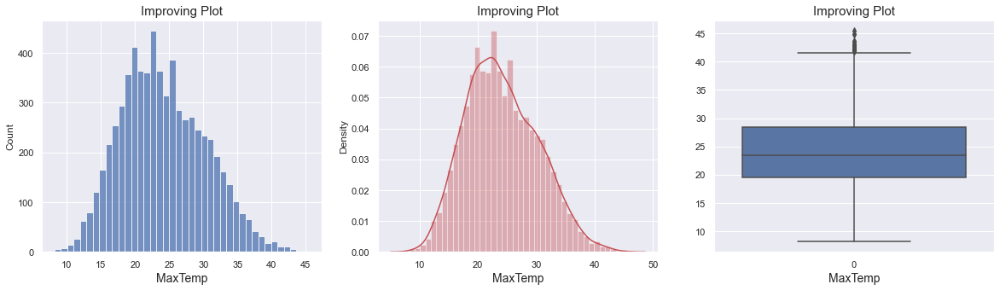

In [1413]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['MaxTemp']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['MaxTemp'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['MaxTemp']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)
plt.show()

In [1414]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['MaxTemp'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['MaxTemp'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['MaxTemp'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['MaxTemp'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.899999999999999

 **************************************************
Higher range:-
 (array([  44,   60,   61,   62,   67,   68,  403,  404,  405,  415, 2426,
       3169, 3176, 3189, 3199, 3200, 3659, 5223, 6212, 6213], dtype=int64),)

 **************************************************
Lower range:- 
 (array([], dtype=int64),)


In [1415]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (6653, 26)
New Shape:------>  (6633, 26)


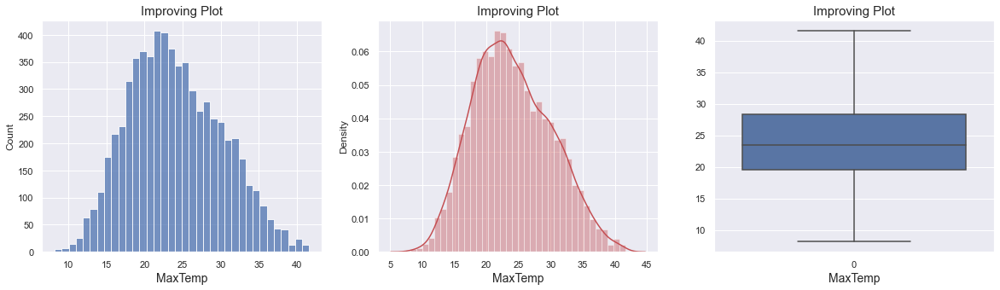

In [1416]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['MaxTemp']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['MaxTemp'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['MaxTemp']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)
plt.show()

In [1417]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['MaxTemp'].mean())
print('median of the column--------> ',df['MaxTemp'].median())
print('mode of the column--------> ', st.mode(df['MaxTemp']))
print('std of the column:----->',df['MaxTemp'].std())

mean of the column------->  24.04611789537161
median of the column-------->  23.4
mode of the column-------->  19.0
std of the column:-----> 6.083413727322451


In [1418]:
df['MaxTemp'] = df['MaxTemp'].replace(19.0,df['MaxTemp'].mean())
#replace mode value by column mean value

In [1419]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['MaxTemp'].mean())
print('median of the column--------> ',df['MaxTemp'].median())
print('mode of the column--------> ', st.mode(df['MaxTemp']))
print('std of the column:----->',df['MaxTemp'].std())

mean of the column------->  24.096328023683753
median of the column-------->  23.6
mode of the column-------->  24.04611789537161
std of the column:-----> 6.062342510124074


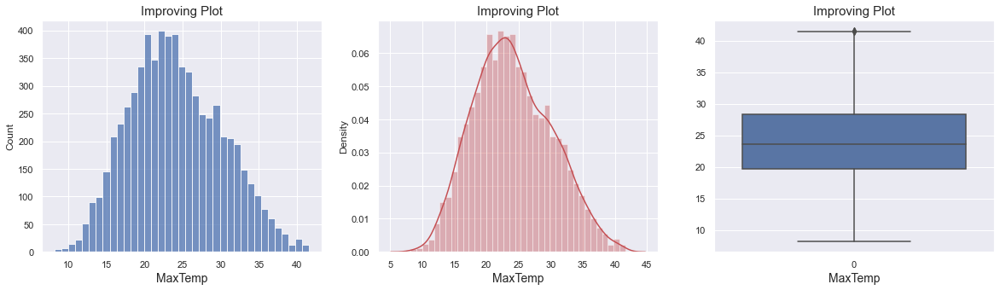

In [1420]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['MaxTemp']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['MaxTemp'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['MaxTemp']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)
plt.show()

In [1421]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['MaxTemp'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['MaxTemp'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['MaxTemp'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['MaxTemp'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.7

 **************************************************
Higher range:-
 (array([  58, 2747, 3163, 5537], dtype=int64),)

 **************************************************
Lower range:- 
 (array([], dtype=int64),)


In [1422]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (6633, 26)
New Shape:------>  (6629, 26)


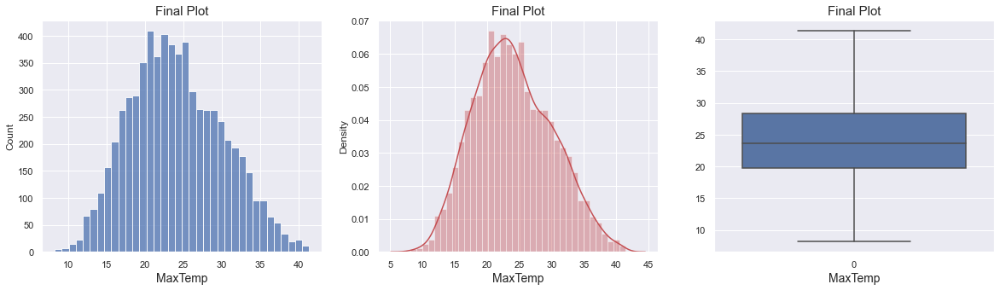

In [1423]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['MaxTemp']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['MaxTemp'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(data = df['MaxTemp']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('MaxTemp', fontsize= 14)
plt.show()

In [1424]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['MaxTemp'].mean())
print('median of the column--------> ',df['MaxTemp'].median())
print('mode of the column--------> ', st.mode(df['MaxTemp']))
print('std of the column:----->',df['MaxTemp'].std())

mean of the column------->  24.08579631635153
median of the column-------->  23.6
mode of the column-------->  24.04611789537161
std of the column:-----> 6.048984990086492


In [1425]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['MaxTemp'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['MaxTemp'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['MaxTemp'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.2531741763347296


Text(0.5, 1.0, 'Plot1: MaxTemp vs Location')

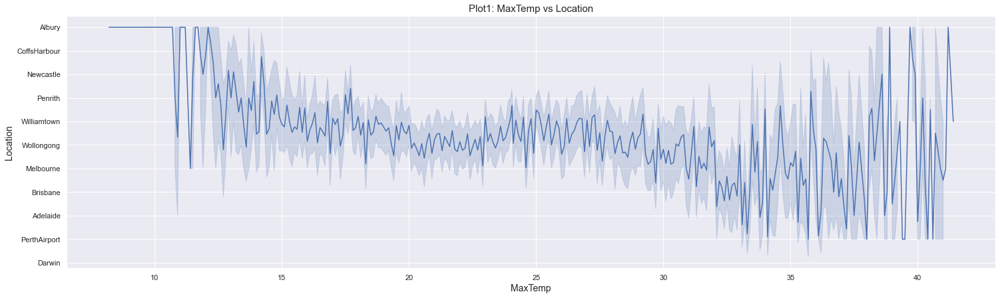

In [1426]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Location',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot1: MaxTemp vs Location', fontsize = 15)

Text(0.5, 1.0, 'Plot2: MaxTemp vs Date_Month')

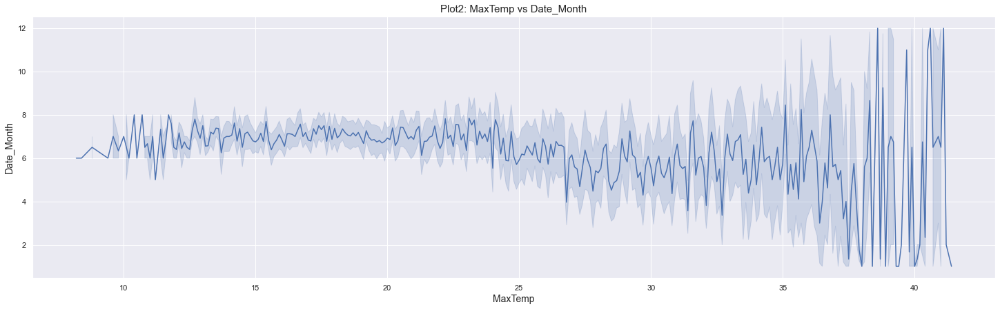

In [1427]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Date_Month',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Date_Month', fontsize = 14)
plt.title('Plot2: MaxTemp vs Date_Month', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MaxTemp vs Date_Years')

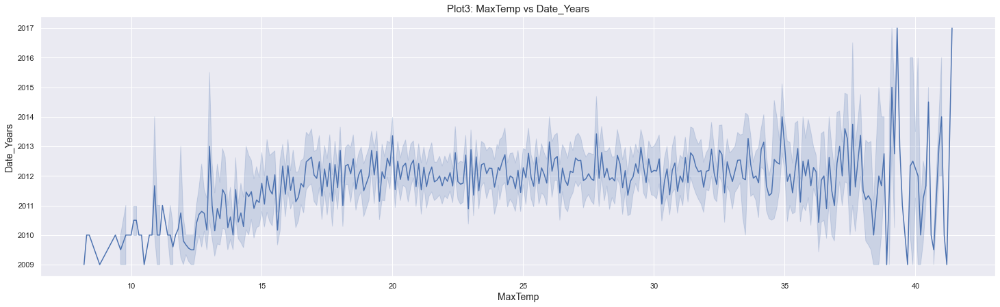

In [1428]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Date_Years',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Date_Years', fontsize = 14)
plt.title('Plot3: MaxTemp vs Date_Years', fontsize = 15)

Observation:
- Data Cleaning
1. No Zero values are found
2. Null values are found and we drop those values
3. outliers are found and removed by IQR method
4. mean, median, mode values are improved
5. skewness is improved
- Results by EDA
1. In plot1, the maxtemp of Darwin is around 30-35deg
2. In plot2, We see, High temp covers all the months 
3. In plot3, We can see, As the years are increasing, Maxtemp is also increasing sligthly

In [1429]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (6629, 26)


# Column5:Evaporation

In [1430]:
df['Evaporation'].unique() #check the unique value

array([  nan,   8.6,   3.8,   2.8,   3.2,   6.8,   4.2,   1.6,   4.4,
         4. ,   2.2,   3.4,   6.4,   4.6,   3.6,   4.8,   3. ,   1.2,
         1.4,   2.6,   1. ,   2. ,   8.4,   2.4,   0.6,   5.4,   1.8,
         7. ,   0.8,   0.2,   5.2,   5. ,   6. ,   7.6,   5.8,   5.6,
         8. ,   6.2,   6.6,   7.8,   8.8,   7.4,   9.4,   7.2,   0.4,
         0. ,  18. ,  24.2,  14.6,  19.4,  10.8,  28. ,  24.6,  11.2,
        22.6,  10. ,  37. ,  26. ,  11. ,  19.8,  24.4,  10.6,  27.4,
        12. ,  11.6,  24. ,   9. ,  23. ,  29.2,  20.6,  13.2,  22.8,
         9.8,  16. ,  20. ,  10.4,   9.6,  12.2,  15.4,  18.4,  24.8,
        20.8,  32. ,  55.4,  17.8,  16.2,  14.2,  59.2,  33.8,  10.2,
       145. ,  16.6,  47. ,  11.8,  15.2,  15.8,  12.6,  11.4,   9.2,
        14.8,  13. ,   8.2,  13.6,  12.8,  12.4,  17.6,  19.2,  13.8,
        22.4,  18.6,  13.4,  17. ,  14. ,  14.4,  15. ,   0.7])

In [1431]:
df['Evaporation'].value_counts() #check the counts of unique value

4.0     141
3.0     125
2.2     118
2.4     116
2.6     116
       ... 
24.6      1
33.8      1
22.4      1
20.8      1
29.2      1
Name: Evaporation, Length: 115, dtype: int64

In [1432]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Evaporation'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Evaporation'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Evaporation'].skew())#check the skewness

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 2797

 **************************************************
Check the skewness in Column:----------> 10.27390231481505


In [1433]:
df['Evaporation'] = df['Evaporation'].replace(0,df['Evaporation'].mean()) #replace the zero value by mean

In [1434]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Evaporation'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Evaporation'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Evaporation'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 2797

 **************************************************
Check the skewness in Column:----------> 10.316133219439171


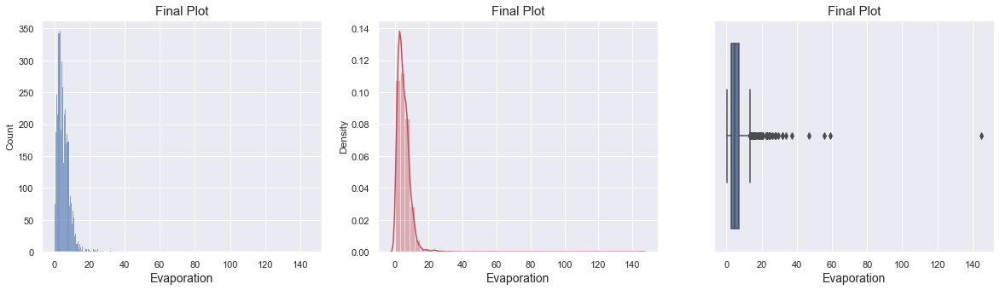

In [1435]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Evaporation']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Evaporation', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Evaporation'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Evaporation', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Evaporation']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Evaporation', fontsize= 14)
plt.show()

In [1436]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Evaporation'].mean())
print('median of the column--------> ',df['Evaporation'].median())
print('mode of the column--------> ', st.mode(df['Evaporation']))
print('std of the column:----->',df['Evaporation'].std())

mean of the column------->  5.30277500533906
median of the column-------->  4.6
mode of the column-------->  4.0
std of the column:-----> 4.4250892697553255


In [1437]:
df.drop(columns='Evaporation',inplace=True) #drop this column

Observation:
1. Many null values found
2. zero values are also found
3. to many outliers found, that's why we drop this column

In [1438]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (6629, 25)


# Column6:Sunshine

In [1439]:
df['Sunshine'].unique() #check the unique value

array([ nan,  9. ,  3.4,  6.1, 11. ,  7.1,  2.8,  6.7,  6.4,  6. ,  9.4,
        6.3, 11.1, 11.2, 11.4,  9.7,  7.9,  0.3,  0. ,  0.5,  3.5,  1.9,
        1.1,  7.8,  8.8,  1.8,  6.6,  3.1,  3. , 10.4, 10.5,  9.9,  9.5,
        1. ,  4.3,  9.2,  9.8,  4.8,  8.9,  4.5,  2.6, 10. , 10.2,  9.1,
        2.2,  0.4,  0.7,  0.2,  2.7,  8.5,  3.6,  2.5,  6.9,  8.2,  6.8,
        7.2,  9.6,  5.1,  5.8,  1.6,  0.6,  7.7,  8.3,  2.9,  8.4,  4.2,
        9.3,  4.7,  4.1,  5.3,  7.4,  7.3,  2.4, 10.6, 10.3, 10.1,  2.3,
       10.7,  8.6,  5.2, 10.9, 10.8,  8. ,  1.5,  8.7, 11.3, 11.5,  5.7,
       11.9,  3.3, 12.1, 12.4,  7. ,  4. , 11.7, 12.7, 12.5, 12.6, 13. ,
        5.5, 12.2, 11.6, 12.9, 13.1,  5.4,  3.7, 12. ,  2. ,  8.1, 13.2,
       13.6, 12.3, 11.8,  7.5,  6.2,  1.2,  3.8,  1.4,  5. ,  0.8,  4.4,
        6.5,  0.1,  4.9,  3.9,  4.6,  0.9,  5.9,  7.6,  1.3, 12.8, 13.4,
        1.7, 13.3,  3.2,  2.1, 13.5, 13.8, 13.9, 13.7,  5.6])

In [1440]:
df['Sunshine'].value_counts() #check the counts of unique value

0.0     119
11.1     61
11.0     59
11.2     59
10.9     56
       ... 
2.5       5
13.6      4
13.8      2
13.9      2
13.5      1
Name: Sunshine, Length: 140, dtype: int64

In [1441]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Sunshine'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Sunshine'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Sunshine'].skew())#check the skewness

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 3111

 **************************************************
Check the skewness in Column:----------> -0.6346344156068565


In [1442]:
df['Sunshine'] = df['Sunshine'].replace(0,df['Sunshine'].mean()) #replace the zero value by mean

In [1443]:
df.dropna(subset=["Sunshine"], inplace=True) #drop the null values

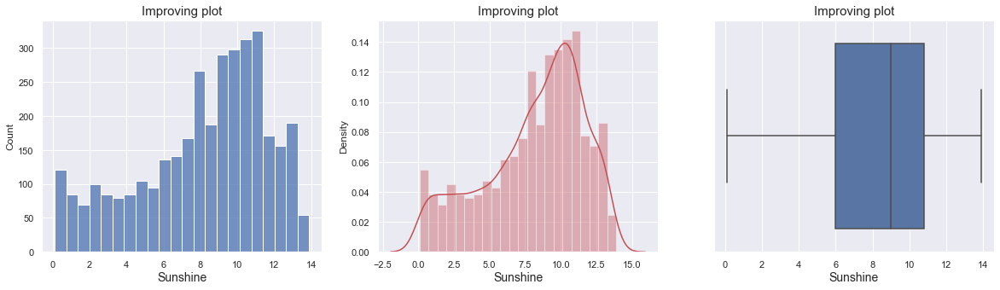

In [1444]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Sunshine']) #visualize the outliers by using histplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Sunshine'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Sunshine']) #visualize the outliers by using boxplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)
plt.show()

In [1445]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Sunshine'], 29,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Sunshine'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Sunshine'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Sunshine'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 4.200000000000001

 **************************************************
Higher range:-
 (array([], dtype=int64),)

 **************************************************
Lower range:- 
 (array([  76,  438,  448,  462,  481,  503,  516,  723,  828,  871,  960,
        973,  989,  993, 1000, 1006, 1027, 1190, 1215, 1233, 1254, 1311,
       1320, 1339, 1343, 1348, 1435, 1448, 1556, 1578, 1608, 1627, 1829,
       1927, 1986, 2237, 2264, 2269, 2648, 2815, 2908, 3229, 3230, 3352],
      dtype=int64),)


In [1446]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3518, 25)
New Shape:------>  (3474, 25)


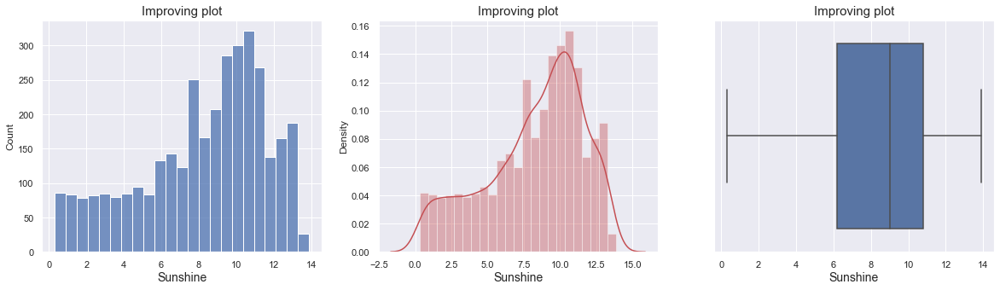

In [1447]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Sunshine']) #visualize the outliers by using histplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Sunshine'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Sunshine']) #visualize the outliers by using boxplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)
plt.show()

In [1448]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Sunshine'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Sunshine'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Sunshine'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.6407145325900594


In [1449]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Sunshine'].mean())
print('median of the column--------> ',df['Sunshine'].median())
print('mode of the column--------> ', st.mode(df['Sunshine']))
print('std of the column:----->',df['Sunshine'].std())

mean of the column------->  8.250763824044343
median of the column-------->  9.0
mode of the column-------->  7.882802728823211
std of the column:-----> 3.390075057739449


In [1450]:
df['Sunshine']=df['Sunshine'].replace(7.882802728823211,df['Sunshine'].mean())

In [1451]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Sunshine'].mean())
print('median of the column--------> ',df['Sunshine'].median())
print('mode of the column--------> ', st.mode(df['Sunshine']))
print('std of the column:----->',df['Sunshine'].std())

mean of the column------->  8.263368133293422
median of the column-------->  9.0
mode of the column-------->  8.250763824044343
std of the column:-----> 3.389367308495937


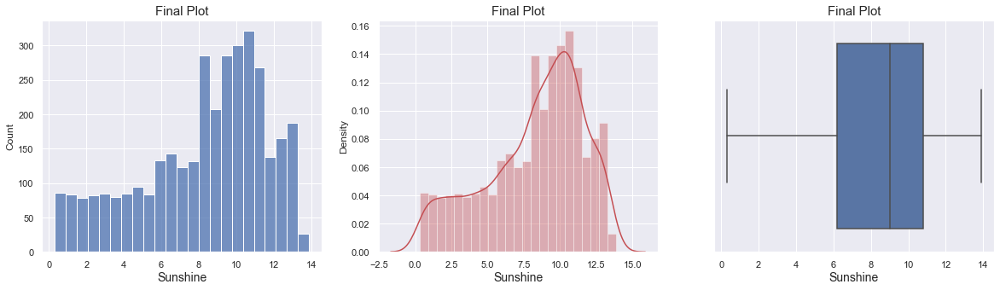

In [1452]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Sunshine']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Sunshine'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Sunshine']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Sunshine', fontsize= 14)
plt.show()

In [1453]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Sunshine'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Sunshine'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Sunshine'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.6522349366263831


Text(0.5, 1.0, 'Plot1: Sunshine vs Date_Years')

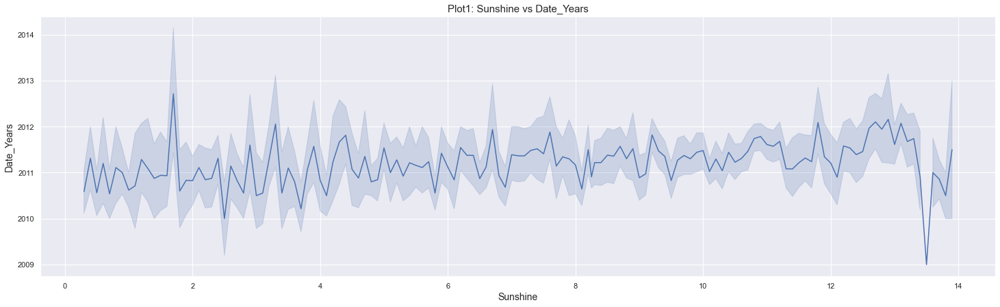

In [1454]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Date_Years',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Date_Years', fontsize = 14)
plt.title('Plot1: Sunshine vs Date_Years', fontsize = 15)

Text(0.5, 1.0, 'Plot2: Sunshine vs Location')

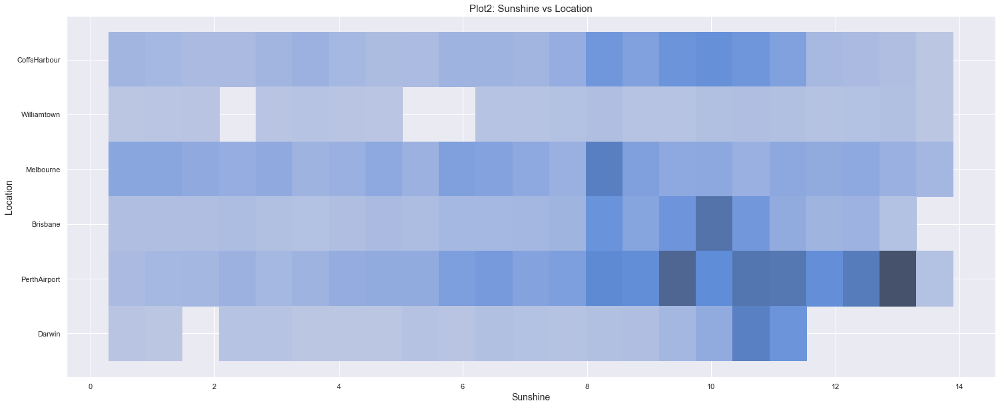

In [1455]:
#visualize this column by lineplot
plt.figure(figsize=(25,10))
sns.histplot(y= 'Location',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot2: Sunshine vs Location', fontsize = 15)

Text(0.5, 1.0, 'Plot3: Sunshine vs MaxTemp')

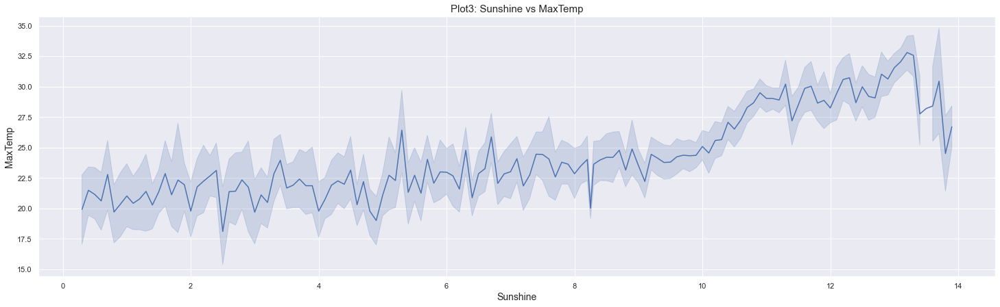

In [1456]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'MaxTemp',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('MaxTemp', fontsize = 14)
plt.title('Plot3: Sunshine vs MaxTemp', fontsize = 15)

Observation:
- Data Cleaning
1. Zero values are found and replaced by column mean
2. Null values are found and dropped it
3. No outliers are found
4. skewness is improved
5. mean, median, mode values are improved
- Results by EDA
1. In plot1, as the years are increasing, sunshinje rate is sligthly increasing
2. In plot2, sunshine rate of perthairport is nearby 13
3. In plot3, maxtemp increases, sunshine rate is increasing

In [1457]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3474, 25)


# Column7:WindGustDir

In [1458]:
df['WindGustDir'].unique() #check the unique value

array(['ESE', 'E', 'WSW', 'ENE', 'NNE', 'NNW', 'S', 'SW', 'SSE', 'SSW',
       'SE', 'NE', 'N', 'NW', nan, 'WNW', 'W'], dtype=object)

In [1459]:
df['WindGustDir'].value_counts(normalize=True) #check the counts of unique value

E      0.116286
SW     0.100762
N      0.096954
WSW    0.080844
S      0.072935
ENE    0.065026
SSE    0.057411
SSW    0.057118
W      0.056239
SE     0.051552
NNE    0.051260
ESE    0.049209
NE     0.047452
NW     0.035442
WNW    0.034271
NNW    0.027241
Name: WindGustDir, dtype: float64

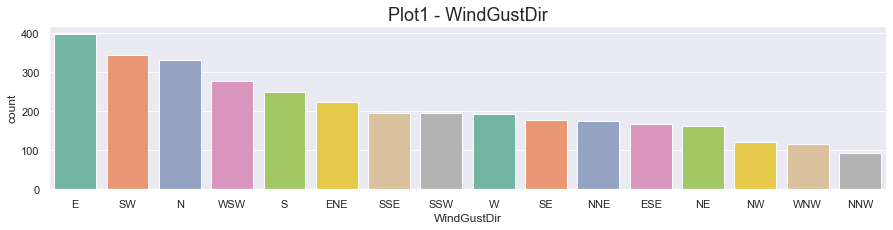

In [1460]:
#plotting each class frequency
fig = plt.figure(figsize=(15,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindGustDir",palette="Set2", data=df, order = df["WindGustDir"].value_counts().index)
plt.title('Plot1 - WindGustDir', fontsize=18)
plt.show()

In [1461]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3474, 25)


# Column8:WindGustSpeed

In [1462]:
df['WindGustSpeed'].unique() #check the unique value

array([ 35.,  33.,  19.,  30.,  50.,  46.,  31.,  22.,  39.,  52.,  44.,
        43.,  69.,  70.,  61.,  41.,  37.,  28.,  24.,  26.,  56.,  57.,
        72.,  17.,  20.,  76.,  87.,  48.,  nan,  54.,  63.,  65.,  59.,
        67.,  74.,  80.,  81.,  94., 102.,  93.,  78.,  89.,  85.,  91.,
       100.,  15.,  13.,  98.,  83.])

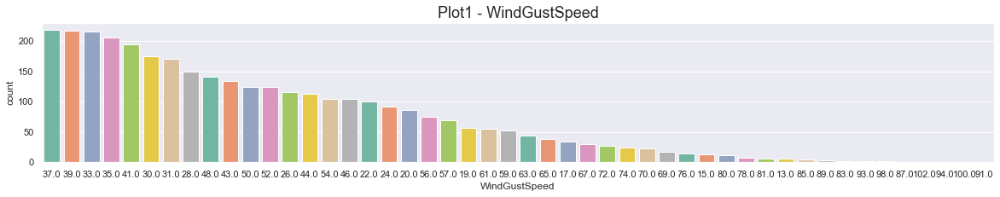

In [1463]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindGustSpeed",palette="Set2", data=df, order = df["WindGustSpeed"].value_counts().index)
plt.title('Plot1 - WindGustSpeed', fontsize=18)
plt.show()

In [1464]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['WindGustSpeed'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['WindGustSpeed'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['WindGustSpeed'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 60

 **************************************************
Check the skewness in Column:----------> 0.7134989263358971


In [1465]:
df.dropna(subset=["WindGustSpeed"], inplace=True) #drop the null values

In [1466]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['WindGustSpeed'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['WindGustSpeed'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['WindGustSpeed'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.7134989263358968


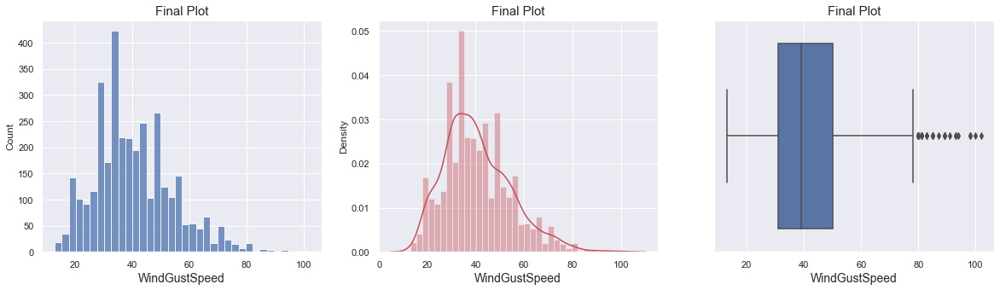

In [1467]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['WindGustSpeed']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['WindGustSpeed'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['WindGustSpeed']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)
plt.show()

In [1468]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['WindGustSpeed'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['WindGustSpeed'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['WindGustSpeed'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['WindGustSpeed'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 19.0

 **************************************************
Higher range:-
 (array([  73,  613,  670,  673,  708,  778,  811,  869,  913,  965,  969,
        986, 1166, 1307, 1323, 1360, 1380, 1415, 2025, 2117, 2352, 2353,
       2377, 2506, 2507, 2508, 2589, 2590, 2606, 2671, 2868, 2900, 2906,
       2907, 3174], dtype=int64),)

 **************************************************
Lower range:- 
 (array([], dtype=int64),)


In [1469]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3414, 25)
New Shape:------>  (3379, 25)


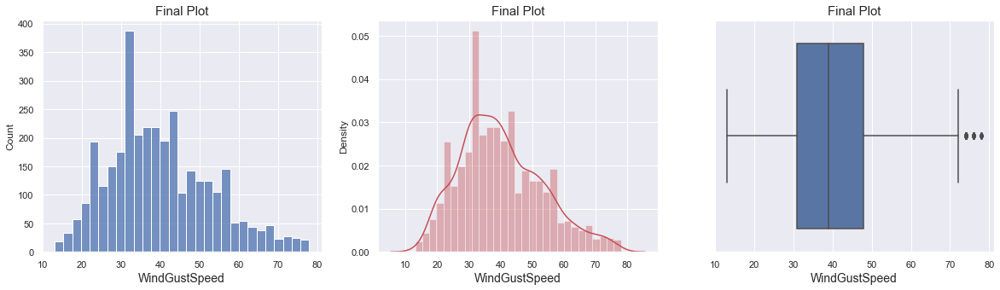

In [1470]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['WindGustSpeed']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['WindGustSpeed'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['WindGustSpeed']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)
plt.show()

In [1471]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['WindGustSpeed'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['WindGustSpeed'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['WindGustSpeed'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['WindGustSpeed'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 17.0

 **************************************************
Higher range:-
 (array([  72,  476,  674,  703,  744,  790,  791,  793,  914,  915,  925,
        946, 1036, 1074, 1078, 1090, 1096, 1225, 1239, 1276, 1278, 1294,
       1296, 1307, 1315, 1316, 1374, 1391, 1413, 1418, 1419, 2001, 2006,
       2083, 2089, 2195, 2201, 2229, 2270, 2483, 2808, 2867, 2903, 2904,
       2946, 3139], dtype=int64),)

 **************************************************
Lower range:- 
 (array([], dtype=int64),)


In [1472]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3379, 25)
New Shape:------>  (3333, 25)


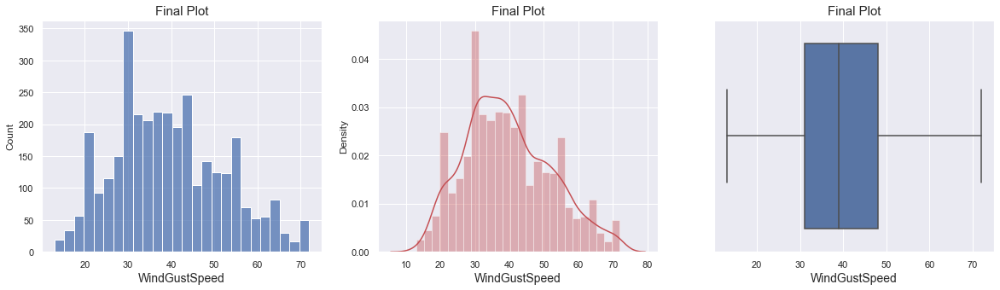

In [1473]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['WindGustSpeed']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['WindGustSpeed'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['WindGustSpeed']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('WindGustSpeed', fontsize= 14)
plt.show()

In [1474]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['WindGustSpeed'].mean())
print('median of the column--------> ',df['WindGustSpeed'].median())
print('mode of the column--------> ', st.mode(df['WindGustSpeed']))
print('std of the column:----->',df['WindGustSpeed'].std())

mean of the column------->  39.62886288628863
median of the column-------->  39.0
mode of the column-------->  37.0
std of the column:-----> 12.497585641869163


In [1475]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['WindGustSpeed'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['WindGustSpeed'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['WindGustSpeed'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.3954557081660224


Text(0.5, 1.0, 'Plot2: Location vs WindGustSpeed')

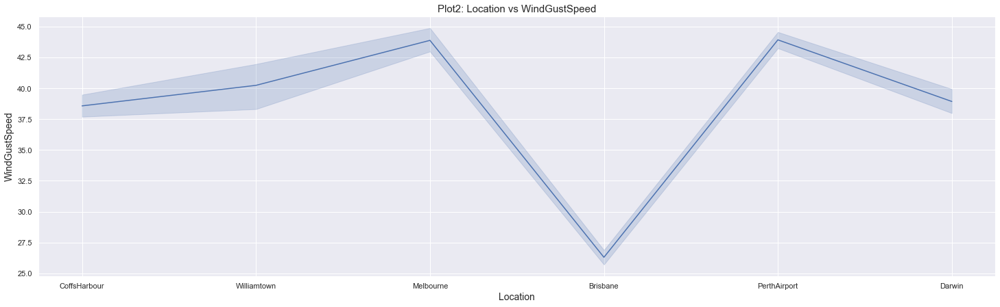

In [1476]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot2: Location vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MinTemp vs WindGustSpeed')

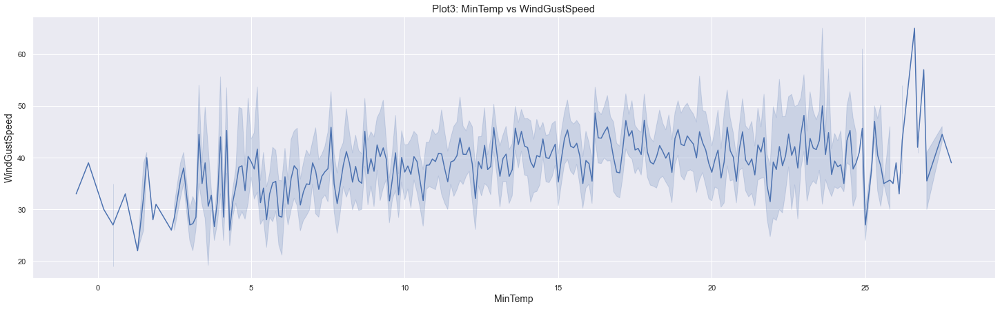

In [1477]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot3: MinTemp vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot4: MaxTemp vs WindGustSpeed')

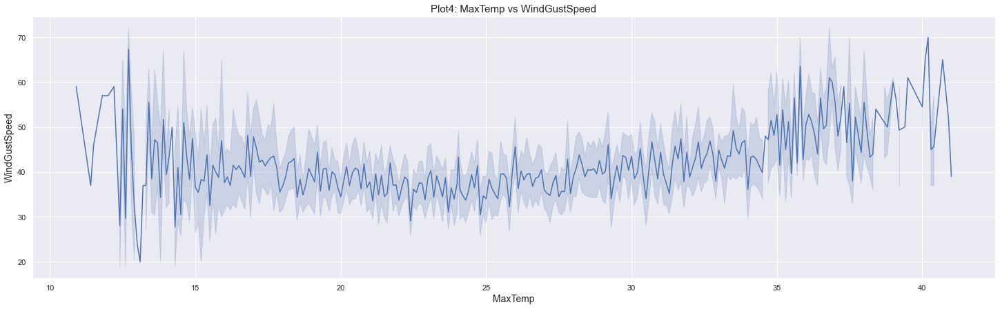

In [1478]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot4: MaxTemp vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Sunshine vs WindGustSpeed')

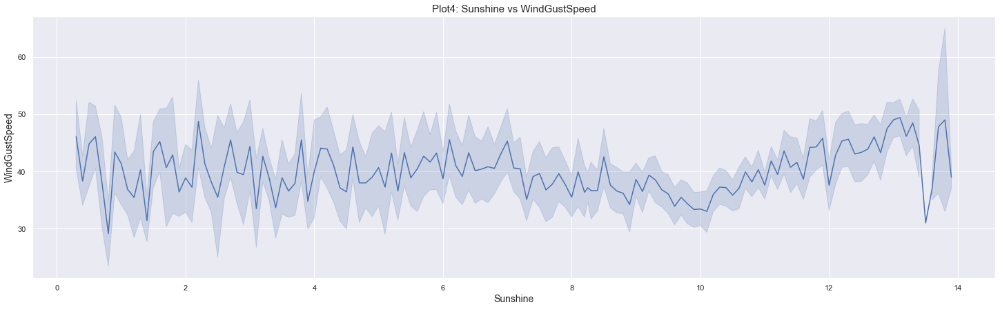

In [1479]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot4: Sunshine vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot5: WindGustDir vs WindGustSpeed')

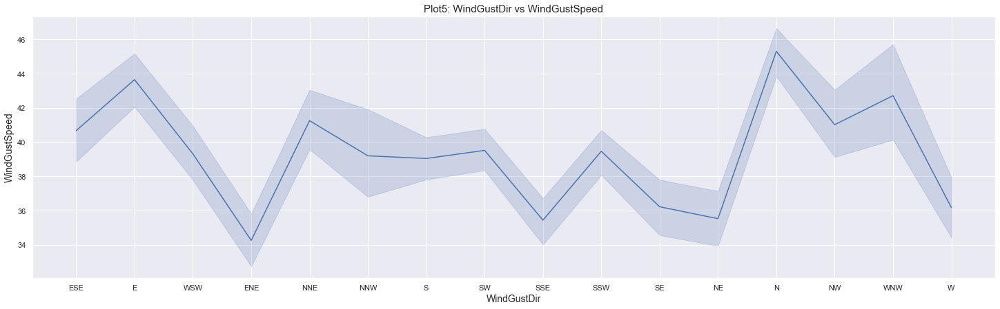

In [1480]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot5: WindGustDir vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot6: Date_Years vs WindGustSpeed')

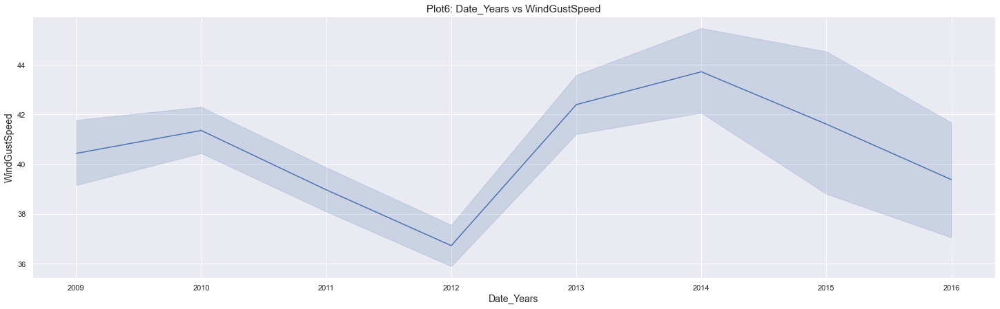

In [1481]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot6: Date_Years vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Month vs WindGustSpeed')

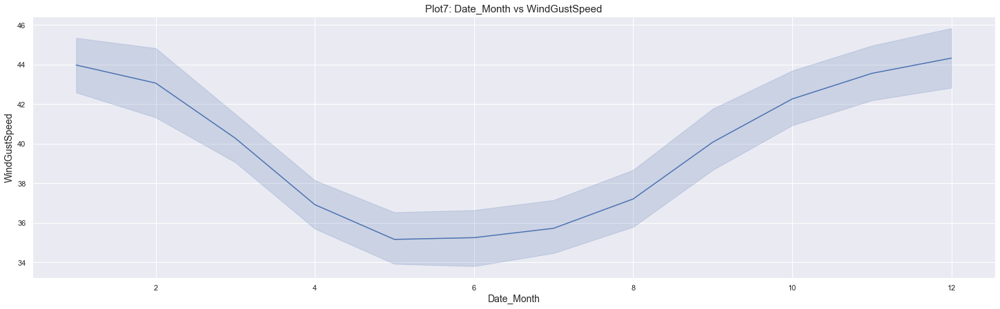

In [1482]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot7: Date_Month vs WindGustSpeed', fontsize = 15)

Observation:
- Data Cleaning
1. No zero values found
2. Null values are found and removed
3. Outliers are found and removed by IQR method
4. mean, median, mode values are improved
5. skewness is improved
- Results By EDA
1. In plot1, counts of 37.0 is higher than others
2. In plot2, brisbane have very low windspeed and perthAirport or melbourne has very high windspeed
3. In plot3 and plot4, windspeed is more as the temp increases
4. In plot5, windspeed is high at E and N and low at ENE
5. In plot6, as the years are increasing, wind speed is increasing because temperature is increasing
6. In plot7, Windspeed is 5-7 months are low

In [1483]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3333, 25)


# Column9:WindDir9am

In [1484]:
df['WindDir9am'].unique() #check the unique value

array(['SW', 'WSW', 'NNW', 'WNW', 'W', 'SSE', 'ESE', 'E', 'NW', 'NNE',
       'N', nan, 'SSW', 'S', 'NE', 'SE', 'ENE'], dtype=object)

In [1485]:
df.dropna(subset=["WindDir9am"], inplace=True) #drop the null values

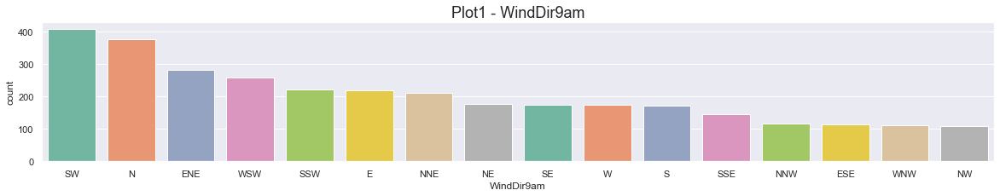

In [1486]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindDir9am",palette="Set2", data=df, order = df["WindDir9am"].value_counts().index)
plt.title('Plot1 - WindDir9am', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: WindDir9am vs Location')

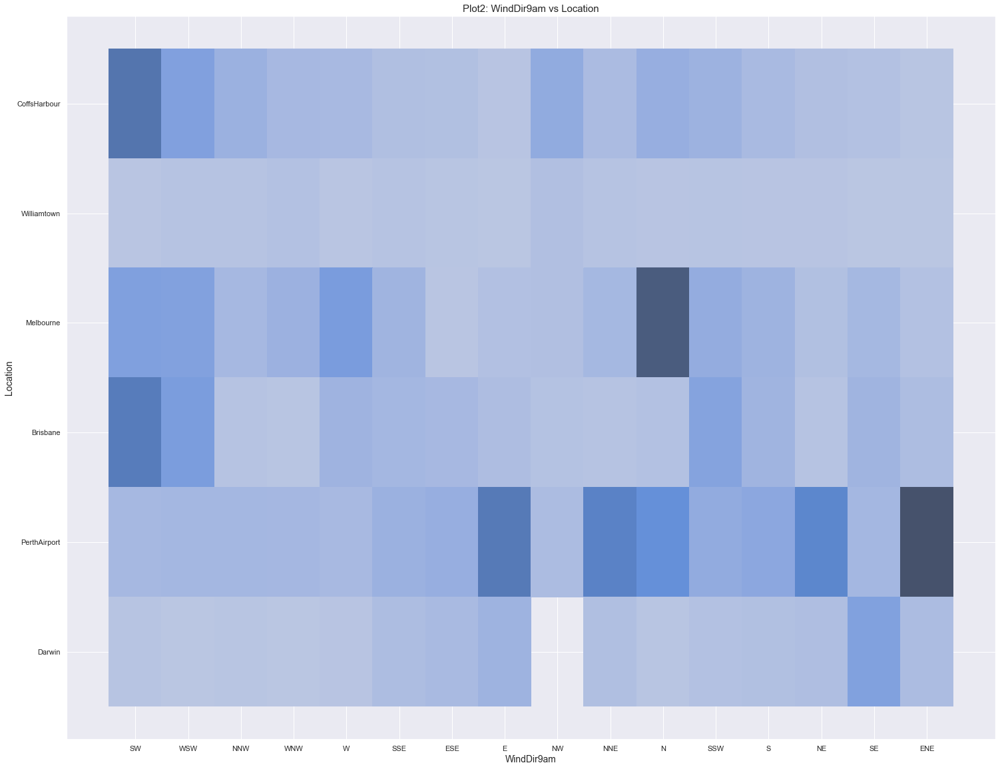

In [1487]:
#visualize this column by lineplot
plt.figure(figsize=(25,20))
sns.histplot(y= 'Location',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot2: WindDir9am vs Location', fontsize = 15)

Text(0.5, 1.0, 'Plot3: WindDir9am vs MinTemp')

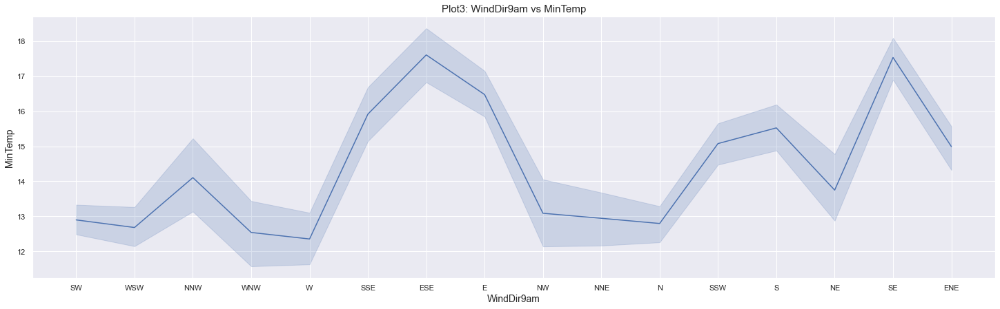

In [1488]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'MinTemp',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('MinTemp', fontsize = 14)
plt.title('Plot3: WindDir9am vs MinTemp', fontsize = 15)

Text(0.5, 1.0, 'Plot4: WindDir9am vs MaxTemp')

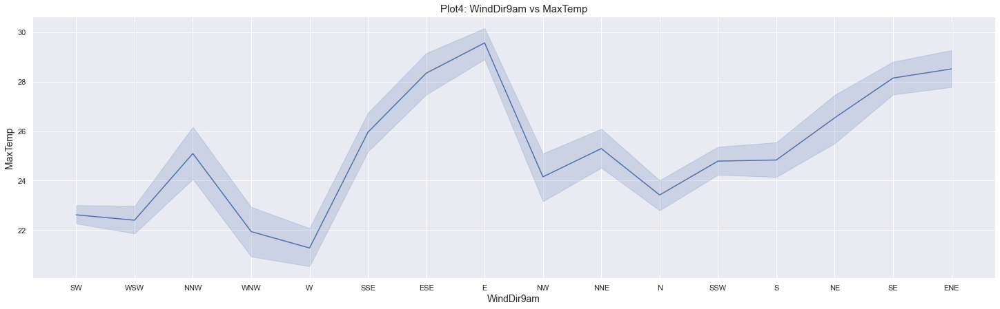

In [1489]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'MaxTemp',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('MaxTemp', fontsize = 14)
plt.title('Plot4: WindDir9am vs MaxTemp', fontsize = 15)

Text(0.5, 1.0, 'Plot5: WindDir9am vs Sunshine')

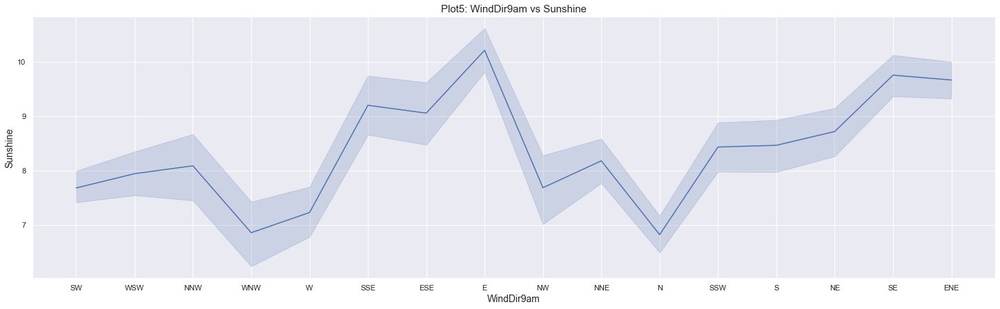

In [1490]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Sunshine',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('Sunshine', fontsize = 14)
plt.title('Plot5: WindDir9am vs Sunshine', fontsize = 15)

Observation:
- Result By EDA
1. In Plot1, SW direction has more counts than others
2. In plot2, Wind direction of Perthairport is ENE
3. In plot3, WNW, mintemp is nearby 12-13, and W mintemp is nearby 12
4. In plot4, E, maxtemp is nearby 30, and WNW and N maxtemp is nearby 7
5. In plot5, E, sunshine is nearly 12

In [1491]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3279, 25)


# Column10:WindDir3pm

In [1492]:
df['WindDir3pm'].unique() #check the unique value

array(['ESE', 'S', 'ENE', 'NE', 'NNE', 'NNW', 'SE', 'SSE', 'SSW', 'E',
       'WSW', 'N', 'NW', 'W', 'SW', 'WNW', nan], dtype=object)

In [1493]:
df.dropna(subset=["WindDir3pm"], inplace=True) #drop the null values

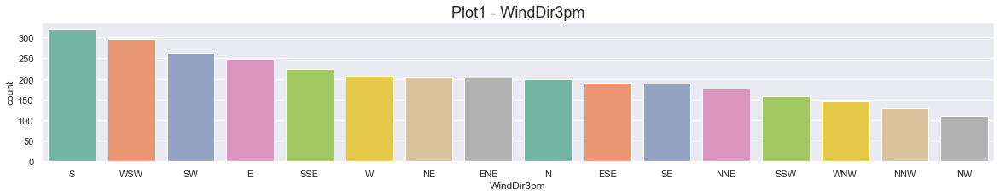

In [1494]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindDir3pm",palette="Set2", data=df, order = df["WindDir3pm"].value_counts().index)
plt.title('Plot1 - WindDir3pm', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: WindDir3pm vs Location')

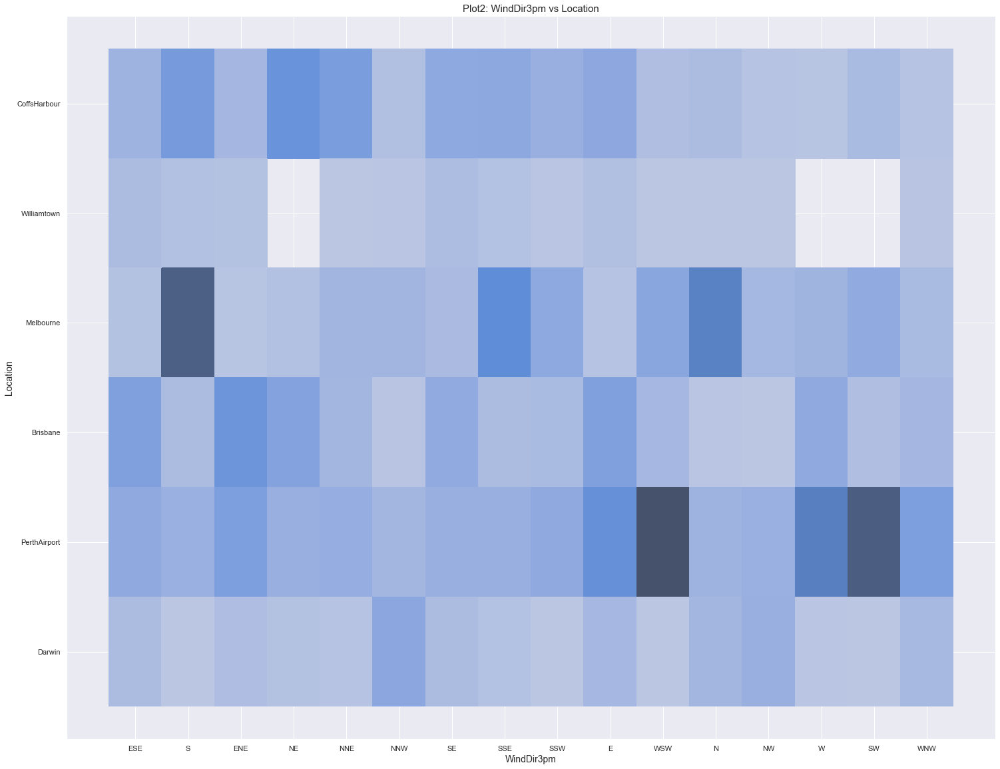

In [1495]:
#visualize this column by lineplot
plt.figure(figsize=(25,20))
sns.histplot(y= 'Location',x= 'WindDir3pm', data=df)
plt.xlabel('WindDir3pm', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot2: WindDir3pm vs Location', fontsize = 15)

Text(0.5, 1.0, 'Plot3: WindDir3pm vs MinTemp')

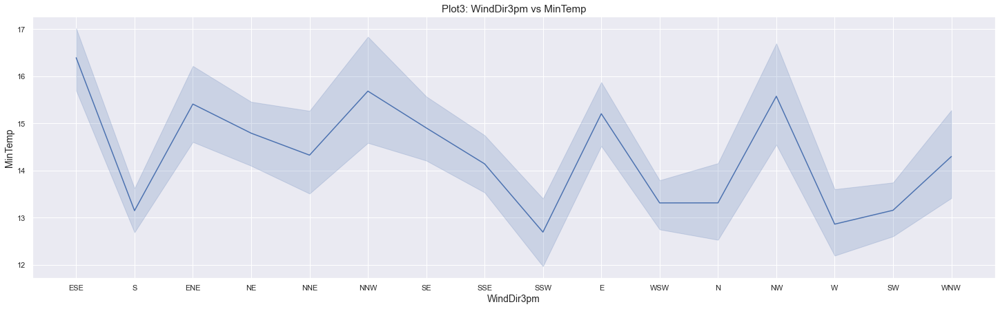

In [1496]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'MinTemp',x= 'WindDir3pm', data=df)
plt.xlabel('WindDir3pm', fontsize = 14)
plt.ylabel('MinTemp', fontsize = 14)
plt.title('Plot3: WindDir3pm vs MinTemp', fontsize = 15)

Text(0.5, 1.0, 'Plot4: WindDir3pm vs MaxTemp')

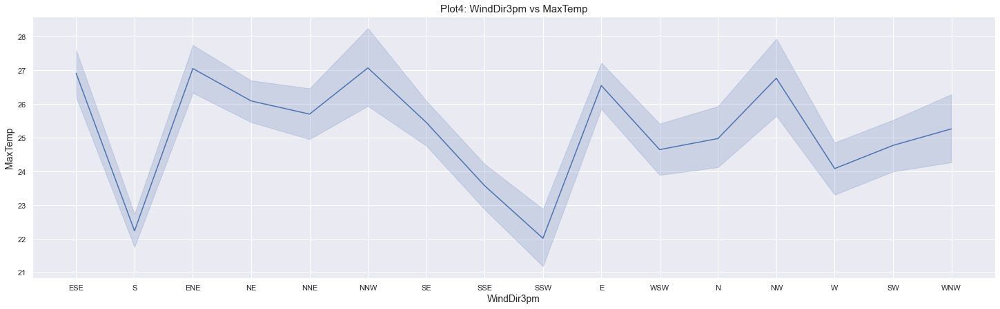

In [1497]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'MaxTemp',x= 'WindDir3pm', data=df)
plt.xlabel('WindDir3pm', fontsize = 14)
plt.ylabel('MaxTemp', fontsize = 14)
plt.title('Plot4: WindDir3pm vs MaxTemp', fontsize = 15)

Text(0.5, 1.0, 'Plot5: WindDir3pm vs Sunshine')

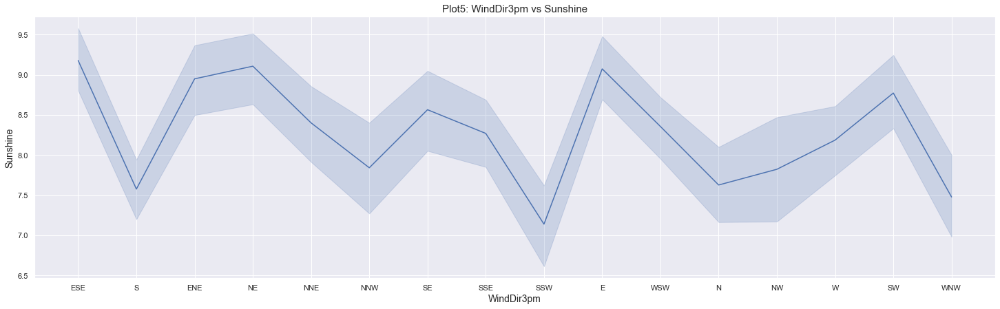

In [1498]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Sunshine',x= 'WindDir3pm', data=df)
plt.xlabel('WindDir3pm', fontsize = 14)
plt.ylabel('Sunshine', fontsize = 14)
plt.title('Plot5: WindDir3pm vs Sunshine', fontsize = 15)

Observation:
- Result By EDA
1. In Plot1, South direction has more counts than others
2. In plot2, Wind direction of Perthairport is SW and WSW
3. In plot3, ESE, mintemp is nearby 16.5, and SSW mintemp is nearby 12
4. In plot4, NNW, maxtemp is nearby 27.5, and S maxtemp is nearby 22.5
5. In plot5, ESE, sunshine is nearly 9

In [1499]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3266, 25)


# Column11:WindSpeed9am

In [1500]:
df['WindSpeed9am'].unique() #check the unique value

array([17.,  6.,  7., 13.,  9., 11., 19., 24., 20., 26., 43., 33., 22.,
       15., 35., 28., 39.,  4.,  2., 30., 31., 41., 37., 52., 46., 44.,
       50., 48., 54.])

In [1501]:
df['WindSpeed9am'].value_counts() #check the counts of unique value

9.0     336
13.0    316
11.0    258
7.0     240
17.0    235
6.0     234
20.0    210
15.0    197
4.0     173
24.0    171
19.0    155
22.0    148
28.0    121
26.0    114
2.0      81
31.0     75
30.0     59
35.0     34
33.0     34
37.0     17
39.0     14
41.0     14
43.0      9
44.0      9
52.0      5
46.0      4
48.0      1
50.0      1
54.0      1
Name: WindSpeed9am, dtype: int64

In [1502]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['WindSpeed9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['WindSpeed9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['WindSpeed9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.780960422883


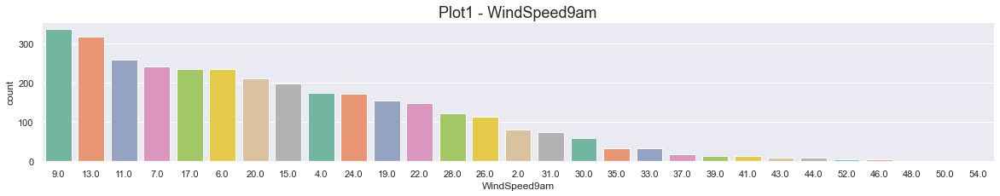

In [1503]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindSpeed9am",palette="Set2", data=df, order = df["WindSpeed9am"].value_counts().index)
plt.title('Plot1 - WindSpeed9am', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs WindSpeed9am')

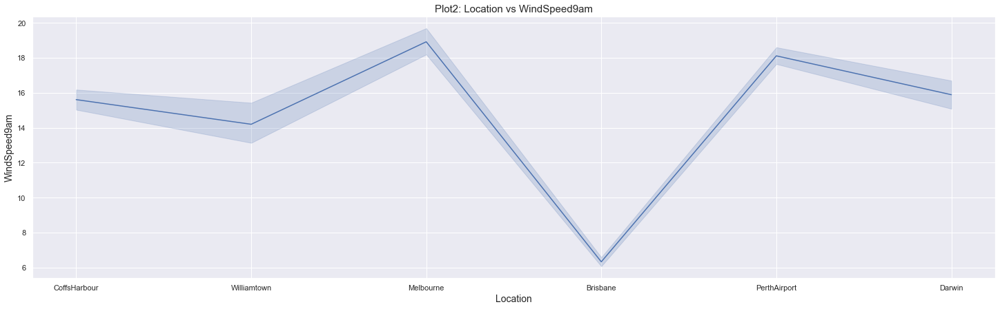

In [1504]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot2: Location vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MinTemp vs WindSpeed9am')

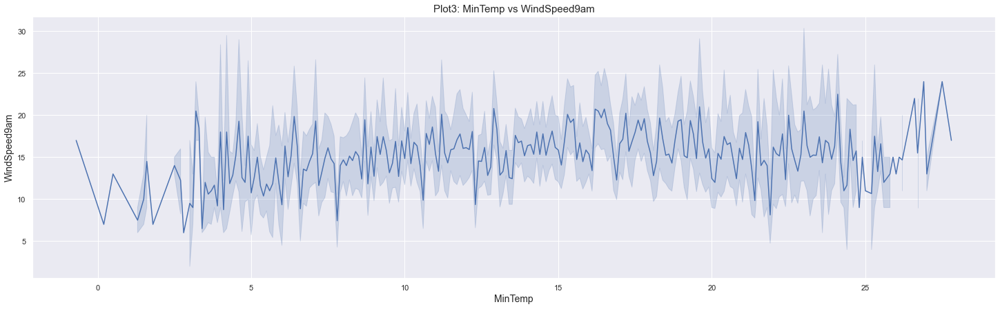

In [1505]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot3: MinTemp vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot4: MaxTemp vs WindSpeed9am')

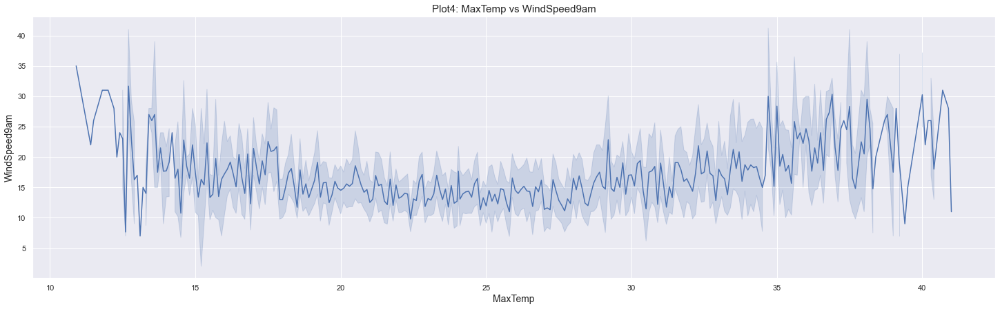

In [1506]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot4: MaxTemp vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Sunshine vs WindSpeed9am')

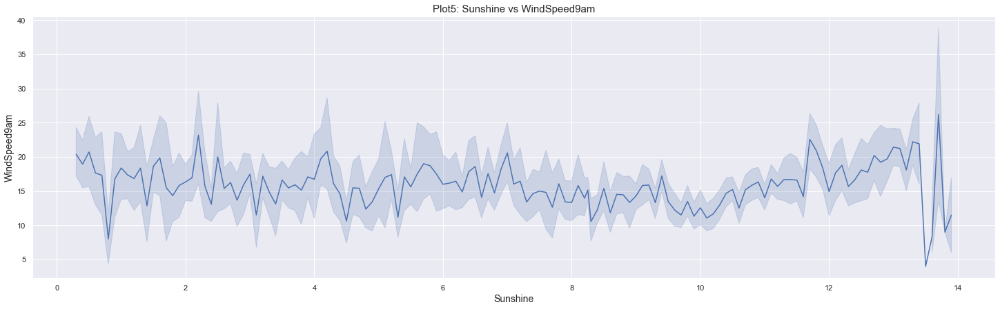

In [1507]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot5: Sunshine vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot6: WindGustDir vs WindSpeed9am')

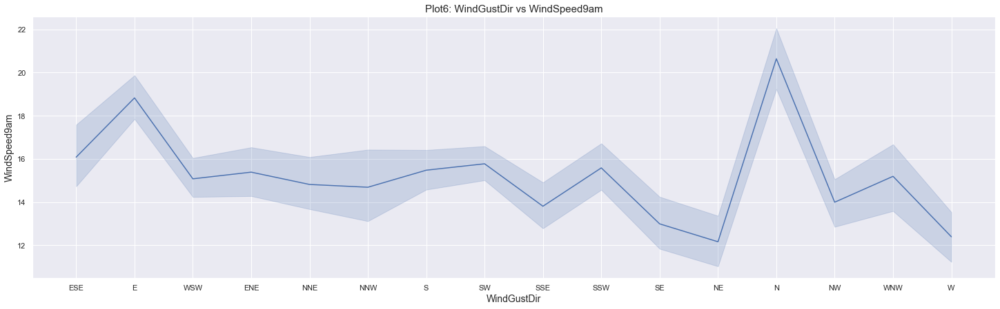

In [1508]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot6: WindGustDir vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Years vs WindSpeed9am')

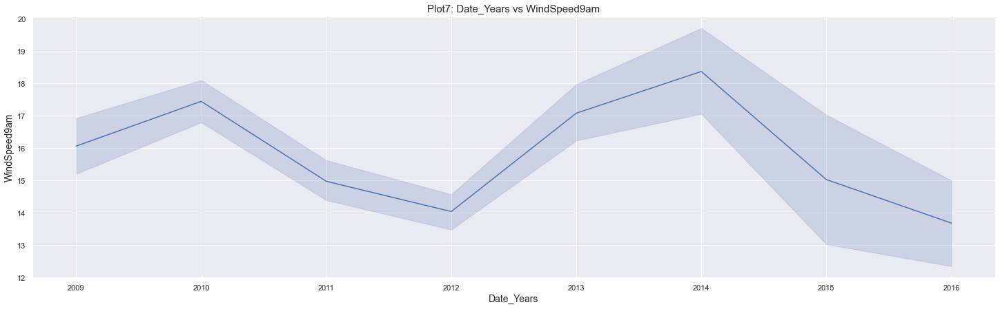

In [1509]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot7: Date_Years vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot8: Date_Month vs WindSpeed9am')

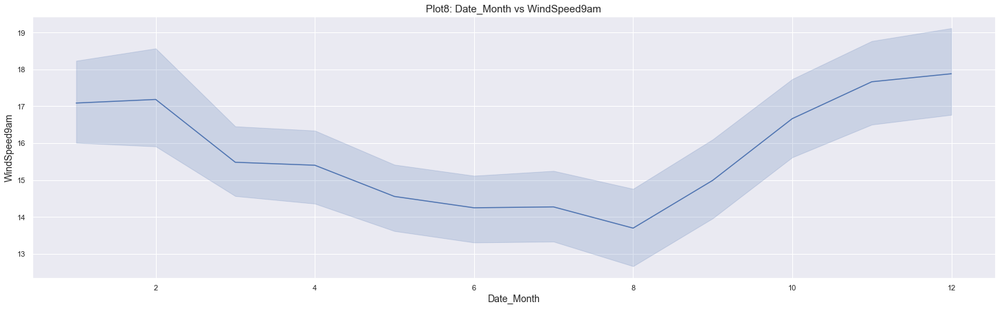

In [1510]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot8: Date_Month vs WindSpeed9am', fontsize = 15)

Observation:
- Results By EDA
1. In plot1, counts of 9.0 is higher than others
2. In plot2, brisbane have very low windspeed and perthAirport or melbourne has very high windspeed
3. In plot3 and plot4, windspeed is more as the temp increases
4. In plot5, As the sunshine increases, windspeed increases
5. In plot6, windspeed is high at E and N and low at NE and W
6. In plot7, as the years are increasing, wind speed is increasing because temperature is increasing
7. In plot8, Windspeed is 7-8 months are low and 10-12 monthhs are high

In [1511]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3266, 25)


# Column12:WindSpeed3pm

In [1512]:
df['WindSpeed3pm'].unique() #check the unique value

array([22., 13.,  9., 20., 35., 31.,  7., 19., 24., 15., 17., 28., 30.,
       11., 26., 41., 39., 37.,  6.,  4., 33., 44., 43., 46.,  2., 48.,
       50.])

In [1513]:
df['WindSpeed3pm'].value_counts() #check the counts of unique value

13.0    287
20.0    277
17.0    254
24.0    250
15.0    222
9.0     216
11.0    216
19.0    214
22.0    212
28.0    197
26.0    190
30.0    131
31.0    126
7.0     103
6.0      92
33.0     68
35.0     51
4.0      46
39.0     34
37.0     33
2.0      18
41.0     13
43.0      6
44.0      4
46.0      3
48.0      2
50.0      1
Name: WindSpeed3pm, dtype: int64

In [1514]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['WindSpeed3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['WindSpeed3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['WindSpeed3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.29180274615022267


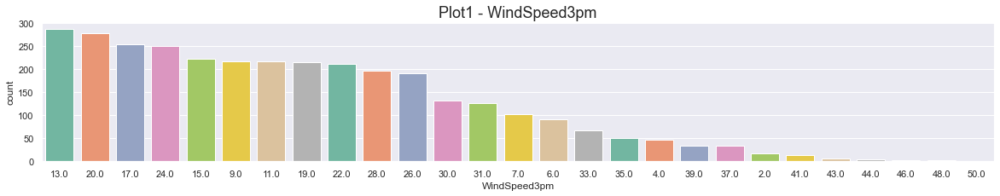

In [1515]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindSpeed3pm",palette="Set2", data=df, order = df["WindSpeed3pm"].value_counts().index)
plt.title('Plot1 - WindSpeed3pm', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs WindSpeed3pm')

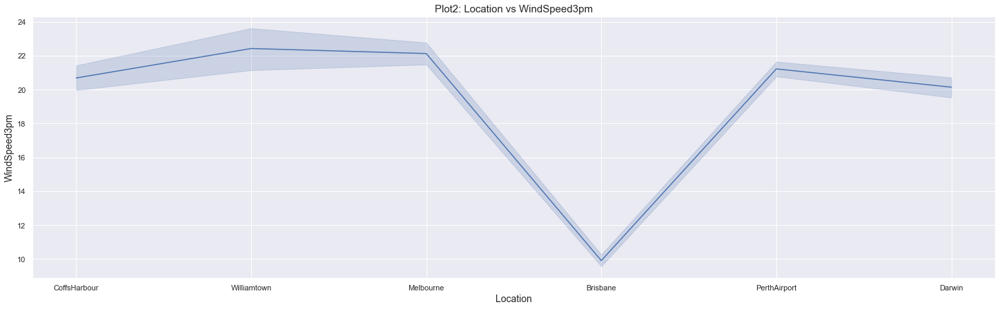

In [1516]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot2: Location vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MinTemp vs WindSpeed3pm')

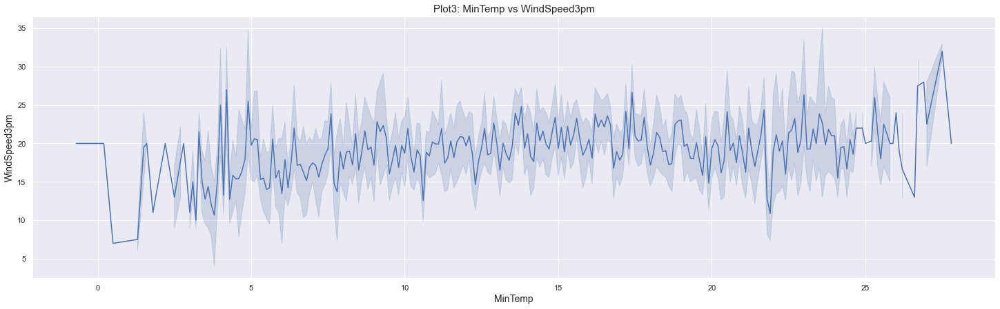

In [1517]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot3: MinTemp vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot4: MaxTemp vs WindSpeed3pm')

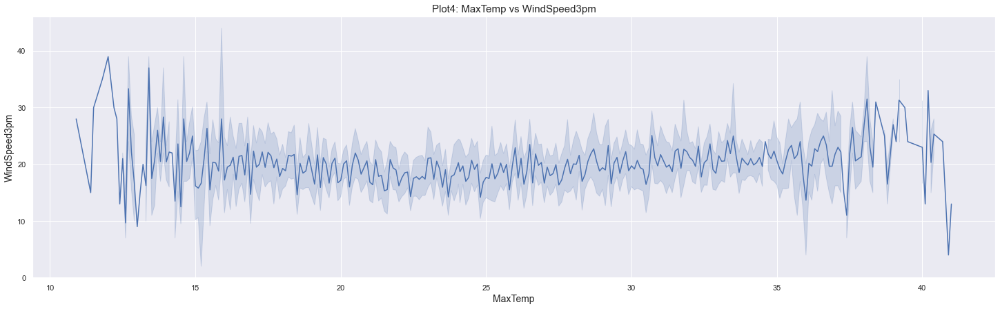

In [1518]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot4: MaxTemp vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Sunshine vs WindSpeed3pm')

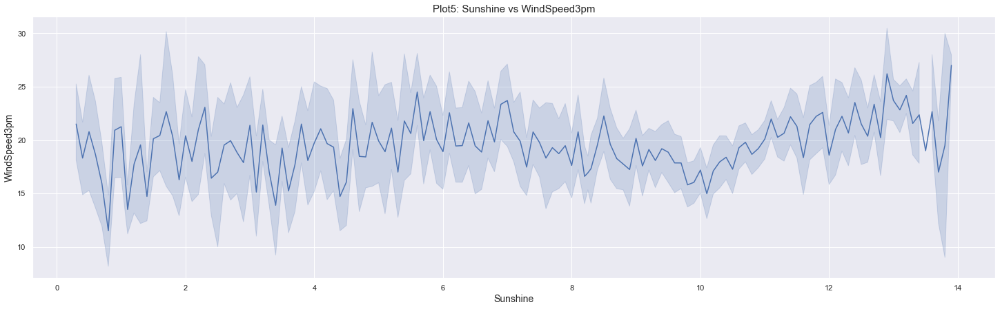

In [1519]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot5: Sunshine vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot6: WindGustDir vs WindSpeed3pm')

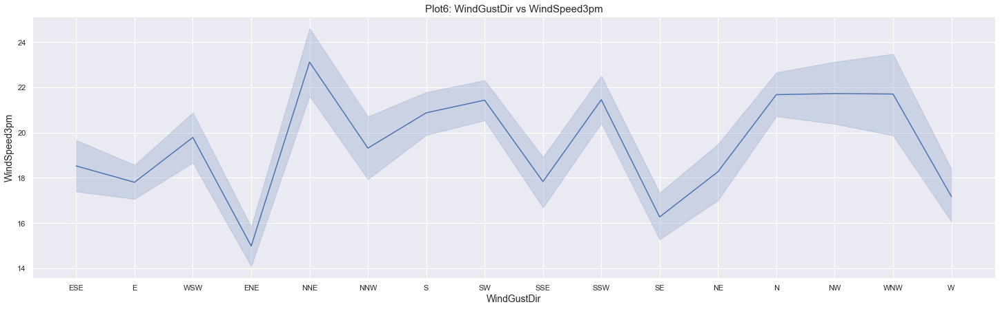

In [1520]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot6: WindGustDir vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Years vs WindSpeed3pm')

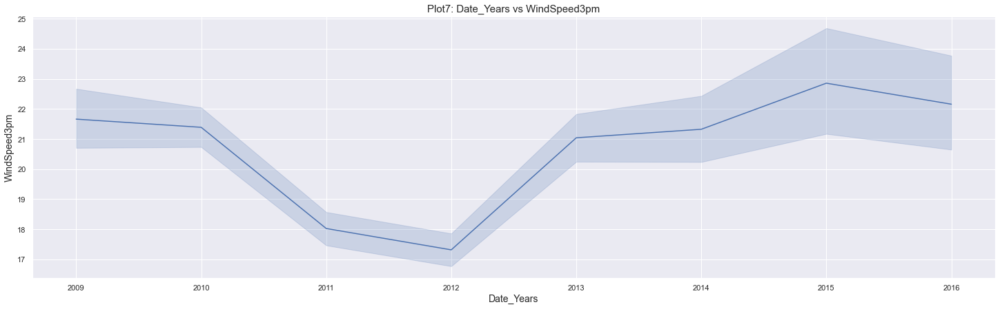

In [1521]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot7: Date_Years vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot8: Date_Month vs WindSpeed3pm')

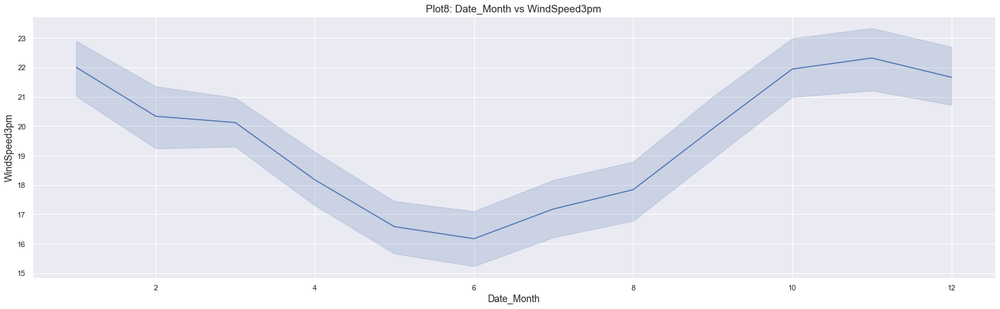

In [1522]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot8: Date_Month vs WindSpeed3pm', fontsize = 15)

Observation:
- Results By EDA
1. In plot1, counts of 13.0 is higher than others
2. In plot2, brisbane have very low windspeed and perthAirport or melbourne has very high windspeed
3. In plot3 and plot4, windspeed is more as the temp increases
4. In plot5, As the sunshine increases, windspeed increases
5. In plot6, windspeed is high at NNE  and low at ENE
6. In plot7, as the years are increasing, wind speed is increasing because temperature is increasing,except 2011-2012
7. In plot8, Windspeed is 6-7 months are low and 10-12 monthhs are high

In [1523]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3266, 25)


# Column13:Humidity9am

In [1524]:
df['Humidity9am'].unique() #check the unique value

array([83., 85., 84., 68., 67., 90., 82., 73., 76., 77., 78., 75., 65.,
       72., 71., 89., 88., 92., 95., 70., 63., 54., 50., 60., 61., 94.,
       86., 66., 53., 42., 48., 57., 52., 69., 74., 91., 62., 55., 80.,
       79., 93., 59., 56., 96., 97., 46., 47., 58., 64., 41., 44., 36.,
       29., 30., 32., 51., 39., 37., 35., 21., 23., 34., 49., 45., 27.,
       81., 87., 40., 38., 43., 33., 28., 25., nan, 99., 31., 98., 18.,
       12., 11., 22., 24., 26., 20., 19., 17., 15.])

In [1525]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Humidity9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Humidity9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Humidity9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 1

 **************************************************
Check the skewness in Column:----------> -0.18459259670343212


In [1526]:
df.dropna(subset=["Humidity9am"], inplace=True) #drop the null values

In [1527]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Humidity9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Humidity9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Humidity9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.1845925967034321


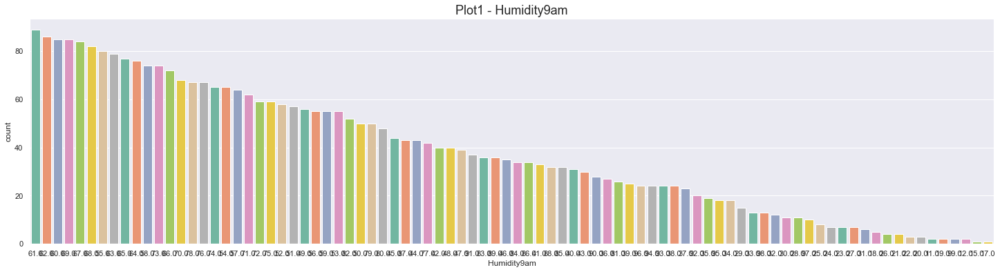

In [1528]:
#plotting each class frequency
fig = plt.figure(figsize=(25,6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Humidity9am",palette="Set2", data=df, order = df["Humidity9am"].value_counts().index)
plt.title('Plot1 - Humidity9am', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot1: Location vs Humidity9am')

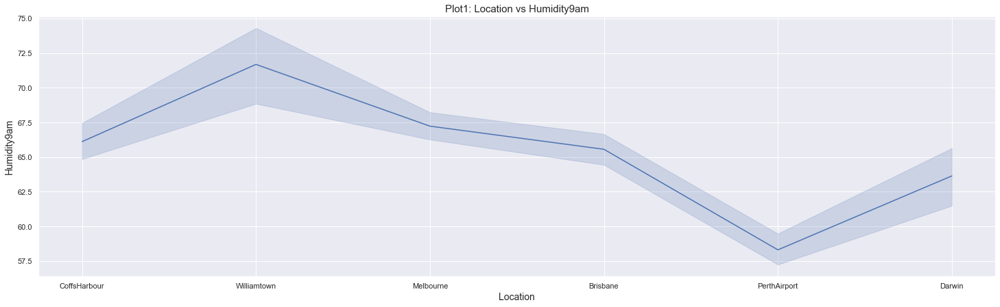

In [1529]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot1: Location vs Humidity9am', fontsize = 15)

Text(0.5, 1.0, 'Plot2: MinTemp vs Humidity9am')

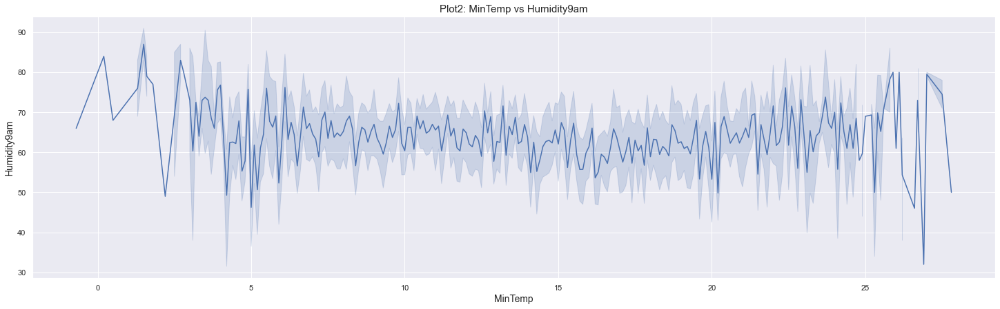

In [1530]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot2: MinTemp vs Humidity9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MaxTemp vs Humidity9am')

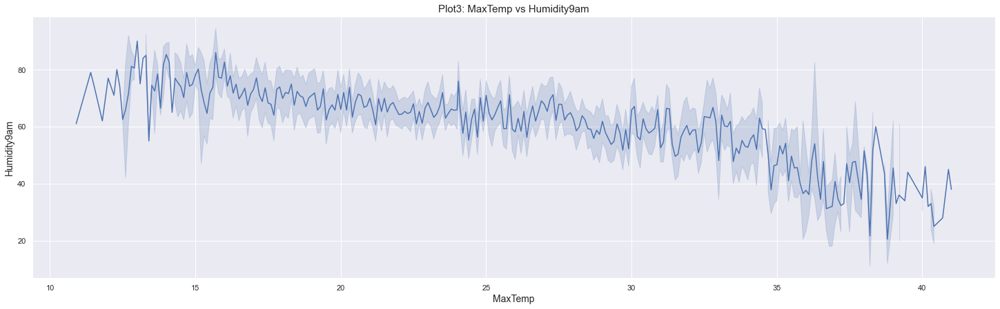

In [1531]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot3: MaxTemp vs Humidity9am', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Sunshine vs Humidity9am')

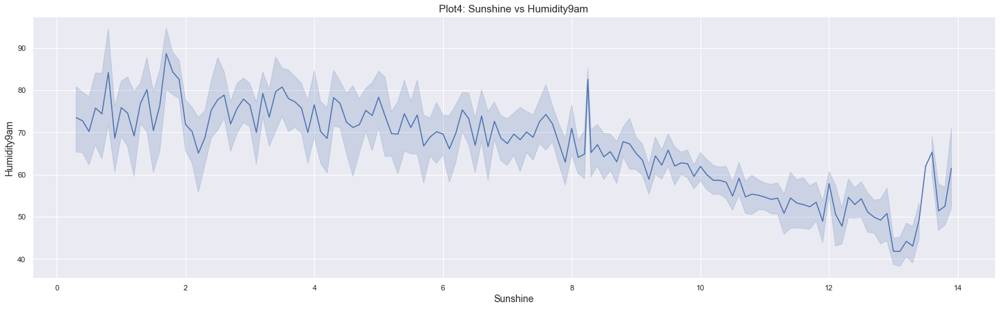

In [1532]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot4: Sunshine vs Humidity9am', fontsize = 15)

Text(0.5, 1.0, 'Plot5: WindGustDir vs Humidity9am')

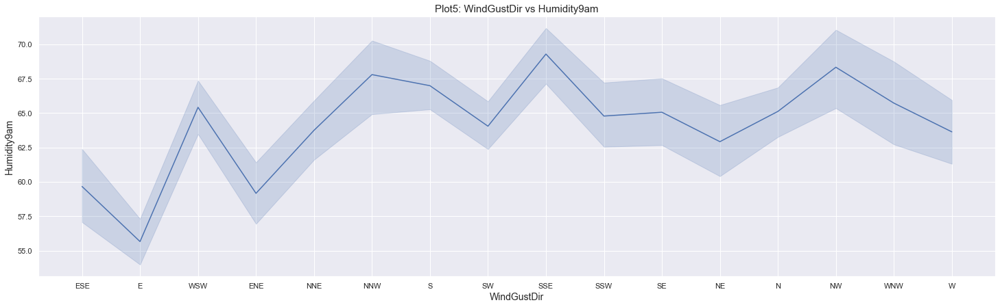

In [1533]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot5: WindGustDir vs Humidity9am', fontsize = 15)

Text(0.5, 1.0, 'Plot6: Date_Years vs Humidity9am')

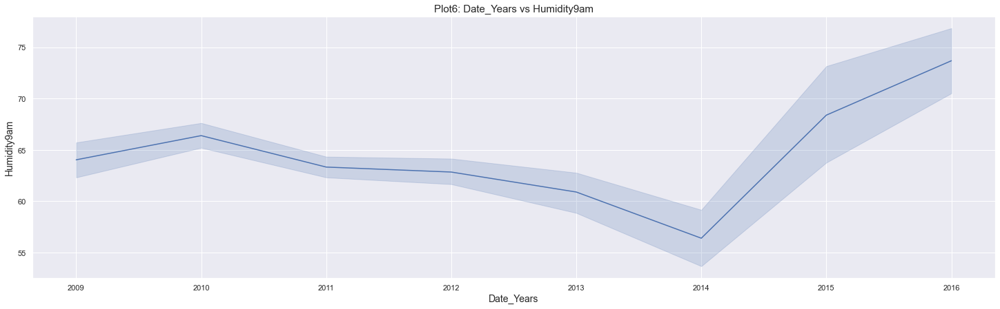

In [1534]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot6: Date_Years vs Humidity9am', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Month vs Humidity9am')

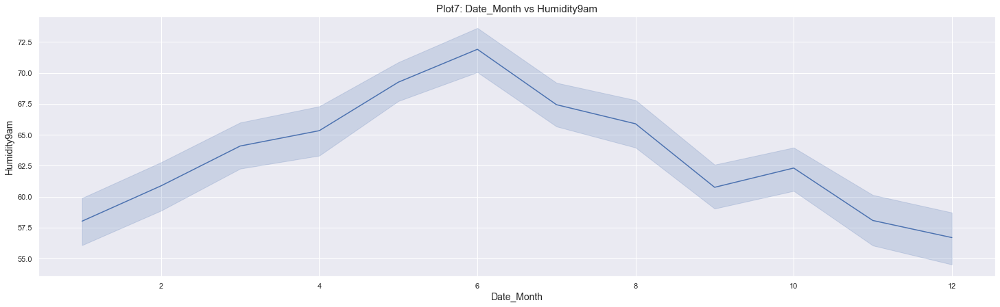

In [1535]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title('Plot7: Date_Month vs Humidity9am', fontsize = 15)

Observation:
- DataCleaning
1. Null values are found
2. No zero values are found
3. No outliers are found
- Results By EDA
1. In plot1, count of 61 is higher than others
2. In plot2, Humidity is perthairport is very less and williamtown is very high
3. In plot3, Mintemp is almost constant at certain periodn of humidity
4. In plot4, As temp increases, Humidity decreases
5. In plot5, humidity is increasing towards from E to W
6. In plot6, 2014 has very less humidity and 2016 has very high humidity
7. In plot7, at 6th month humidity is very high

In [1536]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3265, 25)


# Column14:Humidity3pm

In [1537]:
df['Humidity3pm'].unique() #check the unique value

array([60., 90., 65., 68., 77., 64., 66., 69., 70., 63., 56., 49., 52.,
       92., 73., 89., 97., 84., 71., 81., 95., 88., 54., 74., 61., 55.,
       50., 58., 32., 43., 40., 57., 53., 59., 35., 42., 51., 72., 85.,
       76., 48., 45., 78., 80., 47., 39., 23., 31., 37., 46., 44., 36.,
       41., 33., 38., 83., 20., 15., 11., 18., 94., 13., 75., 91., 62.,
       67., 96., 79., 93., 87., 82., 26., 34., 30., 29., 86., 24., 25.,
       28., 21., 22., 19.,  8., 10., 16., 27., nan, 17., 98.,  6., 12.,
       14.,  9.,  7.])

In [1538]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Humidity3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Humidity3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Humidity3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 1

 **************************************************
Check the skewness in Column:----------> 0.19506533804659404


In [1539]:
df.dropna(subset=["Humidity3pm"], inplace=True) #drop the null values

In [1540]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Humidity3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Humidity3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Humidity3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.19506533804659404


In [1541]:
df['Humidity3pm'].value_counts() #check the counts of unique value

54.0    94
49.0    86
40.0    83
45.0    82
53.0    81
        ..
8.0      3
96.0     3
7.0      2
98.0     1
6.0      1
Name: Humidity3pm, Length: 93, dtype: int64

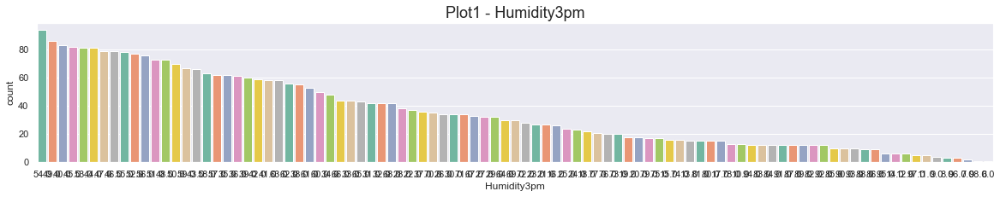

In [1542]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Humidity3pm",palette="Set2", data=df, order = df["Humidity3pm"].value_counts().index)
plt.title('Plot1 - Humidity3pm', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs Humidity3pm')

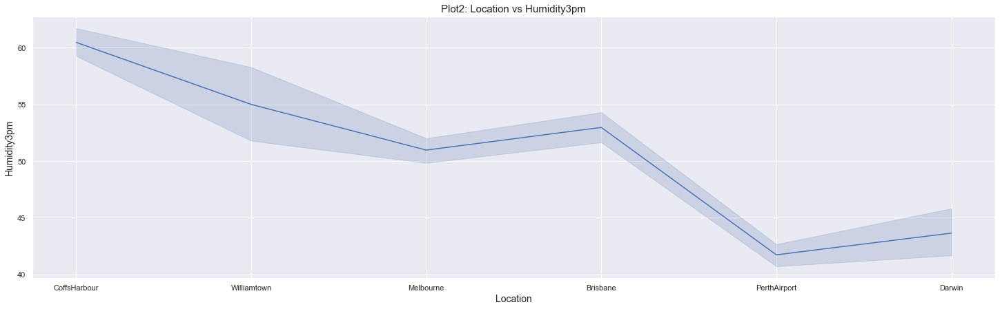

In [1543]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot2: Location vs Humidity3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MinTemp vs Humidity3pm')

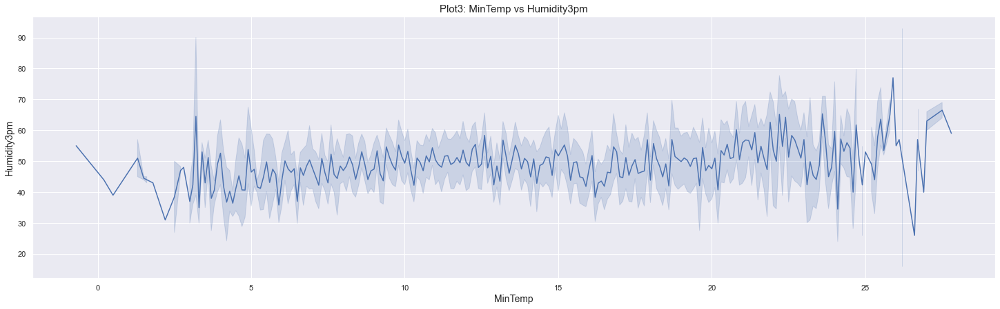

In [1544]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot3: MinTemp vs Humidity3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot4: MaxTemp vs Humidity3pm')

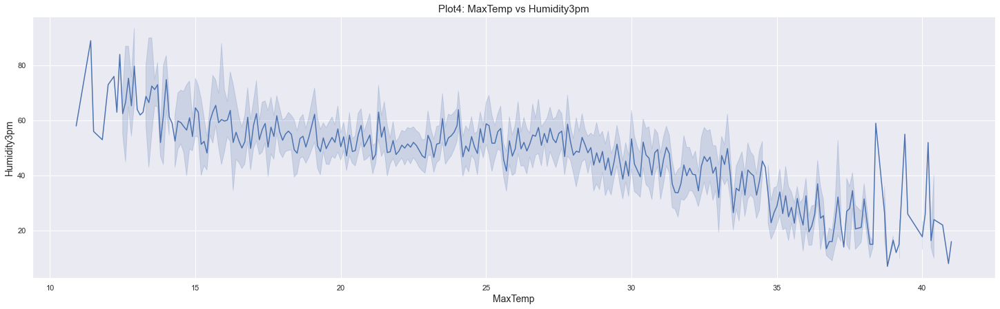

In [1545]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot4: MaxTemp vs Humidity3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Sunshine vs Humidity3pm')

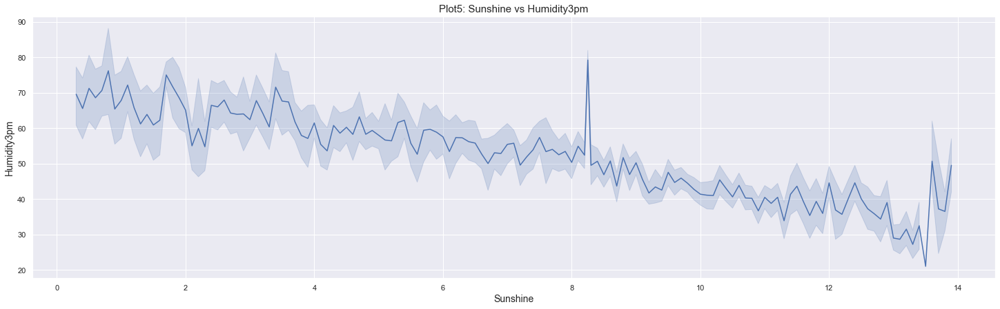

In [1546]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot5: Sunshine vs Humidity3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot6: WindGustDir vs Humidity3pm')

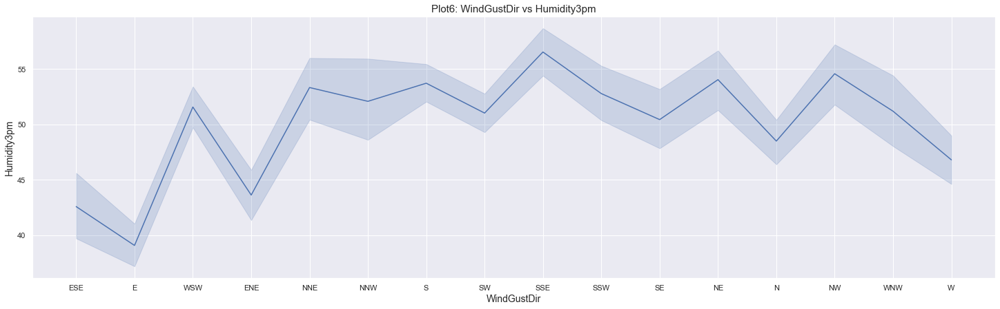

In [1547]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot6: WindGustDir vs Humidity3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Years vs Humidity3pm')

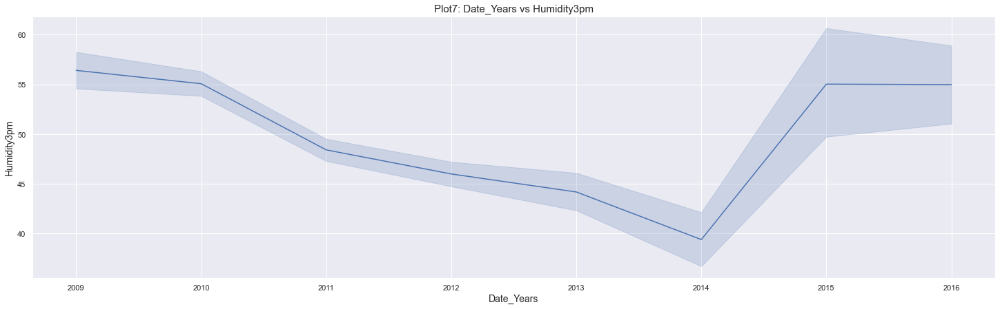

In [1548]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot7: Date_Years vs Humidity3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot8: Date_Month vs Humidity3pm')

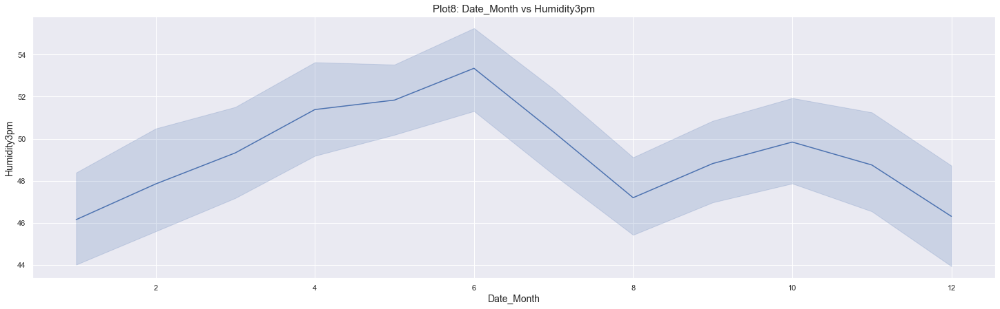

In [1549]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title('Plot8: Date_Month vs Humidity3pm', fontsize = 15)

Observation:
- DataCleaning
1. Null values are found
2. No zero values are found
3. No outliers are found
- Results By EDA
1. In plot1, count of 54 is higher than others
2. In plot2, Humidity is perthairport is very less and coffsharbour is very high
3. In plot3, Mintemp is sligthly increasing with humidity
4. In plot4, we can see, decreasing curve of humidity and maxtemp
4. In plot5, we can see, decreasing curve of humidity and sunshine
5. In plot6, humidity is increasing towards from E to W
6. In plot7, 2014 has very less humidity and 2016 has very high humidity
7. In plot8, at 6th month humidity is very high

In [1550]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3264, 25)


# Column15:Pressure9am

In [1551]:
df['Pressure9am'].unique() #check the unique value

array([1018.9, 1020.7, 1021.5, 1016.3, 1012.9, 1010.3, 1012. , 1017.9,
       1017.2, 1016.9, 1016.7, 1017. , 1017.6, 1020.2, 1021.9, 1022.2,
       1022.8, 1021.4, 1017.7, 1009.9, 1014.3, 1019.8, 1016.4, 1017.5,
       1022.7, 1025. , 1024.4, 1024.5, 1025.7, 1023.9, 1020.8, 1012.2,
       1015.3, 1014. , 1013.3, 1017.1, 1020.1, 1019.3, 1014.7, 1007. ,
       1007.3, 1015.1, 1018.8, 1020.5, 1017.4, 1023.5, 1023.8, 1025.2,
       1027.2, 1028.3, 1027.7, 1024.7, 1022.5, 1023. , 1020.9, 1015.7,
       1013.6, 1022.6, 1018.2, 1017.3, 1023.6, 1019.9, 1030.8, 1030.9,
       1028.9, 1016.5, 1014.2, 1016.8, 1025.3, 1019.5, 1019.6, 1015.8,
       1012.7, 1006.7, 1007.1, 1013.2, 1010. , 1011.1, 1006.9, 1012.3,
       1016. , 1021.2, 1021.8, 1026.2, 1026.5, 1023.4, 1020.4, 1009.1,
       1009.6, 1015.5, 1022.3, 1025.6, 1016.6, 1013.5, 1026.4, 1014.6,
       1022.9, 1024.9, 1027.6, 1021.7, 1023.1, 1024.2, 1018. , 1019.4,
       1013.7, 1026.7, 1027.8, 1021.1, 1013.9, 1011.9, 1014.1, 1020. ,
      

In [1552]:
df['Pressure9am'].value_counts() #check the counts of unique value

1014.8    29
1020.0    27
1016.4    27
1014.1    26
1018.6    26
          ..
1029.1     1
1033.8     1
1004.9     1
1002.0     1
1000.6     1
Name: Pressure9am, Length: 336, dtype: int64

In [1553]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Pressure9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Pressure9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Pressure9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 1

 **************************************************
Check the skewness in Column:----------> 0.11342088870460282


In [1554]:
df.dropna(subset=["Pressure9am"], inplace=True) #drop the null values

In [1555]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Pressure9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Pressure9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Pressure9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.11342088870460282


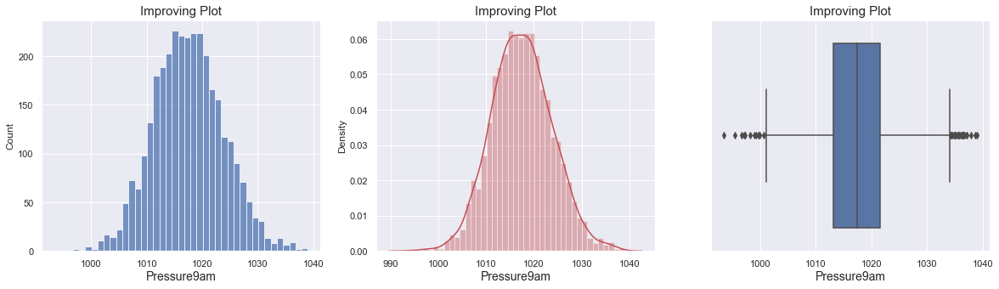

In [1556]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)
plt.show()

In [1557]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Pressure9am'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Pressure9am'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Pressure9am'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Pressure9am'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.399999999999977

 **************************************************
Higher range:-
 (array([ 427,  784,  785,  871,  877,  878,  879,  903,  905,  906, 1188,
       1189, 1190, 1203, 1233, 1234, 1235, 2125, 2126, 2127, 2128, 2129,
       2664, 2705], dtype=int64),)

 **************************************************
Lower range:- 
 (array([ 650,  651,  684,  919,  929,  937,  976, 1096, 1181, 1354, 1940,
       2642], dtype=int64),)


In [1558]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3263, 25)
New Shape:------>  (3227, 25)


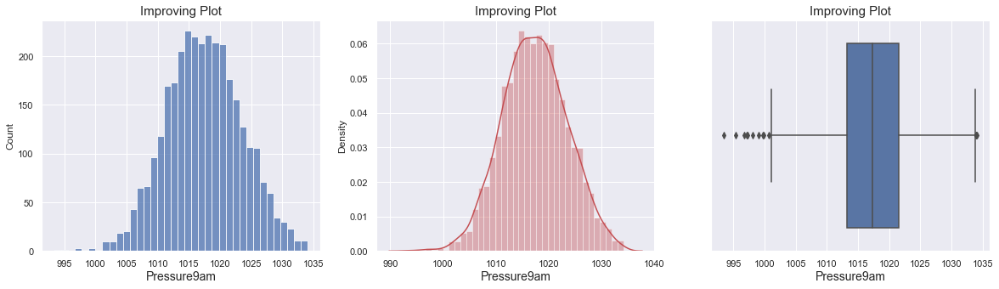

In [1559]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)
plt.show()

In [1560]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Pressure9am'], 30,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Pressure9am'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Pressure9am'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Pressure9am'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 7.399999999999977

 **************************************************
Higher range:-
 (array([ 427,  460,  779,  892, 1254, 2039, 2041, 2042, 2338, 2339, 2340,
       2364, 2365, 2651, 2652], dtype=int64),)

 **************************************************
Lower range:- 
 (array([ 180,  230,  277,  530,  649,  681,  687,  906,  923,  927,  960,
       1021, 1044, 1079, 1107, 1137, 1163, 1328, 1609, 1659, 1905, 1913,
       2227, 2232, 2609], dtype=int64),)


In [1561]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3227, 25)
New Shape:------>  (3187, 25)


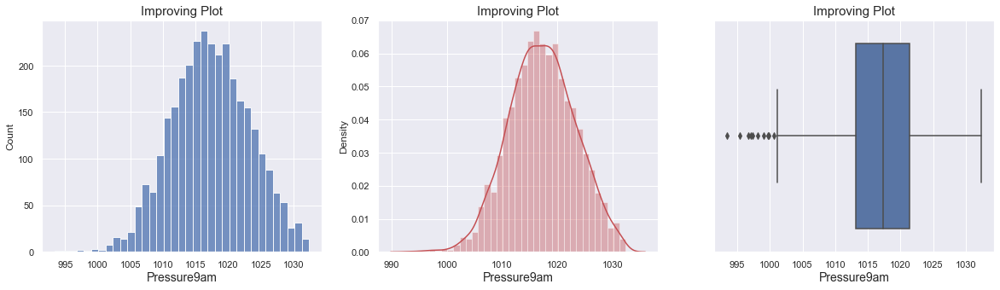

In [1562]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)
plt.show()

In [1563]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Pressure9am'], 31,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Pressure9am'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Pressure9am'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Pressure9am'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 7.199999999999932

 **************************************************
Higher range:-
 (array([2012], dtype=int64),)

 **************************************************
Lower range:- 
 (array([ 219,  525,  643,  674,  678,  679,  703,  874,  893,  895,  898,
        911,  946,  997, 1005, 1006, 1028, 1045, 1062, 1089, 1091, 1118,
       1143, 1306, 1367, 1586, 1635, 1880, 1887, 2029, 2171, 2197, 2202,
       2452, 2572], dtype=int64),)


In [1564]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3187, 25)
New Shape:------>  (3151, 25)


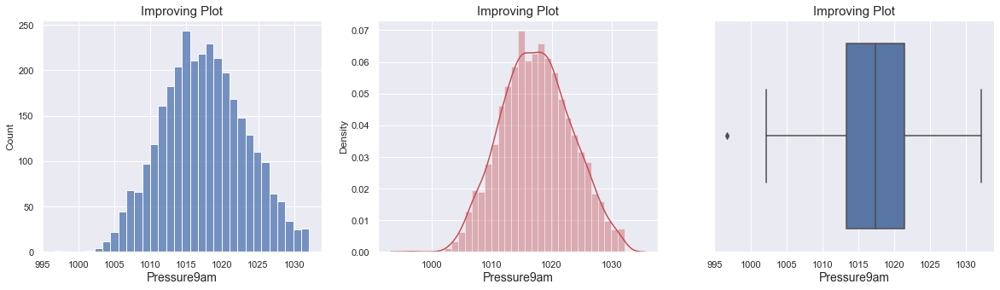

In [1565]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)
plt.show()

In [1566]:
df['Pressure9am'].unique()

array([1018.9, 1020.7, 1021.5, 1016.3, 1012.9, 1010.3, 1012. , 1017.9,
       1017.2, 1016.9, 1016.7, 1017. , 1017.6, 1020.2, 1021.9, 1022.2,
       1022.8, 1021.4, 1017.7, 1009.9, 1014.3, 1019.8, 1016.4, 1017.5,
       1022.7, 1025. , 1024.4, 1024.5, 1025.7, 1023.9, 1020.8, 1012.2,
       1015.3, 1014. , 1013.3, 1017.1, 1020.1, 1019.3, 1014.7, 1007. ,
       1007.3, 1015.1, 1018.8, 1020.5, 1017.4, 1023.5, 1023.8, 1025.2,
       1027.2, 1028.3, 1027.7, 1024.7, 1022.5, 1023. , 1020.9, 1015.7,
       1013.6, 1022.6, 1018.2, 1017.3, 1023.6, 1019.9, 1030.8, 1030.9,
       1028.9, 1016.5, 1014.2, 1016.8, 1025.3, 1019.5, 1019.6, 1015.8,
       1012.7, 1006.7, 1007.1, 1013.2, 1010. , 1011.1, 1006.9, 1012.3,
       1016. , 1021.2, 1021.8, 1026.2, 1026.5, 1023.4, 1020.4, 1009.1,
       1009.6, 1015.5, 1022.3, 1025.6, 1016.6, 1013.5, 1026.4, 1014.6,
       1022.9, 1024.9, 1027.6, 1021.7, 1023.1, 1024.2, 1018. , 1019.4,
       1013.7, 1026.7, 1027.8, 1021.1, 1013.9, 1011.9, 1014.1, 1020. ,
      

In [1567]:
df['Pressure9am'] = df['Pressure9am'].replace(996.7,df['Pressure9am'].mean())

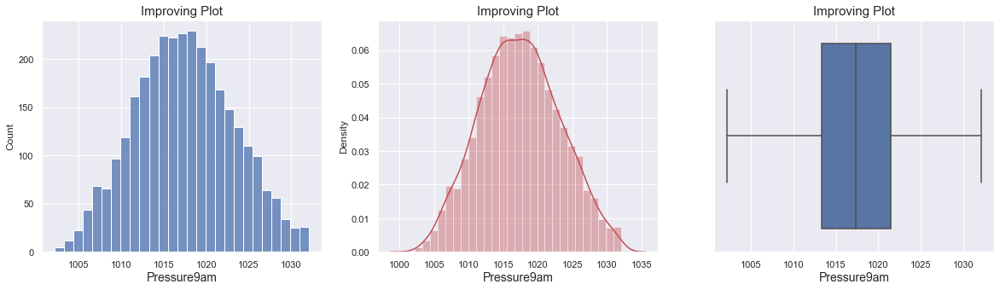

In [1568]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)
plt.show()

In [1569]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Pressure9am'].mean())
print('median of the column--------> ',df['Pressure9am'].median())
print('mode of the column--------> ', st.mode(df['Pressure9am']))
print('std of the column:----->',df['Pressure9am'].std())

mean of the column------->  1017.4632360040263
median of the column-------->  1017.4
mode of the column-------->  1014.8
std of the column:-----> 5.79118769557199


In [1570]:
df['Pressure9am'] = df['Pressure9am'].replace(1014.8,df['Pressure9am'].mean())
#replace mode value by column mean

In [1571]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Pressure9am'].mean())
print('median of the column--------> ',df['Pressure9am'].median())
print('mode of the column--------> ', st.mode(df['Pressure9am']))
print('std of the column:----->',df['Pressure9am'].std())

mean of the column------->  1017.4877469034612
median of the column-------->  1017.4632360040263
mode of the column-------->  1017.4632360040263
std of the column:-----> 5.7854952179819055


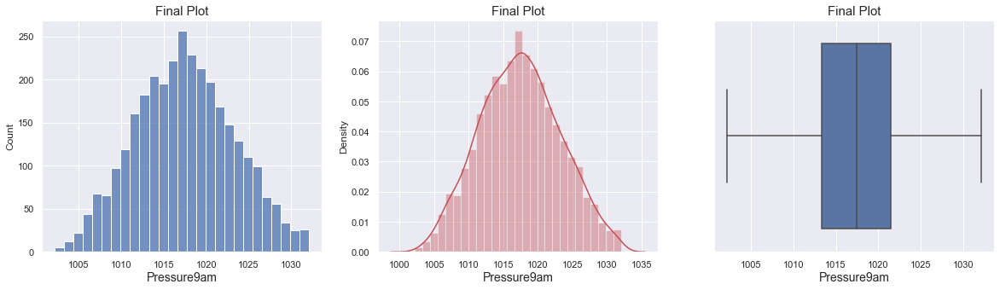

In [1572]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure9am']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure9am']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Pressure9am', fontsize= 14)
plt.show()

In [1573]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Pressure9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Pressure9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Pressure9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.07558935194476403


Text(0.5, 1.0, 'Plot1: Location vs Pressure9am')

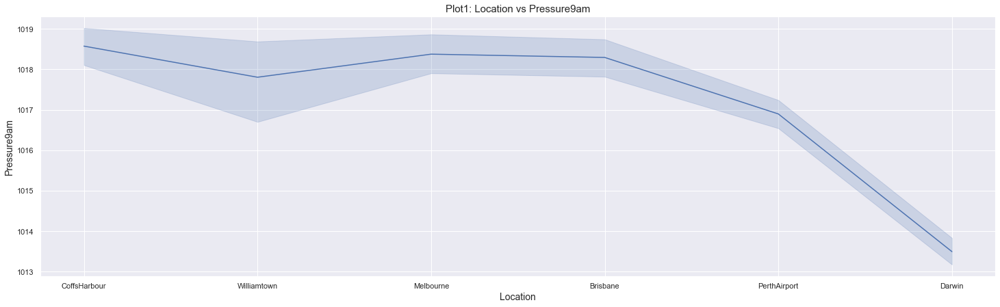

In [1574]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot1: Location vs Pressure9am', fontsize = 15)

Text(0.5, 1.0, 'Plot2: MinTemp vs Pressure9am')

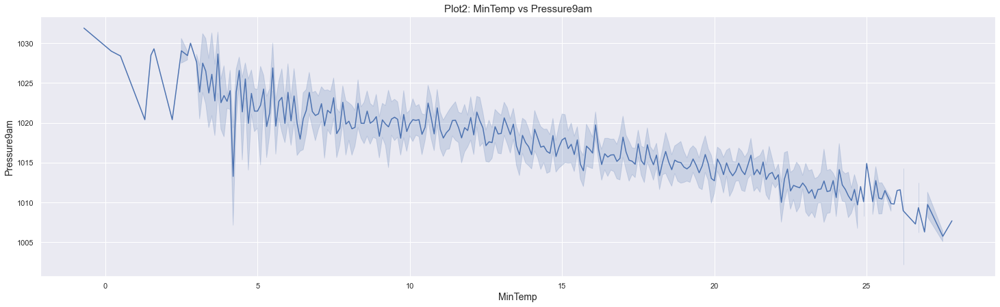

In [1575]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot2: MinTemp vs Pressure9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MaxTemp vs Pressure9am')

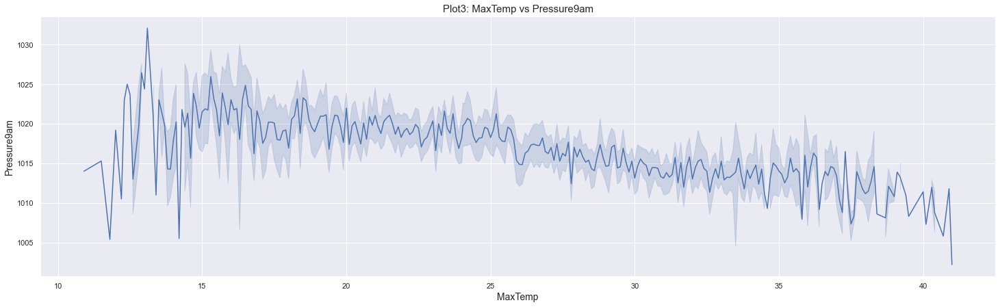

In [1576]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot3: MaxTemp vs Pressure9am', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Sunshine vs Pressure9am')

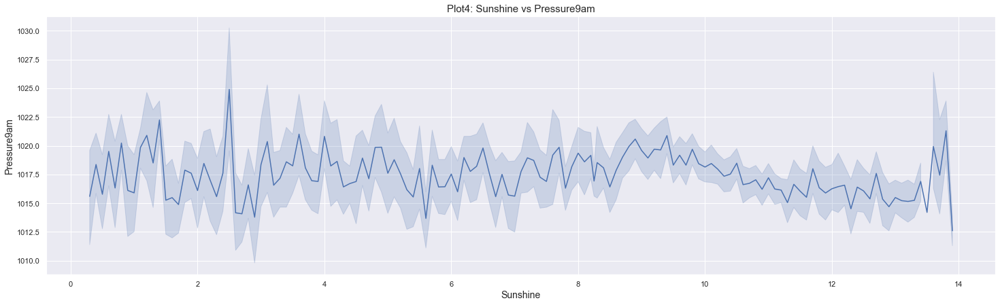

In [1577]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot4: Sunshine vs Pressure9am', fontsize = 15)

Text(0.5, 1.0, 'Plot5: WindGustDir vs Pressure9am')

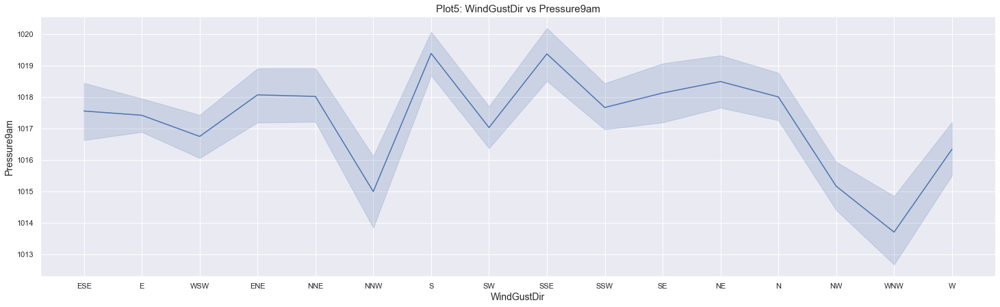

In [1578]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot5: WindGustDir vs Pressure9am', fontsize = 15)

Text(0.5, 1.0, 'Plot6: Date_Years vs Pressure9am')

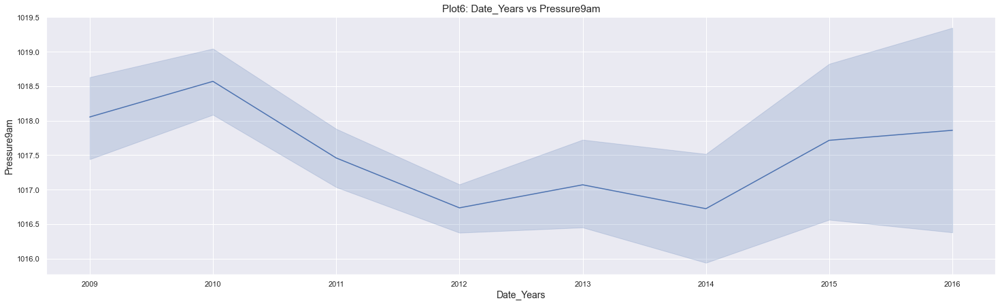

In [1579]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot6: Date_Years vs Pressure9am', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Month vs Pressure9am')

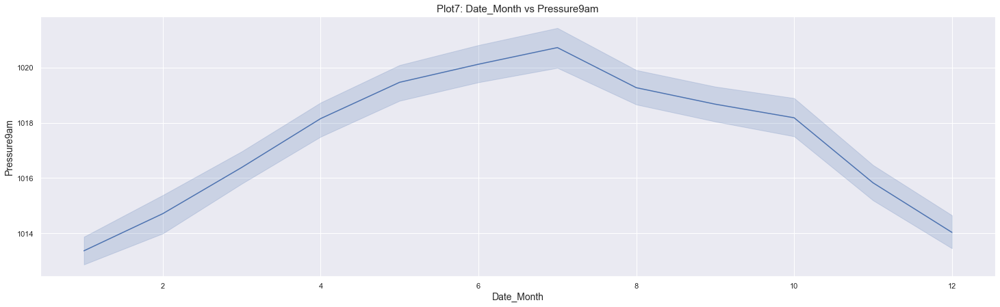

In [1580]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title('Plot7: Date_Month vs Pressure9am', fontsize = 15)

Observation:
- Data Cleaning
1. Null values are improved
2. No zero value found
3. Outliers are found and removed by using IQR method
- Results by EDA
1. In plot1, Darwin has low pressure value and Melbourne has high pressure value
2. In plot2, We can see, decresing curve of pressure and mintemp
3. In plot3, We can see, decresing curve of pressure and maxtemp
4. In plot4, curve of pressure and sunshine is almost constant
5. In plot5, pressure is high at S and low at NNW and WNW
6. In plot6, pressure is high at 2010 and low at 2014
7. In plot7, pressure is high at 6-8 month

In [1581]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3151, 25)


# Column16:Pressure3pm

In [1582]:
df['Pressure3pm'].unique() #check the unique value

array([1017.9, 1020.1, 1016.6, 1012.8, 1008.5, 1008.6, 1011.2, 1016.5,
       1015. , 1015.3, 1015.1, 1016.2, 1018.5, 1019.9, 1018.8, 1019.7,
       1021.7, 1019.4, 1015.2, 1008.3, 1014.1, 1018.6, 1017.3, 1014.8,
       1015.5, 1021.5, 1022.4, 1022. , 1021.4, 1023.5, 1020.8, 1009.7,
       1011.9, 1012.7, 1011.4, 1012.9, 1017.4, 1004.1, 1003.6, 1013.5,
       1016.4, 1021.1, 1020.5, 1023.6, 1025.3, 1025.7, 1023.9, 1020.3,
       1022.2, 1018.7, 1019.8, 1020.4, 1017.1, 1012.1, 1012.3, 1010.7,
       1016.3, 1020.7, 1018.9, 1015.6, 1016.8, 1022.3, 1017.8, 1023.7,
       1028.8, 1028.1, 1025.6, 1021.2, 1012.2, 1011.8, 1015.4, 1011.1,
       1016.1, 1021.8, 1017.7, 1015.8, 1013. , 1013.1, 1009.4, 1003.2,
       1005.1, 1007.7, 1018.2, 1025. , 1024. , 1021. , 1013.2, 1006.2,
       1007.2, 1009.1, 1020.2, 1012.6, 1012.5, 1023. , 1023.3, 1020.9,
       1022.6, 1020.6, 1013.9, 1009.2, 1016. , 1007.3, 1011. , 1009.9,
       1006.3, 1013.8, 1014.4, 1005.7, 1010.5, 1015.9, 1006.6, 1008. ,
      

In [1583]:
df['Pressure3pm'].value_counts() #check the counts of unique value

1017.8    31
1015.1    28
1013.2    27
1017.9    27
1017.4    27
          ..
992.0      1
1003.3     1
999.2      1
1001.7     1
1029.0     1
Name: Pressure3pm, Length: 295, dtype: int64

In [1584]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Pressure3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Pressure3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Pressure3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 2

 **************************************************
Check the skewness in Column:----------> 0.08980197454078614


In [1585]:
df.dropna(subset=["Pressure3pm"], inplace=True) #drop the null values

In [1586]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Pressure3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Pressure3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Pressure3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.08980197454078621


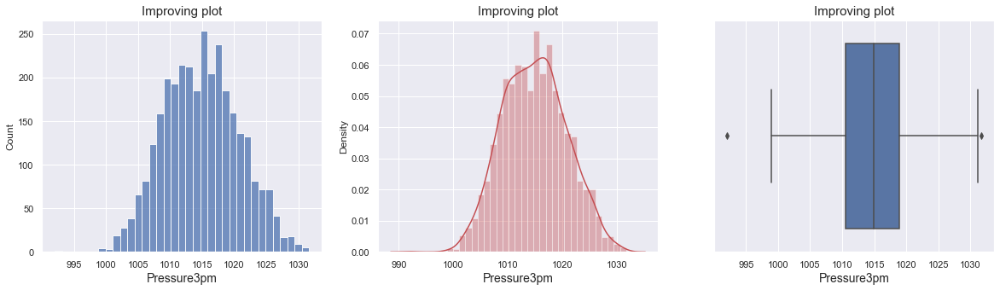

In [1587]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure3pm']) #visualize the outliers by using histplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure3pm']) #visualize the outliers by using boxplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)
plt.show()

In [1588]:
df['Pressure3pm'].unique()

array([1017.9, 1020.1, 1016.6, 1012.8, 1008.5, 1008.6, 1011.2, 1016.5,
       1015. , 1015.3, 1015.1, 1016.2, 1018.5, 1019.9, 1018.8, 1019.7,
       1021.7, 1019.4, 1015.2, 1008.3, 1014.1, 1018.6, 1017.3, 1014.8,
       1015.5, 1021.5, 1022.4, 1022. , 1021.4, 1023.5, 1020.8, 1009.7,
       1011.9, 1012.7, 1011.4, 1012.9, 1017.4, 1004.1, 1003.6, 1013.5,
       1016.4, 1021.1, 1020.5, 1023.6, 1025.3, 1025.7, 1023.9, 1020.3,
       1022.2, 1018.7, 1019.8, 1020.4, 1017.1, 1012.1, 1012.3, 1010.7,
       1016.3, 1020.7, 1018.9, 1015.6, 1016.8, 1022.3, 1017.8, 1023.7,
       1028.8, 1028.1, 1025.6, 1021.2, 1012.2, 1011.8, 1015.4, 1011.1,
       1016.1, 1021.8, 1017.7, 1015.8, 1013. , 1013.1, 1009.4, 1003.2,
       1005.1, 1007.7, 1018.2, 1025. , 1024. , 1021. , 1013.2, 1006.2,
       1007.2, 1009.1, 1020.2, 1012.6, 1012.5, 1023. , 1023.3, 1020.9,
       1022.6, 1020.6, 1013.9, 1009.2, 1016. , 1007.3, 1011. , 1009.9,
       1006.3, 1013.8, 1014.4, 1005.7, 1010.5, 1015.9, 1006.6, 1008. ,
      

In [1589]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Pressure3pm'], 27,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Pressure3pm'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Pressure3pm'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Pressure3pm'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.0

 **************************************************
Higher range:-
 (array([ 845, 1134, 2591], dtype=int64),)

 **************************************************
Lower range:- 
 (array([ 196, 2535], dtype=int64),)


In [1590]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3149, 25)
New Shape:------>  (3144, 25)


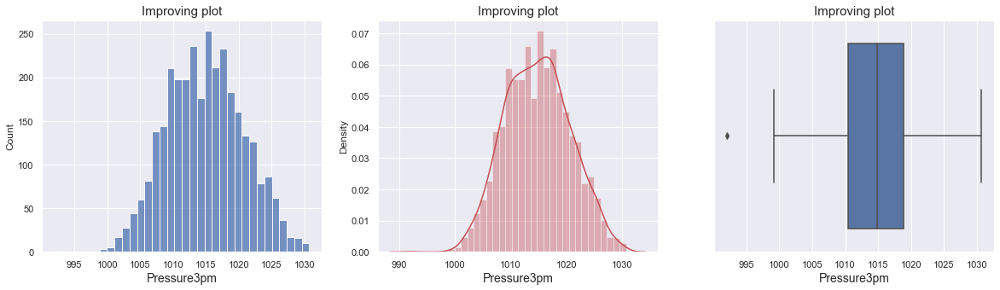

In [1591]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure3pm']) #visualize the outliers by using histplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure3pm']) #visualize the outliers by using boxplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)
plt.show()

In [1592]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Pressure3pm'], 27,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Pressure3pm'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Pressure3pm'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Pressure3pm'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.0

 **************************************************
Higher range:-
 (array([], dtype=int64),)

 **************************************************
Lower range:- 
 (array([2532], dtype=int64),)


In [1593]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (3144, 25)
New Shape:------>  (3143, 25)


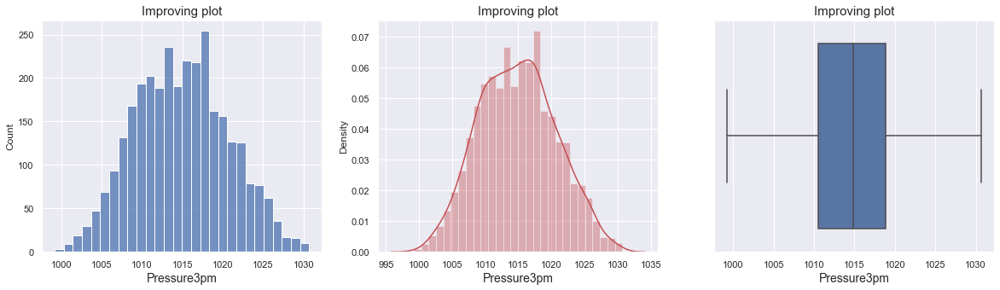

In [1594]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure3pm']) #visualize the outliers by using histplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure3pm']) #visualize the outliers by using boxplot
plt.title('Improving plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)
plt.show()

In [1595]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Pressure3pm'].mean())
print('median of the column--------> ',df['Pressure3pm'].median())
print('mode of the column--------> ', st.mode(df['Pressure3pm']))
print('std of the column:----->',df['Pressure3pm'].std())

mean of the column------->  1014.8986955138387
median of the column-------->  1014.9
mode of the column-------->  1017.8
std of the column:-----> 5.790082519802755


In [1596]:
df['Pressure3pm'] = df['Pressure3pm'].replace(1017.8,df['Pressure3pm'].mean())

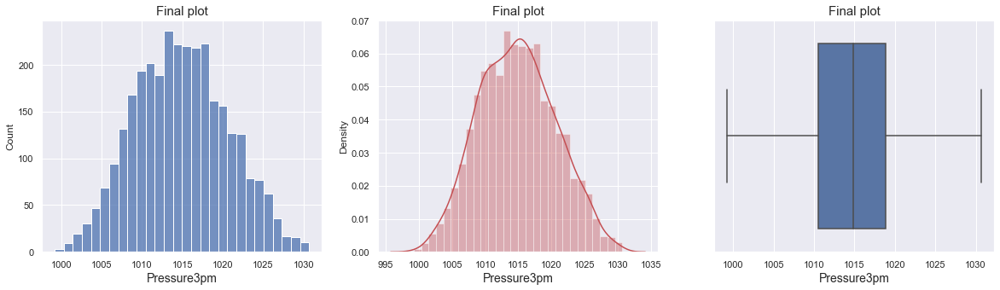

In [1597]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Pressure3pm']) #visualize the outliers by using histplot
plt.title('Final plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Pressure3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Final plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Pressure3pm']) #visualize the outliers by using boxplot
plt.title('Final plot', fontsize=15)
plt.xlabel('Pressure3pm', fontsize= 14)
plt.show()

In [1598]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Pressure3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Pressure3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Pressure3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.11202605095826884


In [1599]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Pressure3pm'].mean())
print('median of the column--------> ',df['Pressure3pm'].median())
print('mode of the column--------> ', st.mode(df['Pressure3pm']))
print('std of the column:----->',df['Pressure3pm'].std())

mean of the column------->  1014.870079402139
median of the column-------->  1014.8986955138387
mode of the column-------->  1014.8986955138387
std of the column:-----> 5.782835460779762


Text(0.5, 1.0, 'Plot1: Location vs WindGustSpeed')

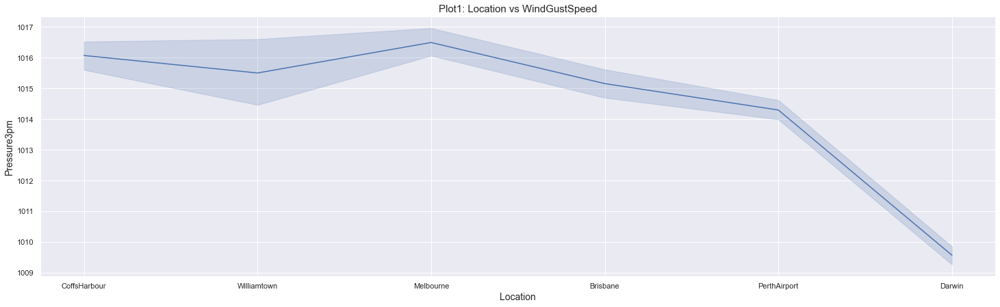

In [1600]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot1: Location vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot2: MinTemp vs Pressure3pm')

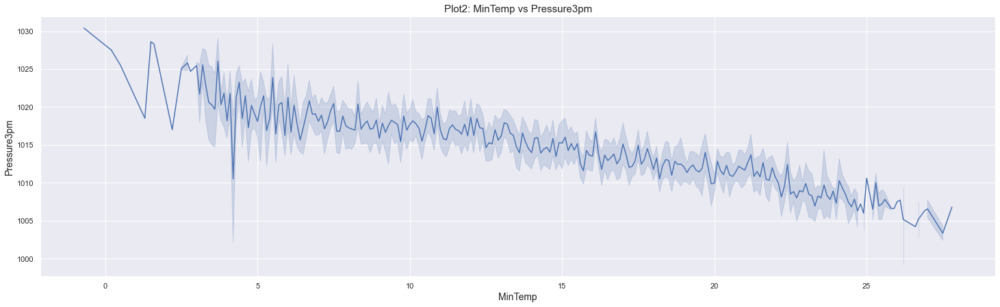

In [1601]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot2: MinTemp vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MaxTemp vs Pressure3pm')

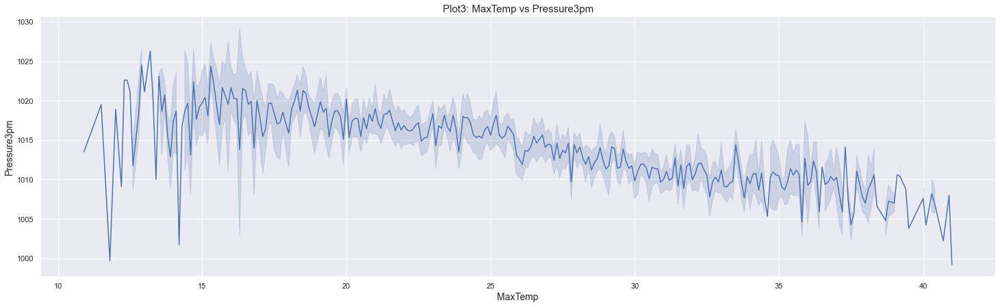

In [1602]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot3: MaxTemp vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Sunshine vs Pressure3pm')

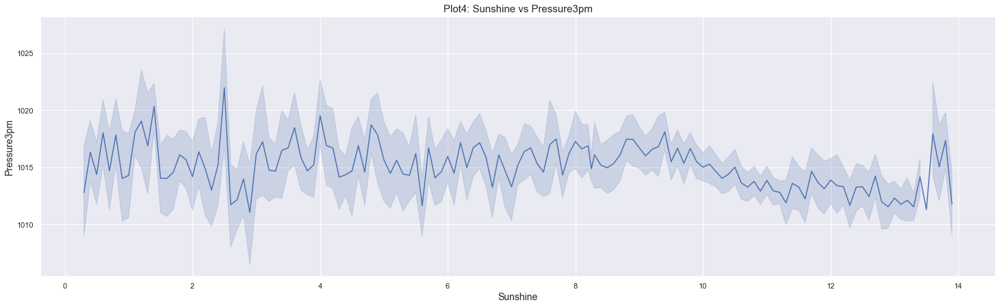

In [1603]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot4: Sunshine vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot5: WindGustDir vs Pressure3pm')

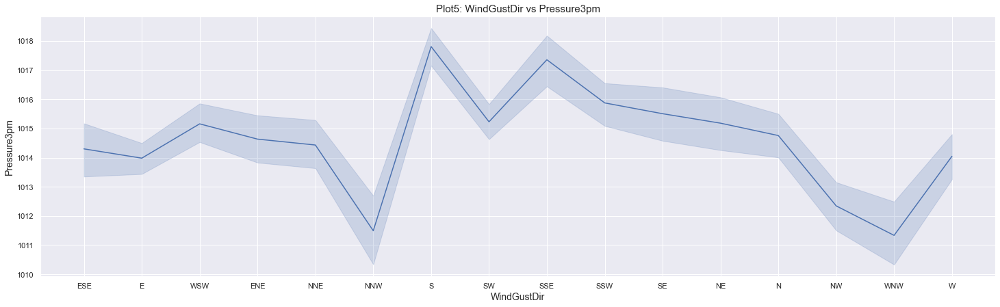

In [1604]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot5: WindGustDir vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot6: Date_Years vs Pressure3pm')

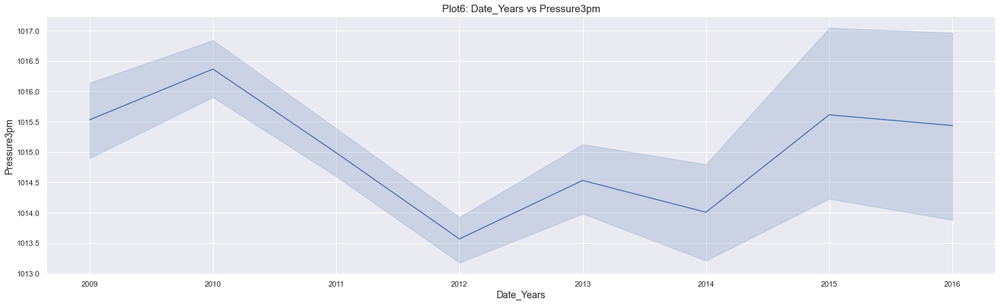

In [1605]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot6: Date_Years vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Month vs Pressure3pm')

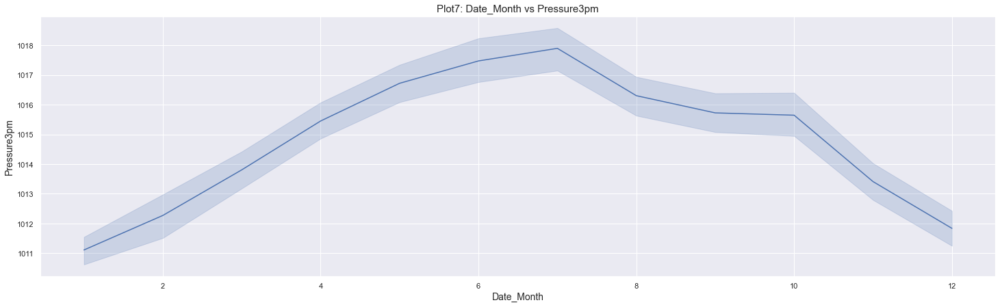

In [1606]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot7: Date_Month vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot8: WindDir3pm vs Pressure3pm')

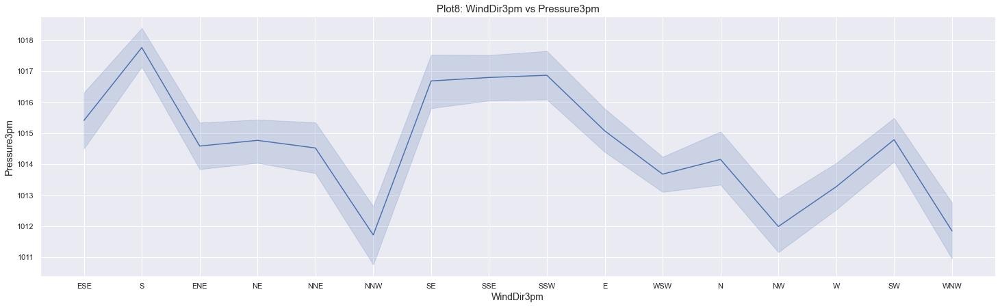

In [1607]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'WindDir3pm', data=df)
plt.xlabel('WindDir3pm', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot8: WindDir3pm vs Pressure3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot9: Humidity3pm vs Pressure3pm')

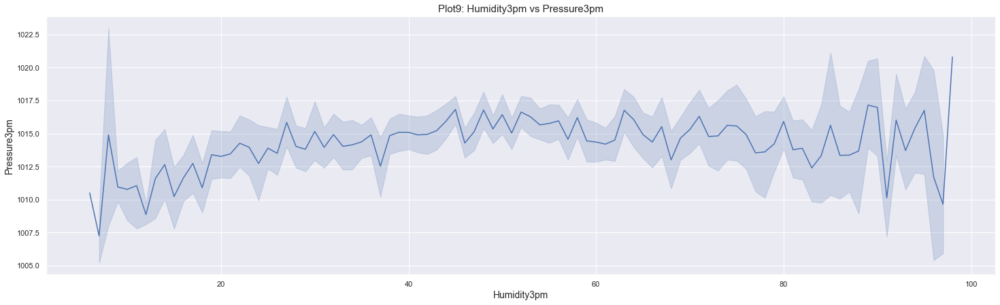

In [1608]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'Humidity3pm', data=df)
plt.xlabel('Humidity3pm', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title('Plot9: Humidity3pm vs Pressure3pm', fontsize = 15)

Observation:
- Data Cleaning
1. Null values are found and removed
2. No zero values are found
3. Outliers are found
4. skewness is improved
5. mean, median, mode values are improved
- Results by EDA
1. In plot1, Darwin has low pressure value and Melbourne has high pressure value
2. In plot2, We can see, decresing curve of pressure and mintemp
3. In plot3, We can see, decresing curve of pressure and maxtemp
4. In plot4, curve of pressure and sunshine is almost constant
5. In plot5, pressure is high at S and low at NNW and WNW
6. In plot6, pressure is high at 2010 and low at 2012-2014
7. In plot7, pressure is high at 6-8 month
8. in plot8, pressure is high at s direction
9. In plot9, we can see a contant curve of humdity and pressure

In [1609]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (3143, 25)


# Column17:Cloud9am

In [1610]:
df['Cloud9am'].unique() #check the unique value

array([ 6.,  4.,  5.,  2.,  1.,  3.,  7.,  8.,  0., nan])

In [1611]:
df['Cloud9am'].value_counts() #check the counts of unique value

7.0    711
1.0    657
0.0    325
6.0    276
3.0    243
2.0    236
5.0    222
8.0    184
4.0    134
Name: Cloud9am, dtype: int64

In [1612]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Cloud9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Cloud9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Cloud9am'].skew())#check the skewness

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 155

 **************************************************
Check the skewness in Column:----------> 0.009985730869172682


In [1613]:
df.dropna(subset=["Cloud9am"], inplace=True) #drop the null values

In [1614]:
df['Cloud9am'] = df['Cloud9am'].replace(0,df['Cloud9am'].mean()) #replace the zero value by mean

In [1615]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Cloud9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Cloud9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Cloud9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.06395232405926171


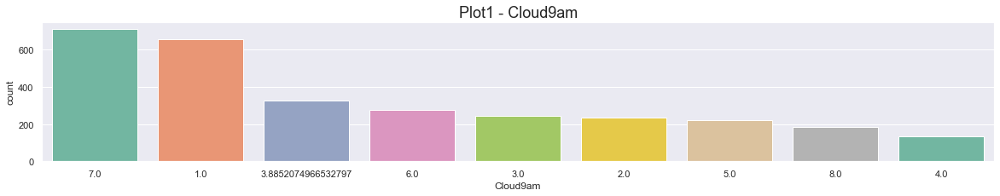

In [1616]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Cloud9am",palette="Set2", data=df, order = df["Cloud9am"].value_counts().index)
plt.title('Plot1 - Cloud9am', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs Cloud9am')

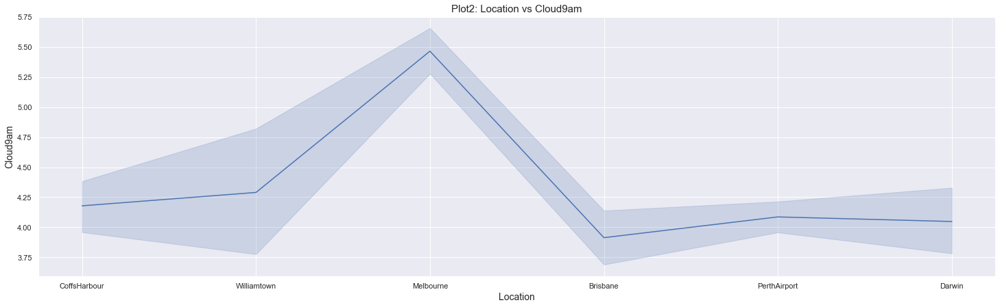

In [1617]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot2: Location vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: MinTemp vs Cloud9am')

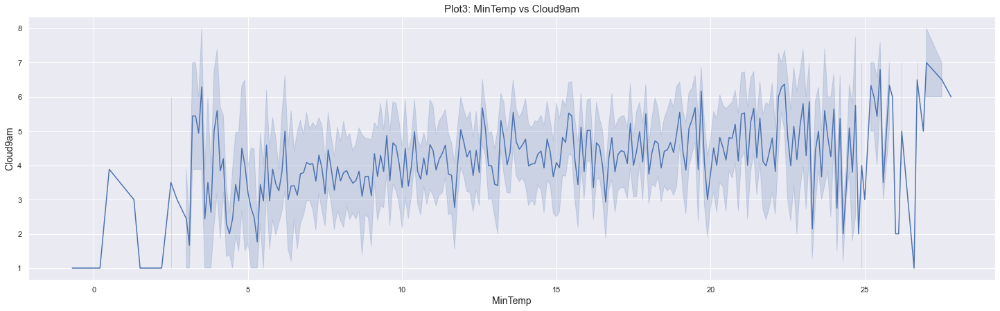

In [1618]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot3: MinTemp vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot4: MaxTemp vs Cloud9am')

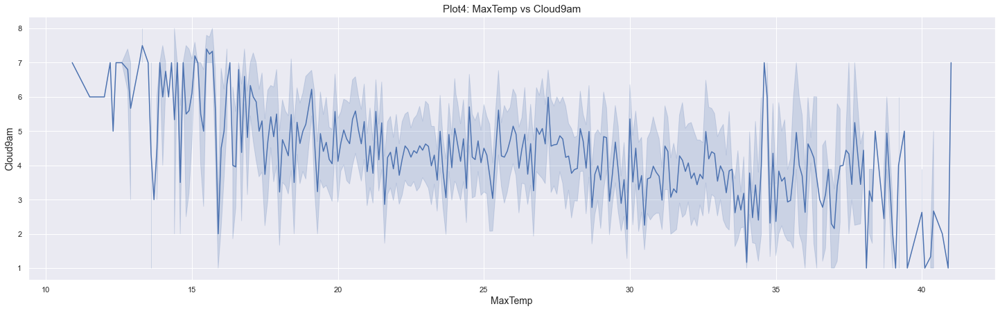

In [1619]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot4: MaxTemp vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Sunshine vs Cloud9am')

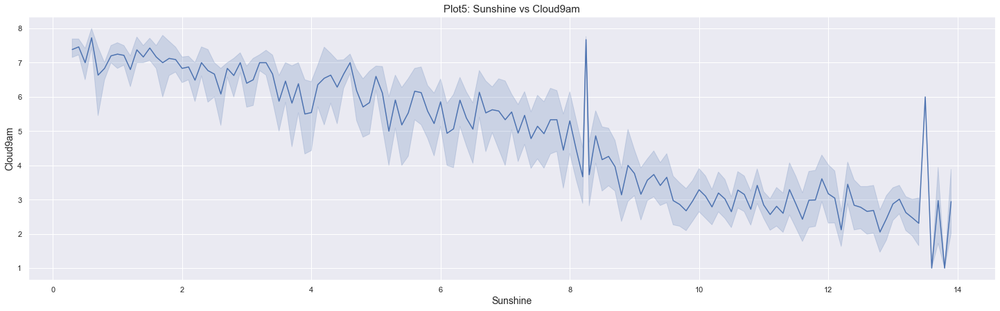

In [1620]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot5: Sunshine vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot6: WindGustDir vs Cloud9am')

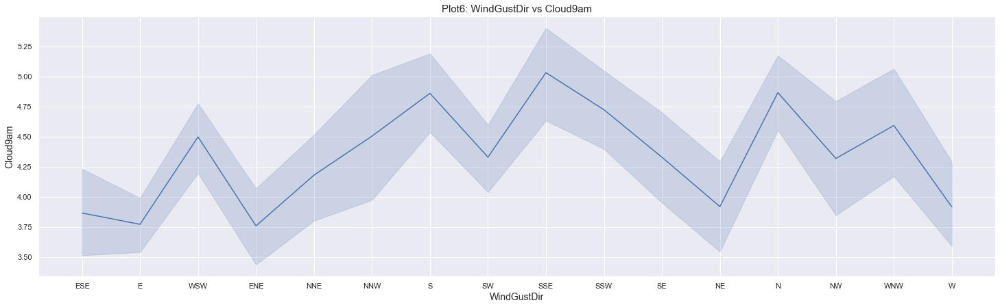

In [1621]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'WindGustDir', data=df)
plt.xlabel('WindGustDir', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot6: WindGustDir vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot7: Date_Years vs Cloud9am')

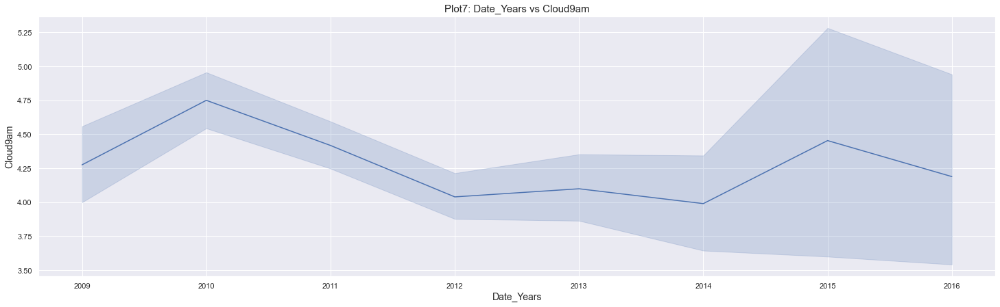

In [1622]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'Date_Years', data=df)
plt.xlabel('Date_Years', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot7: Date_Years vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot8: Date_Month vs Cloud9am')

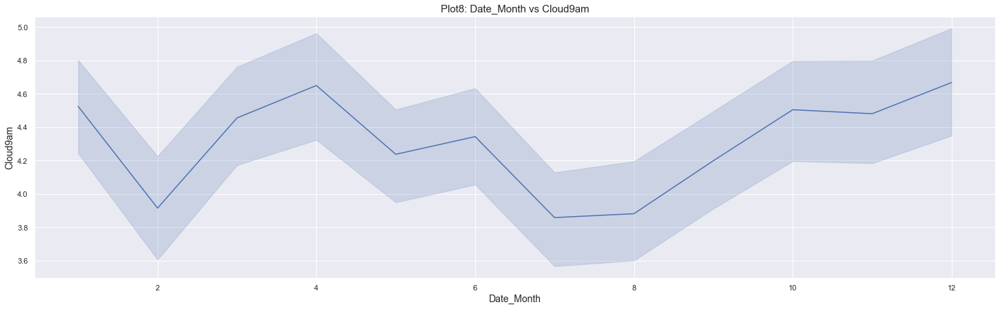

In [1623]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'Date_Month', data=df)
plt.xlabel('Date_Month', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot8: Date_Month vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot9: WindDir9am vs Cloud9am')

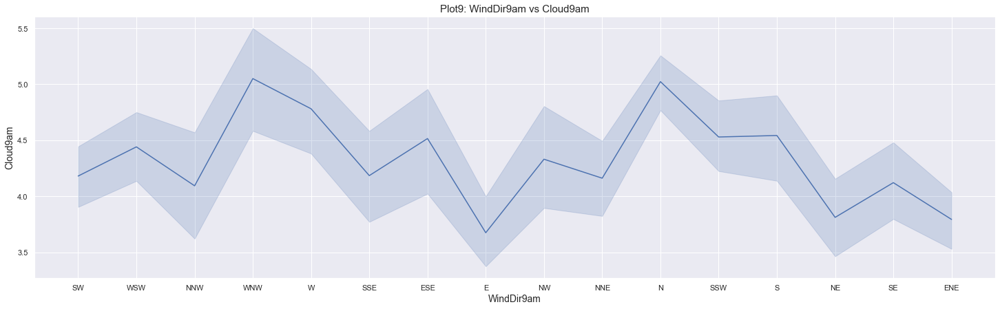

In [1624]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot9: WindDir9am vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot10: WindSpeed9am vs Cloud9am')

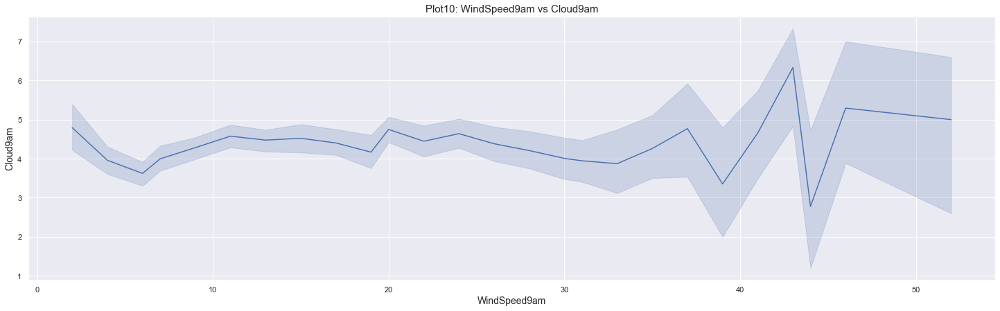

In [1625]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'WindSpeed9am', data=df)
plt.xlabel('WindSpeed9am', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot10: WindSpeed9am vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot11: Humidity9am vs Cloud9am')

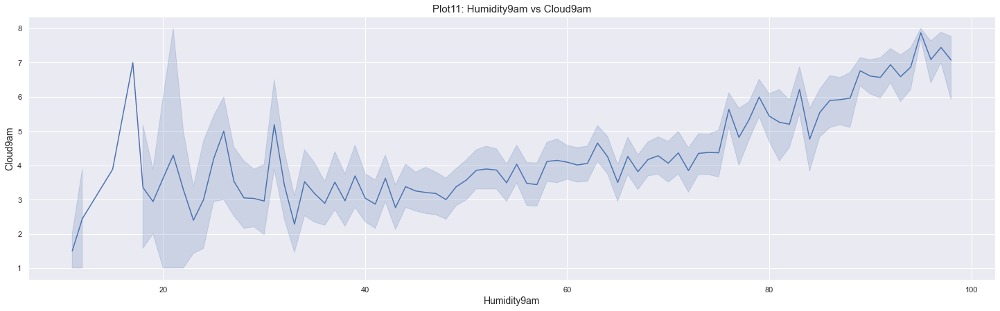

In [1626]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'Humidity9am', data=df)
plt.xlabel('Humidity9am', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot11: Humidity9am vs Cloud9am', fontsize = 15)

Text(0.5, 1.0, 'Plot12: Pressure9am vs Cloud9am')

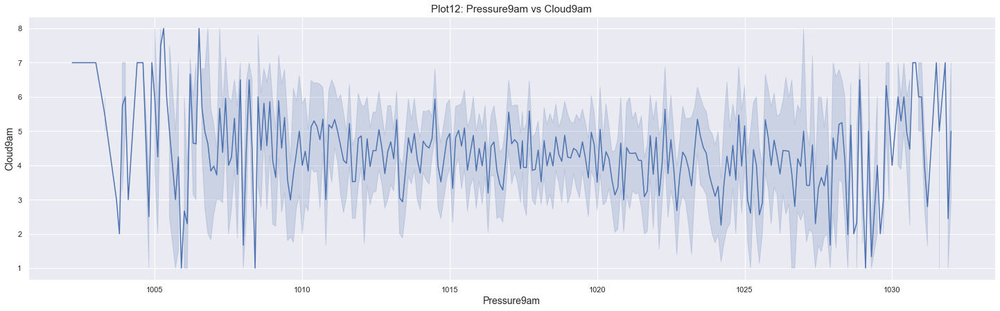

In [1627]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud9am',x= 'Pressure9am', data=df)
plt.xlabel('Pressure9am', fontsize = 14)
plt.ylabel('Cloud9am', fontsize = 14)
plt.title('Plot12: Pressure9am vs Cloud9am', fontsize = 15)

Observation:
- Data Cleaning
1. Null values are found and removed
2. zero values are found
3. No Outliers are found
4. skewness is improved
5. mean, median, mode values are improved
- Results by EDA
1. In plot1, count of 7.0 is higher than others
1. In plot2, Brisbane has low cloud and Melbourne has high cloud
2. In plot3, We can see, increasing curve of pressure and mintemp
3. In plot4, We can see, decresing curve of pressure and maxtemp
4. In plot5, curve of pressure and sunshine is decreasing
5. In plot6, cloud is high at SSE
6. In plot7, cloud is high at 2010
7. In plot8, cloud is high at 4 and 12 month
8. In plot9, cloud is high at WNW direction
8. in plot10, windspeed is high when cloud is between 6-7
9. In plot11, we can see a increasing curve of humdity and cloud
10. In plot12, we see, pressure is slightly decreasing between 1015 and 1020

In [1628]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2988, 25)


# Column18:Cloud3pm

In [1629]:
df['Cloud3pm'].unique() #check the unique value

array([ 6.,  7.,  5.,  1.,  2.,  4.,  8.,  0.,  3., nan])

In [1630]:
df['Cloud3pm'].value_counts() #check the counts of unique value

7.0    662
1.0    604
2.0    301
6.0    287
5.0    266
3.0    253
0.0    234
4.0    191
8.0    172
Name: Cloud3pm, dtype: int64

In [1631]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Cloud3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Cloud3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Cloud3pm'].skew())#check the skewness

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 18

 **************************************************
Check the skewness in Column:----------> -0.011572394225457697


In [1632]:
df.dropna(subset=["Cloud3pm"], inplace=True) #drop the null values

In [1633]:
df['Cloud3pm'] = df['Cloud3pm'].replace(0,df['Cloud3pm'].mean()) #replace the zero value by mean

In [1634]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Cloud3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Cloud3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Cloud3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.04588805608552861


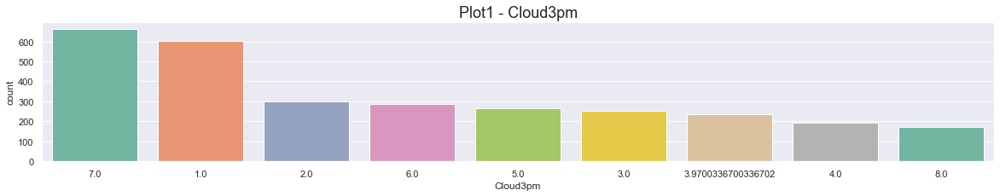

In [1635]:
#plotting each class frequency
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Cloud3pm",palette="Set2", data=df, order = df["Cloud3pm"].value_counts().index)
plt.title('Plot1 - Cloud3pm', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: WindDir3pm vs Cloud3pm')

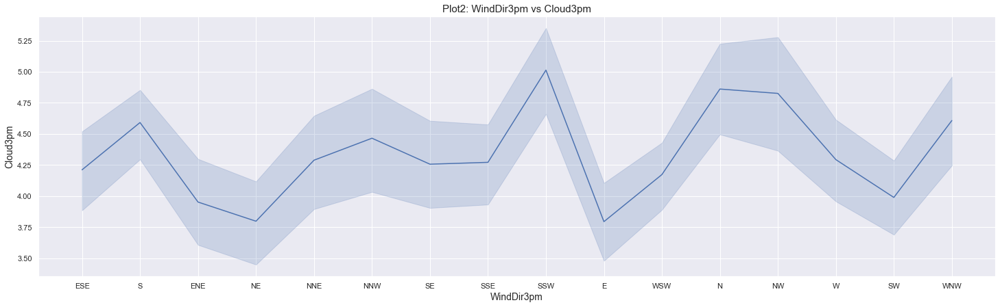

In [1636]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud3pm',x= 'WindDir3pm', data=df)
plt.xlabel('WindDir3pm', fontsize = 14)
plt.ylabel('Cloud3pm', fontsize = 14)
plt.title('Plot2: WindDir3pm vs Cloud3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot3: WindSpeed3pm vs Cloud3pm')

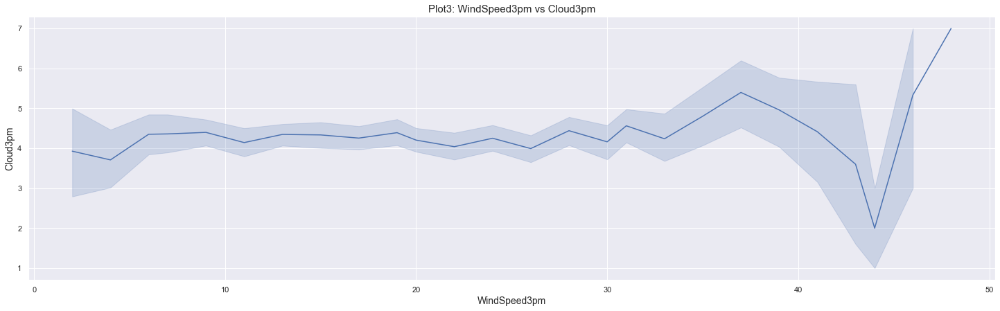

In [1637]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud3pm',x= 'WindSpeed3pm', data=df)
plt.xlabel('WindSpeed3pm', fontsize = 14)
plt.ylabel('Cloud3pm', fontsize = 14)
plt.title('Plot3: WindSpeed3pm vs Cloud3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Humidity3pm vs Cloud3pm')

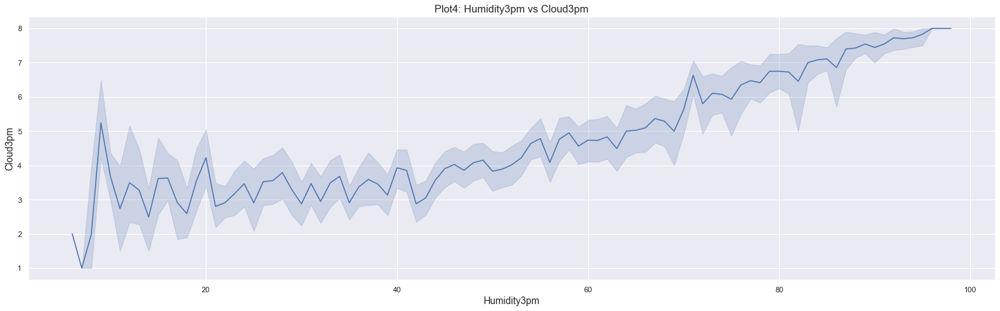

In [1638]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud3pm',x= 'Humidity3pm', data=df)
plt.xlabel('Humidity3pm', fontsize = 14)
plt.ylabel('Cloud3pm', fontsize = 14)
plt.title('Plot4: Humidity3pm vs Cloud3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Pressure3pm vs Cloud3pm')

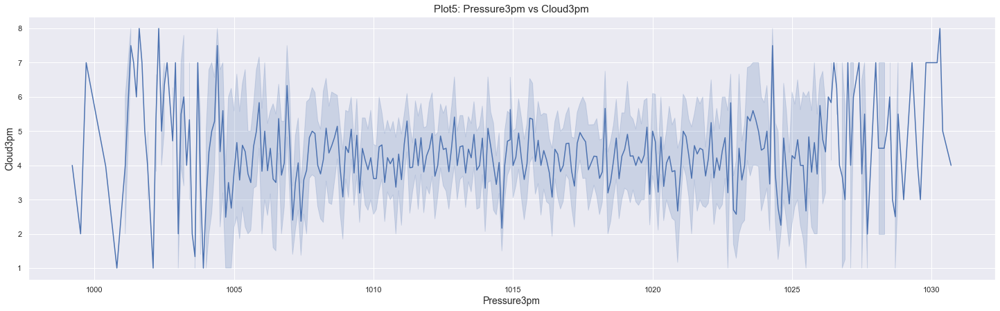

In [1639]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Cloud3pm',x= 'Pressure3pm', data=df)
plt.xlabel('Pressure3pm', fontsize = 14)
plt.ylabel('Cloud3pm', fontsize = 14)
plt.title('Plot5: Pressure3pm vs Cloud3pm', fontsize = 15)

Observation:
- Data Cleaning
1. Null values are found and removed
2. zero values are found
3. No Outliers are found
4. skewness is improved
5. mean, median, mode values are improved
- Results by EDA
1. In plot1, count of 7.0 is higher than others
1. In plot2, cloud is high at SSW
2. In plot3,  windspeed is high when cloud is between 2-3
3. In plot4, we can see a increasing curve of humdity and cloud
4. In plot5, we see, pressure is slightly decreasing between 1010 and 1020

In [1640]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2970, 25)


# Column19:Temp9am

In [1641]:
df['Temp9am'].unique() #check the unique value

array([22. , 21. , 23.3, 24. , 23.4, 21.4, 21.2, 23.2, 22.3, 22.4, 20.6,
       21.3, 22.5, 22.6, 20.8, 19.7, 22.7, 23.1, 20.7, 19.6, 20.2, 20.5,
       18.1, 20.4, 22.8, 20.9, 20. , 21.7, 21.1, 16.7, 17.1, 20.3, 24.2,
       21.9, 17.6, 19. , 17.7, 18.5, 18.3, 18.2, 17.4, 16.9, 16.4, 19.4,
       18.9, 17.9, 17.8, 16.3, 17.3, 19.5, 18.8, 16. , 17.2, 16.2, 16.8,
       14.3, 15.1, 14.5, 15.8, 15.9, 14.1, 14.2, 15.5, 16.5, 15.2, 13.8,
       14.8, 16.6, 14.7, 15.3, 13.6, 13.2, 13.4, 12.8, 14.6, 11.7, 17. ,
       14.4, 14.9, 13. , 13.1, 17.5, 19.1, 20.1, 27.9, 27.3, 19.2, 24.3,
       25.4, 18. , 22.1, 28.7, 22.2, 23. , 21.8, 23.5, 24.1, 24.4, 26.2,
       26.6, 27.7, 25.3, 23.9, 25.6, 24.8, 23.6, 24.9, 26.4, 27. , 21.5,
       25.9, 25.8, 26.8, 24.5, 25. , 27.1, 26.7, 25.2, 27.5, 27.4, 28.3,
       26. , 26.1, 25.7, 25.1, 23.7, 26.5, 27.8, 21.6, 28. , 19.9, 19.3,
       22.9, 23.8, 18.7, 15. , 18.6, 16.1, 12.7, 13.9, 14. , 10.9, 10.5,
        9.1, 11.5, 12.1, 15.4, 12.5, 15.7, 13.7, 18

In [1642]:
df['Temp9am'].value_counts() #check the counts of unique value

14.8    31
23.3    30
13.8    28
20.6    27
14.9    27
        ..
6.0      1
7.9      1
32.6     1
7.2      1
31.2     1
Name: Temp9am, Length: 259, dtype: int64

In [1643]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Temp9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Temp9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Temp9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.017732806790269735


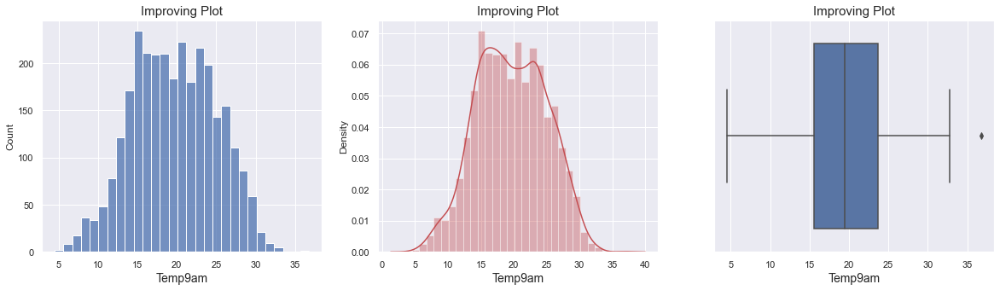

In [1644]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Temp9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Temp9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Temp9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)
plt.show()

In [1645]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Temp9am'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Temp9am'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Temp9am'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Temp9am'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.1

 **************************************************
Higher range:-
 (array([1694], dtype=int64),)

 **************************************************
Lower range:- 
 (array([], dtype=int64),)


In [1646]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (2970, 25)
New Shape:------>  (2969, 25)


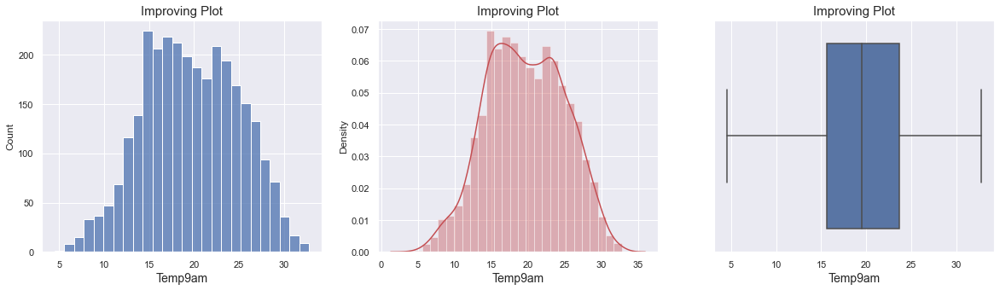

In [1647]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Temp9am']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Temp9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Temp9am']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)
plt.show()

In [1648]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Temp9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Temp9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Temp9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.02602338945098709


In [1649]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Temp9am'].mean())
print('median of the column--------> ',df['Temp9am'].median())
print('mode of the column--------> ', st.mode(df['Temp9am']))
print('std of the column:----->',df['Temp9am'].std())

mean of the column------->  19.67719770966658
median of the column-------->  19.5
mode of the column-------->  14.8
std of the column:-----> 5.28167783151827


In [1650]:
df['Temp9am'] = df['Temp9am'].replace(14.8,df['Temp9am'].mean())

In [1651]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Temp9am'].mean())
print('median of the column--------> ',df['Temp9am'].median())
print('mode of the column--------> ', st.mode(df['Temp9am']))
print('std of the column:----->',df['Temp9am'].std())

mean of the column------->  19.728121633209728
median of the column-------->  19.67719770966658
mode of the column-------->  19.67719770966658
std of the column:-----> 5.2578585823198


In [1652]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Temp9am'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Temp9am'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Temp9am'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> -0.04711296722924902


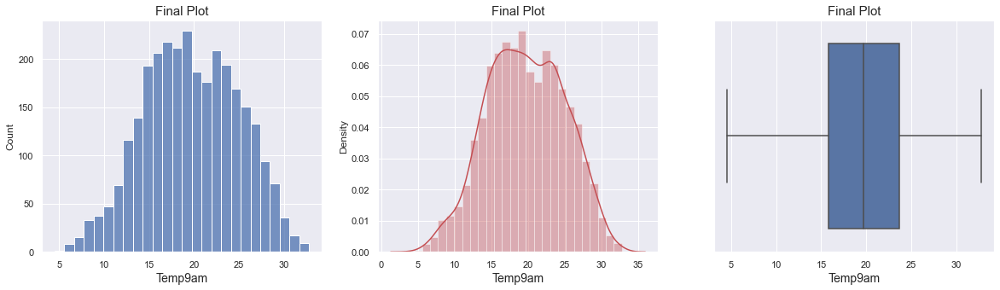

In [1653]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Temp9am']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Temp9am'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Temp9am']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Temp9am', fontsize= 14)
plt.show()

Text(0.5, 1.0, 'Plot1: WindDir9am vs Temp9am')

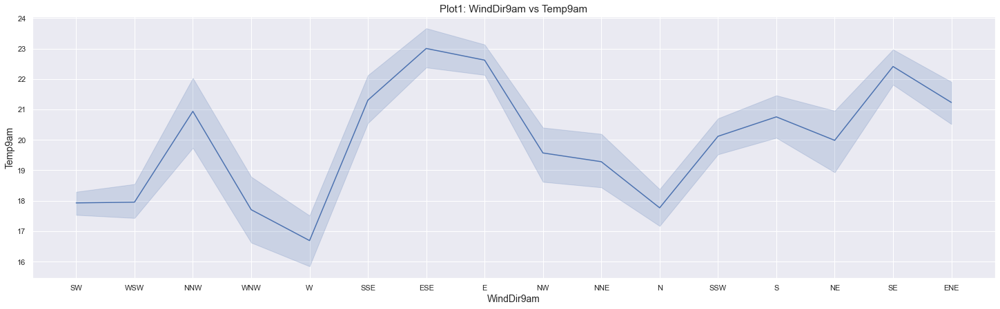

In [1654]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot1: WindDir9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot2: WindSpeed9am vs Temp9am')

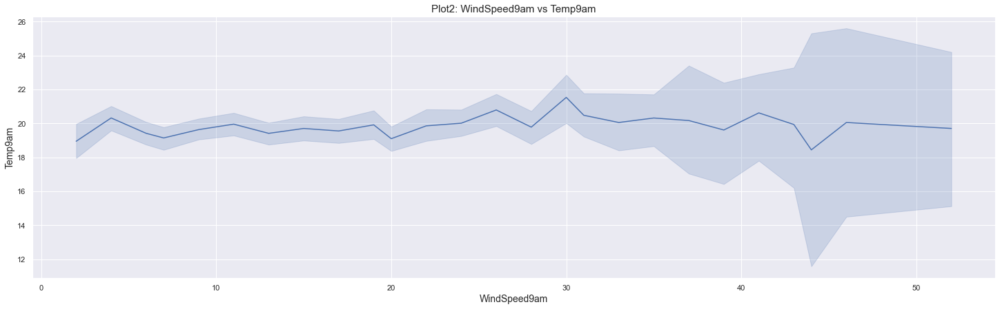

In [1655]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'WindSpeed9am', data=df)
plt.xlabel('WindSpeed9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot2: WindSpeed9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: Humidity9am vs Temp9am')

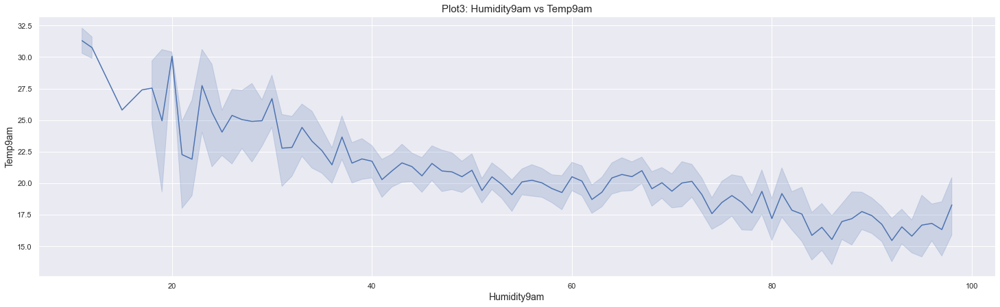

In [1656]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'Humidity9am', data=df)
plt.xlabel('Humidity9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot3: Humidity9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Pressure9am vs Temp9am')

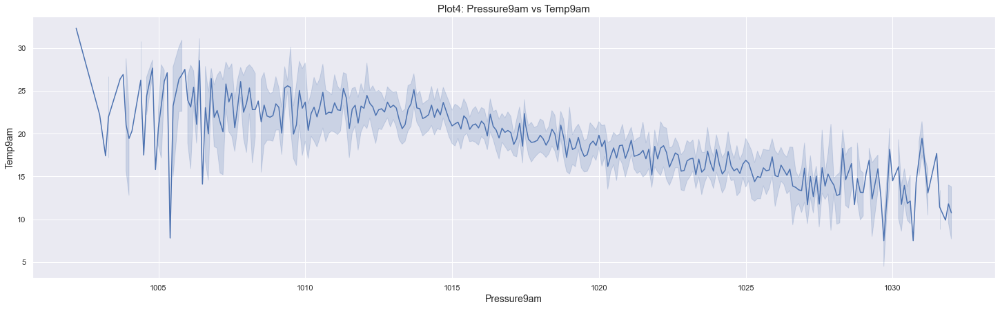

In [1657]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'Pressure9am', data=df)
plt.xlabel('Pressure9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot4: Pressure9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Cloud9am vs Temp9am')

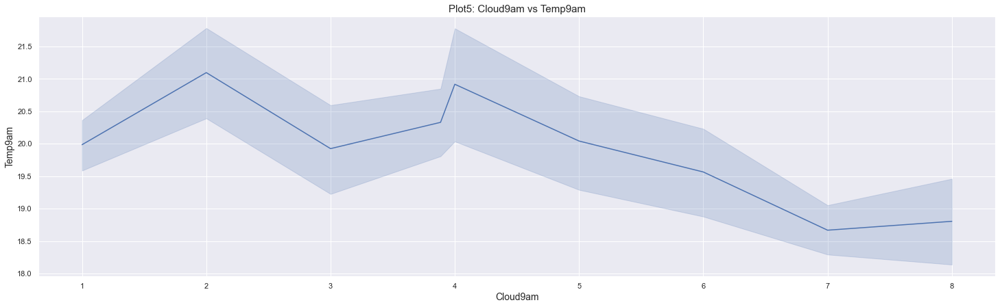

In [1658]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'Cloud9am', data=df)
plt.xlabel('Cloud9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot5: Cloud9am vs Temp9am', fontsize = 15)

Observation:
- Data Cleaning
1. No zero value found
2. No null values are found
3. Outliers are found and removed by IQR method
4. mean,median,mode values are improved
5. skewness is improved
- Results by EDA
1. In plot1,E and ESE has high temp
2. In plot2, Windspeed is almost constant at temperature 12-15
3. In plot3, As temperature increases, humidity decreases
4. In plot4, As temperature increases, pressure decreases
5. In plot5, an increasing and a decreasing curve

In [1659]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Date_Month', 'Date_Day',
       'Date_Years'],
      dtype='object')

In [1660]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2969, 25)


# Column20:Temp3pm

In [1661]:
df['Temp3pm'].unique() #check the unique value

array([26. , 20.9, 24.5, 26.4, 25.9, 27.2, 21.2, 23.9, 24.6, 25.1, 26.1,
       25. , 25.7, 20.7, 24.3, 23.7, 21.3, 19.4, 23.4, 24.4, 22.8, 24.2,
       19.8, 24.1, 20. , 23.1, 21. , 23.5, 25.8, 22. , 22.9, 16.4, 20.4,
       22.2, 23.2, 26.6, 27.1, 23.6, 18.4, 20.8, 21.5, 18.2, 21.8, 20.2,
       21.1, 22.3, 19.9, 17.6, 18.7, 20.3, 20.1, 19.2, 18.6, 16.1, 19.1,
       20.5, 18.5, 18.3, 17.8, 19. , 17. , 15.6, 15.7, 17.7, 18.1, 20.6,
       14.6, 17.1, 17.4, 17.2, 16.8, 16. , 13. , 15.2, 14.8, 17.5, 17.3,
       16.3, 19.3, 18.9, 21.4, 28.1, 21.7, 19.6, 27.8, 22.1, 21.6, 25.5,
       19.5, 22.4, 22.6, 29.6, 21.9, 26.2, 15.9, 28.2, 23.3, 24. , 23.8,
       23. , 25.2, 26.7, 27.3, 24.9, 25.4, 28.4, 27.7, 30. , 22.7, 26.8,
       25.6, 26.9, 27. , 27.5, 29.2, 30.3, 28.7, 25.3, 26.5, 28. , 27.9,
       29.1, 29.8, 24.7, 19.7, 18.8, 17.9, 16.2, 16.6, 14.1, 11.7, 18. ,
       14.4, 16.9, 16.7, 22.5, 16.5, 27.4, 14.5, 30.2, 30.5, 33.7, 31.4,
       36.9, 26.3, 28.8, 30.8, 34.7, 37.6, 31.3, 35

In [1662]:
df['Temp3pm'].value_counts() #check the counts of unique value

21.7    31
21.1    31
21.4    28
20.1    26
25.1    26
        ..
37.7     1
37.6     1
39.1     1
40.5     1
38.5     1
Name: Temp3pm, Length: 274, dtype: int64

In [1663]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Temp3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Temp3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Temp3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.23742844208405048


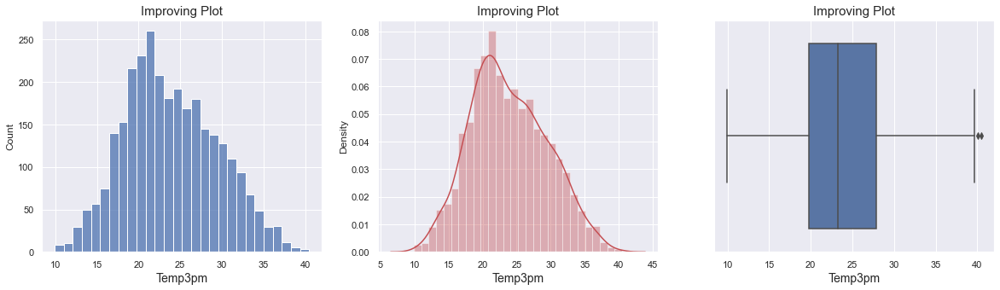

In [1664]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Temp3pm']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Temp3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Temp3pm']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)
plt.show()

In [1665]:
#Detecting the outlier by using iqr method and removing them.
q1 = np.percentile(df['Temp3pm'], 25,
                   interpolation = 'midpoint')
 
q3 = np.percentile(df['Temp3pm'], 75,
                   interpolation = 'midpoint')
iqr = q3 - q1
print('Inter quartile range:------>',iqr)
print("\n",'*'*50)

# higher side 
higher_side = df['Temp3pm'] >= (q3+1.5*iqr)
print('Higher range:-\n',np.where(higher_side))
print("\n",'*'*50)

# lower side 
lower_side = df['Temp3pm'] <= (q1-1.5*iqr)
print('Lower range:- \n',np.where(lower_side))

Inter quartile range:------> 8.099999999999998

 **************************************************
Higher range:-
 (array([1986, 2024], dtype=int64),)

 **************************************************
Lower range:- 
 (array([], dtype=int64),)


In [1666]:
#First print the old shape and then compare
print("old Shape:------> ", df.shape)
#removing the outliers
high=np.where(higher_side)
low=np.where(lower_side)
df=df.drop(df.index[high])
df=df.drop(df.index[low])
 
print("New Shape:------> ", df.shape)

old Shape:------>  (2969, 25)
New Shape:------>  (2967, 25)


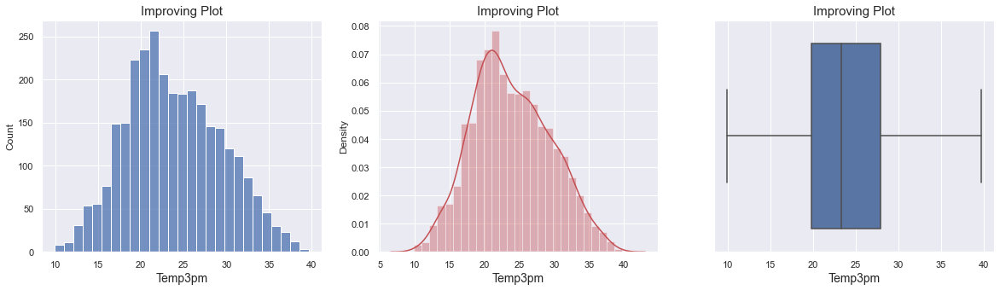

In [1667]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Temp3pm']) #visualize the outliers by using histplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Temp3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Temp3pm']) #visualize the outliers by using boxplot
plt.title('Improving Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)
plt.show()

In [1668]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Temp3pm'].mean())
print('median of the column--------> ',df['Temp3pm'].median())
print('mode of the column--------> ', st.mode(df['Temp3pm']))
print('std of the column:----->',df['Temp3pm'].std())

mean of the column------->  23.870845972362634
median of the column-------->  23.3
mode of the column-------->  21.1
std of the column:-----> 5.578717269325946


In [1669]:
df['Temp3pm'] = df['Temp3pm'].replace(21.1,df['Temp3pm'].mean())

In [1670]:
# calculate the mean, median, mode to check how much our column is skewed  
print('mean of the column-------> ',df['Temp3pm'].mean())
print('median of the column--------> ',df['Temp3pm'].median())
print('mode of the column--------> ', st.mode(df['Temp3pm']))
print('std of the column:----->',df['Temp3pm'].std())

mean of the column------->  23.899796503250165
median of the column-------->  23.4
mode of the column-------->  23.870845972362634
std of the column:-----> 5.571445364326685


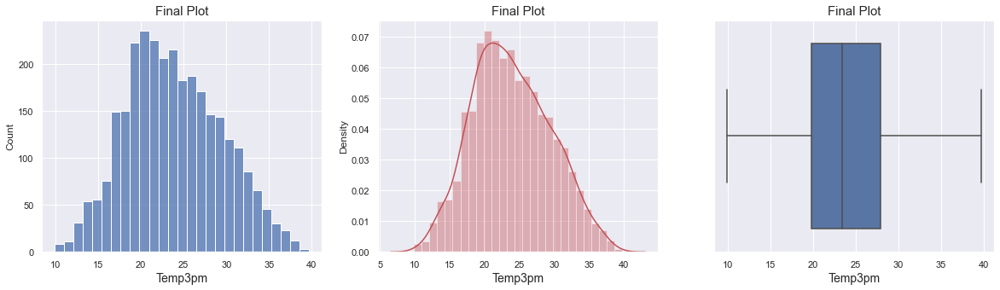

In [1671]:
#Visualization
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.histplot(df['Temp3pm']) #visualize the outliers by using histplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)

plt.subplot(1,3,2)
sns.distplot(df['Temp3pm'], color='r') #visualize the normalization curve by using distplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)

plt.subplot(1,3,3)
sns.boxplot(df['Temp3pm']) #visualize the outliers by using boxplot
plt.title('Final Plot', fontsize=15)
plt.xlabel('Temp3pm', fontsize= 14)
plt.show()

In [1672]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Temp3pm'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Temp3pm'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Temp3pm'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 0.2147626569466573


Text(0.5, 1.0, 'Plot1: WindDir9am vs Temp9am')

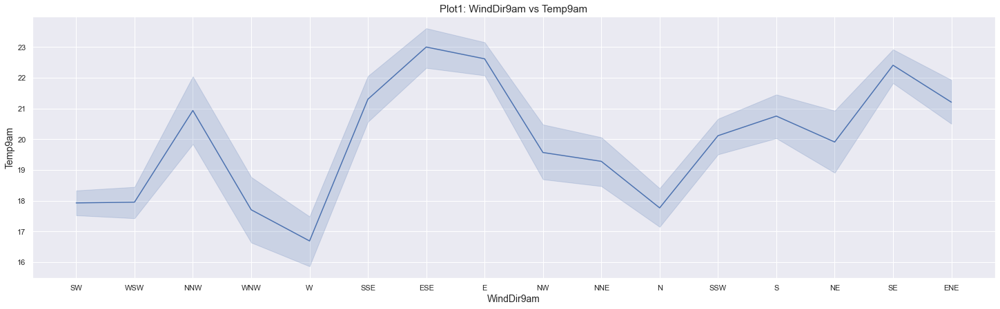

In [1673]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'WindDir9am', data=df)
plt.xlabel('WindDir9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot1: WindDir9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot2: WindSpeed9am vs Temp9am')

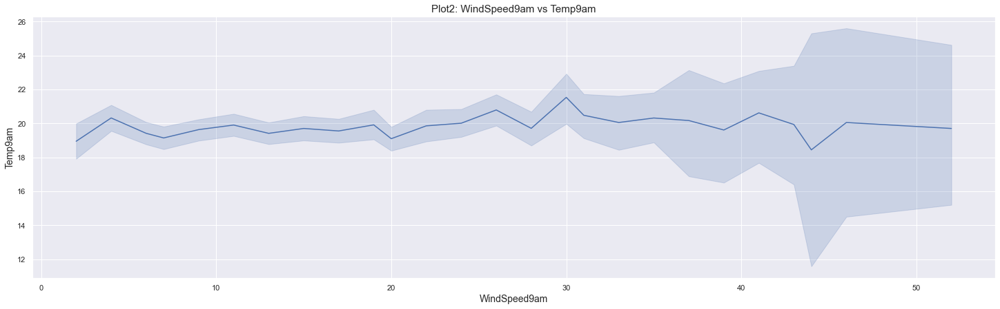

In [1674]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'WindSpeed9am', data=df)
plt.xlabel('WindSpeed9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot2: WindSpeed9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: Humidity9am vs Temp9am')

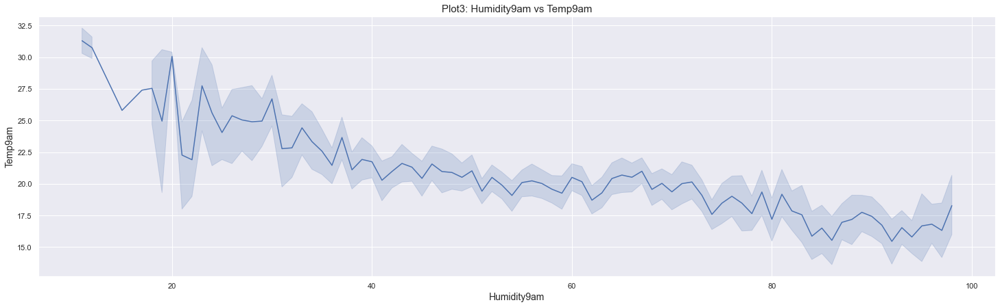

In [1675]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'Humidity9am', data=df)
plt.xlabel('Humidity9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot3: Humidity9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Pressure9am vs Temp9am')

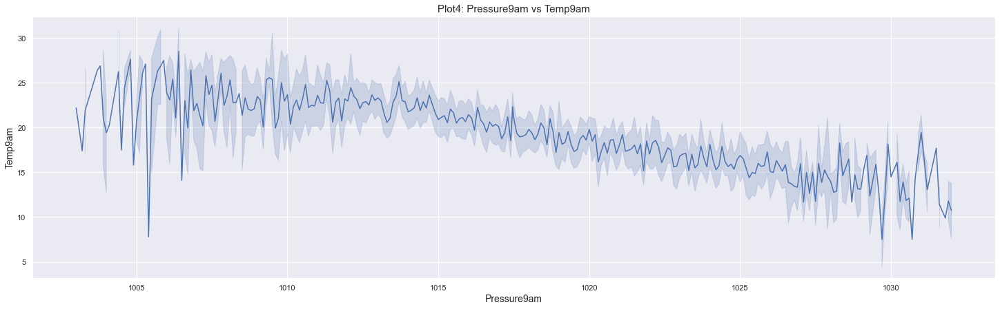

In [1676]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'Pressure9am', data=df)
plt.xlabel('Pressure9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot4: Pressure9am vs Temp9am', fontsize = 15)

Text(0.5, 1.0, 'Plot5: Cloud9am vs Temp9am')

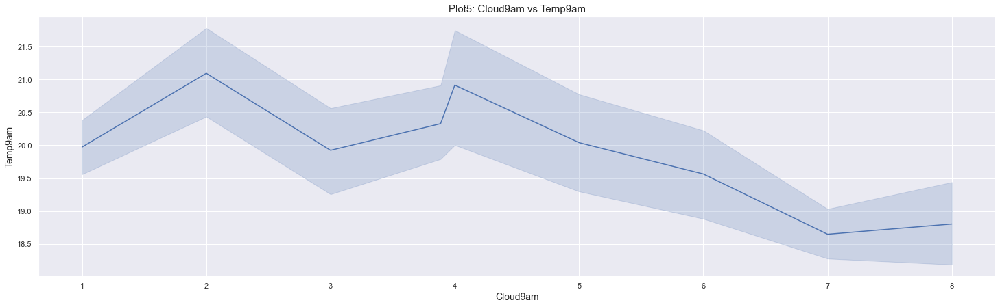

In [1677]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Temp9am',x= 'Cloud9am', data=df)
plt.xlabel('Cloud9am', fontsize = 14)
plt.ylabel('Temp9am', fontsize = 14)
plt.title('Plot5: Cloud9am vs Temp9am', fontsize = 15)

Observation:
- Data Cleaning
1. No zero value found
2. No null values are found
3. Outliers are found and removed by IQR method
4. mean,median,mode values are improved
5. skewness is improved
- Results by EDA
1. In plot1,E and ESE has high temp
2. In plot2, Windspeed is almost constant at temperature 12-15
3. In plot3, As temperature increases, humidity decreases
4. In plot4, As temperature increases, pressure decreases
5. In plot5, an increasing and a decreasing curve

In [1678]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2967, 25)


# Column21:RainToday

In [1679]:
df['RainToday'].unique() #check the unique value

array(['Yes', 'No', nan], dtype=object)

In [1680]:
df['RainToday'].value_counts() #check the counts of unique value

No     2299
Yes     661
Name: RainToday, dtype: int64

In [1681]:
df.dropna(subset=["RainToday"], inplace=True) #drop the null values

In [1682]:
df['RainToday'].unique() #check the unique value

array(['Yes', 'No'], dtype=object)

In [1683]:
df['RainToday'].value_counts() #check the counts of unique value

No     2299
Yes     661
Name: RainToday, dtype: int64

In [1684]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2960, 25)


# Label1:Rainfall

In [1685]:
df['Rainfall'].unique() #check the unique value

array([ 24.4,   6.8,  16.8,   0. ,   3.2,   0.8,   1.4,   0.4,   2.4,
        12. ,   0.2,  11.4,  62.6,  10.4,   7.4,  15.6,  17.4,   9.4,
        38. ,   9.2,   2. ,   4. ,   7. ,   1.2,   3.4,  59. ,  11.2,
        29.8,  20.2,   4.2,   4.6,   1.6,  19.6,   3.6,   0.6,  10.6,
        12.2,  55.8,  70. ,  71.2,  13.6,   3. ,  15.2,   9. ,   1.8,
        10. ,   2.8,  96. ,  17. ,   5.2,   7.2,  11. ,  34.2,  38.8,
         2.6,  10.8,   5.8,   3.8,  67. ,  20. ,   8.6,  80.6,   1. ,
        13.2,  13.4,   6.2,  56.6,  45.2,   9.6,  24. ,   9.8,  18.2,
         8.8,   6.4,   5. ,  12.8,  33.4,   4.8,  34.4,   7.6,  16.2,
        13.8,   6.6,   8. ,  90. , 128. ,  61.2,  13. ,   2.2,  23.8,
         5.6,  27.6,  18.8,  15.8,  73.8,  30.8,  35.4,  25. ,  30.2,
        40.6,  25.2,   0.7,  18.4, 110.8,  23.4,   8.2,  11.6,  15. ,
        35.2,  39.2,  27.2,  11.8,   4.4,   6. ,  23. ,   7.8,  28.8,
        22.2,  15.4,  82.2,  21.2,  22.4,   8.4,  34.6,  36.2,  14.2,
        21. ,  19. ,

In [1686]:
df['Rainfall'].value_counts() #check the counts of unique value

0.0      2044
0.2       109
0.4        64
0.6        35
1.4        33
         ... 
18.2        1
168.4       1
23.6        1
31.6        1
37.2        1
Name: Rainfall, Length: 173, dtype: int64

In [1687]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Rainfall'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Rainfall'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Rainfall'].skew())#check the skewness

Check the zeros in Column:--------> False

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 7.695884622191224


In [1688]:
df['Rainfall'] = df['Rainfall'].replace(0,df['Rainfall'].mean())

In [1689]:
#check the zeros, null and skew data
print('Check the zeros in Column:-------->',df['Rainfall'].all())#check the zero value in column
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Check the null values in Column:---------->', df['Rainfall'].isnull().sum())
time.sleep(1)#check the null value in column
print("\n",'*'*50)
time.sleep(1)#delay of 1 sec
print('Check the skewness in Column:---------->',df['Rainfall'].skew())#check the skewness

Check the zeros in Column:--------> True

 **************************************************
Check the null values in Column:----------> 0

 **************************************************
Check the skewness in Column:----------> 8.39033116228348


In [1690]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2960, 25)


# Label2:RainTomorrow

In [1691]:
df['RainTomorrow'].unique() #check the unique value

array(['Yes', 'No', nan], dtype=object)

In [1692]:
df['RainTomorrow'].value_counts() #check the counts of unique value

No     2300
Yes     638
Name: RainTomorrow, dtype: int64

In [1693]:
df.dropna(subset=["RainTomorrow"], inplace=True) #drop the null values

In [1694]:
df['RainTomorrow'].unique() #check the unique value

array(['Yes', 'No'], dtype=object)

In [1695]:
#check the shape of our dataset
print('Actual shape of our Dataset now :-------->', df.shape)

Actual shape of our Dataset now :--------> (2938, 25)


In [1696]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Date_Month       0
Date_Day         0
Date_Years       0
dtype: int64

In [1697]:
df['RainTomorrow'].unique()

array(['Yes', 'No'], dtype=object)

In [1698]:
df['Location'] = df['Location'].map({'Albury':0, 'CoffsHarbour':1, 'Newcastle':2, 'Penrith':3, 'Williamtown':4,
       'Wollongong':5, 'Melbourne':6, 'Brisbane':7, 'Adelaide':8, 'PerthAirport':9,
       'Darwin':10, 'Uluru':11})
df['WindGustDir'] = df['WindGustDir'].map({'ESE':0, 'E':1, 'WSW':2, 'ENE':3, 'NNE':4, 'NNW':5, 'S':6, 'SW':7, 'SSE':8, 'SSW':9,
       'SE':10, 'NE':11, 'N':12, 'NW':13, 'WNW':14, 'W':15})
df['WindDir9am'] = df['WindDir9am'].map({'SW':0, 'WSW':1, 'NNW':2, 'WNW':3, 'W':4, 'E':5, 'NW':6, 'NNE':7, 'N':8, 'SSW':9, 'S':10,
       'ESE':15, 'SSE':11, 'NE':12, 'SE':13, 'ENE':14})
df['WindDir3pm'] = df['WindDir3pm'].map({'ESE':0, 'S':1, 'ENE':2, 'NE':3, 'NNE':4, 'NNW':5, 'SE':6, 'SSE':7, 'SSW':8, 'WSW':9,
       'N':10, 'NW':11, 'E':12, 'W':13, 'SW':14, 'WNW':15})
df['RainToday'] = df['RainToday'].map({'Yes':1, 'No':0})
df['RainTomorrow'] = df['RainTomorrow'].map({'Yes':1, 'No':0})

In [1699]:
df.drop(columns='Date',inplace=True) #drop the column

correlation between the Features and with label:-----> (24, 24)

 **************************************************


<function matplotlib.pyplot.show(close=None, block=None)>

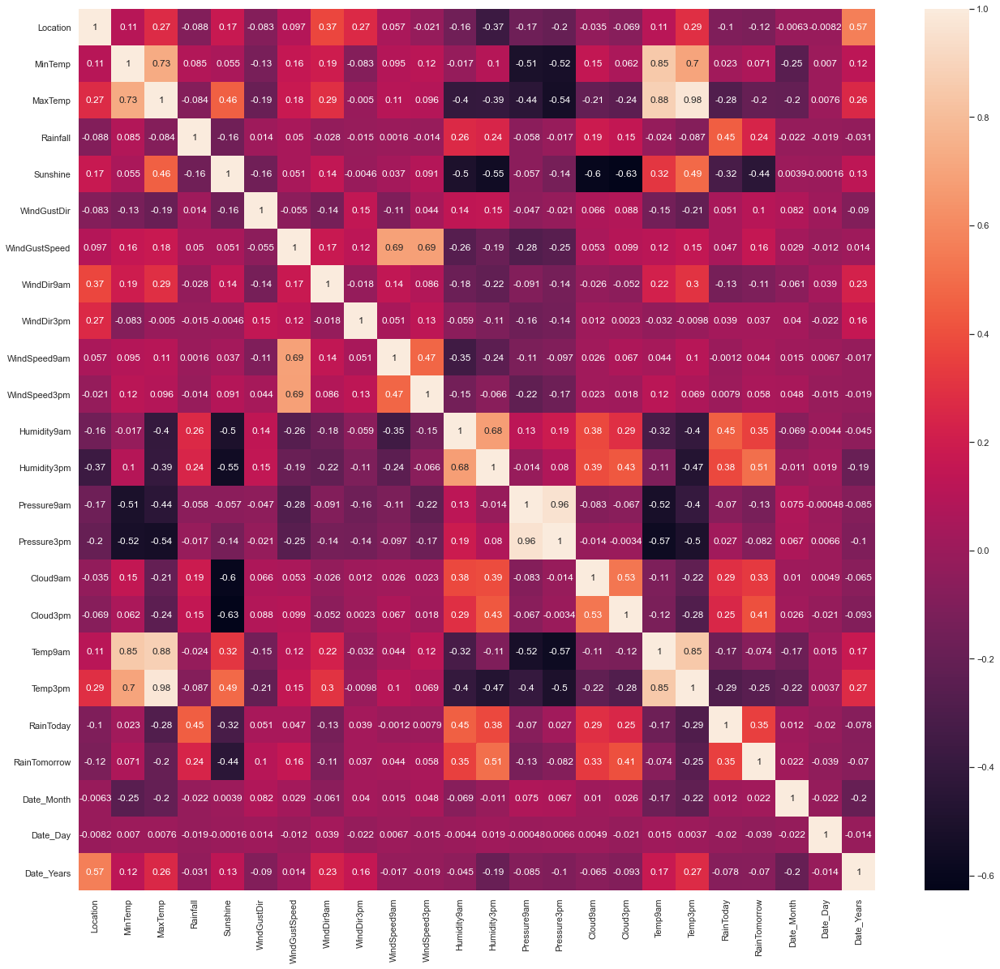

In [1700]:
# analyize the correlation
corr = df.corr()
print('correlation between the Features and with label:----->',corr.shape)
print("\n",'*'*50)
# Visualize the corrrelation by using heatmap
plt.figure(figsize=(22,20))
sns.heatmap(corr, annot=True)
plt.show

In [1701]:
#Taking RainTomorrow

In [1702]:
#split x and y
x = df.drop(['RainTomorrow'], axis=1)
y=df.RainTomorrow

In [1703]:
#scale the value x
Scaler = StandardScaler()
x_scaled = Scaler.fit_transform(x)
x_scaled

array([[-1.85885419,  1.03929377,  0.30048873, ..., -1.00878124,
        -0.64117664, -1.55442209],
       [-1.85885419,  0.82750702,  0.03520088, ..., -1.00878124,
        -0.52830804, -1.55442209],
       [-1.85885419,  0.40393352,  0.01751502, ..., -1.00878124,
        -0.41543944, -1.55442209],
       ...,
       [ 1.11319941,  2.02121415,  1.30858257, ...,  1.36796237,
        -0.86691385,  0.41237037],
       [ 1.11319941,  2.1367342 ,  1.36164014, ...,  1.36796237,
        -0.75404524,  0.41237037],
       [ 1.11319941,  2.02121415,  1.57387042, ...,  1.36796237,
        -0.64117664,  0.41237037]])

In [1704]:
# Check the multicollinearity between the features
#import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["vif"]= [ variance_inflation_factor(x_scaled, i)
               for i in range ( x_scaled.shape[1])]
vif['features']= x.columns
vif #no multicollinearity between the features

,vif,features
0,2.127485,Location
1,7.039739,MinTemp
2,29.232581,MaxTemp
3,1.301471,Rainfall
4,2.729965,Sunshine
5,1.129753,WindGustDir
6,3.184046,WindGustSpeed
7,1.299655,WindDir9am
8,1.215854,WindDir3pm
9,2.304670,WindSpeed9am


In [1705]:
x = df.drop(columns='MaxTemp',inplace=True)
x = df.drop(columns='Pressure3pm',inplace=True)
x = df.drop(columns='Temp3pm',inplace=True)
x = df.drop(columns='Temp9am',inplace=True)
# x = df.drop(columns='',inplace=True)

In [1706]:
#split x and y
x = df.drop(['RainTomorrow'], axis=1)
y=df.RainTomorrow

In [1707]:
#scale the value x
Scaler = StandardScaler()
x_scaled = Scaler.fit_transform(x)
x_scaled

array([[-1.85885419,  1.03929377,  2.39735205, ..., -1.00878124,
        -0.64117664, -1.55442209],
       [-1.85885419,  0.82750702,  0.29020777, ..., -1.00878124,
        -0.52830804, -1.55442209],
       [-1.85885419,  0.40393352,  1.48744884, ..., -1.00878124,
        -0.41543944, -1.55442209],
       ...,
       [ 1.11319941,  2.02121415,  1.91845562, ...,  1.36796237,
        -0.86691385,  0.41237037],
       [ 1.11319941,  2.1367342 , -0.2128883 , ...,  1.36796237,
        -0.75404524,  0.41237037],
       [ 1.11319941,  2.02121415, -0.2128883 , ...,  1.36796237,
        -0.64117664,  0.41237037]])

In [1708]:
# Check the multicollinearity between the features
#import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["vif"]= [ variance_inflation_factor(x_scaled, i)
               for i in range ( x_scaled.shape[1])]
vif['features']= x.columns
vif #no multicollinearity between the features

,vif,features
0,2.044132,Location
1,1.683478,MinTemp
2,1.296115,Rainfall
3,2.555592,Sunshine
4,1.123371,WindGustDir
5,3.085803,WindGustSpeed
6,1.275081,WindDir9am
7,1.207921,WindDir3pm
8,2.168230,WindSpeed9am
9,2.046716,WindSpeed3pm


In [1709]:
#split data into train and test.
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y,test_size = 0.25, random_state=13)

In [1710]:
y_train.head()

7340    0
7842    0
7472    1
7147    1
8216    0
Name: RainTomorrow, dtype: int64

In [1711]:
# Check the Accuracy by using 5 classification models

In [1712]:
log_reg = LogisticRegression() #Model instantiating
dt = DecisionTreeClassifier()
rf= RandomForestClassifier()
knn = KNeighborsClassifier()
svc = SVC()

In [1713]:
#train the model
log_reg.fit(x_train,y_train)
dt.fit(x_train,y_train)
rf.fit(x_train,y_train)
knn.fit(x_train,y_train)
svc.fit(x_train,y_train)
print("all models are trained")

all models are trained


In [1714]:
log_reg.score(x_test,y_test) #Let's check how well model fits the test data
dt.score(x_test,y_test)
rf.score(x_test,y_test)
knn.score(x_test,y_test)
svc.score(x_test,y_test)
print("all models score are captured")

all models score are captured


In [1715]:
y_pred_log_reg = log_reg.predict(x_test) #save the predictions in some variables
y_pred_dt = dt.predict(x_test) 
y_pred_rf = rf.predict(x_test) 
y_pred_knn = knn.predict(x_test) 
y_pred_svc = svc.predict(x_test) 

In [1716]:
#check the accuracy score, confusion matrix and classification report
print('Accuracy_score of Logistic regression:-------->  ',accuracy_score(y_test,y_pred_log_reg))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_log_reg))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_log_reg))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)


print('Accuracy_score of Decision Tree:-------->  ',accuracy_score(y_test,y_pred_dt))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_dt))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_dt))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)

print('Accuracy_score of Random forest:-------->  ',accuracy_score(y_test,y_pred_rf))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_rf))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_rf))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)

print('Accuracy_score of KNeighbors Classifiers:-------->  ',accuracy_score(y_test,y_pred_knn))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_knn))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_knn))

time.sleep(2)
print("\n",'*'*50)
print("\n",'*'*50)
time.sleep(2)

print('Accuracy_score of Support Vector Machine:-------->  ',accuracy_score(y_test,y_pred_svc))
time.sleep(2)
print('Confusion_matrix:\n' , confusion_matrix(y_test,y_pred_svc))
time.sleep(2)
print('Classification_report:\n' , classification_report(y_test,y_pred_svc))

Accuracy_score of Logistic regression:-------->   0.85578231292517
Confusion_matrix:
 [[540  41]
 [ 65  89]]
Classification_report:
               precision    recall  f1-score   support

           0       0.89      0.93      0.91       581
           1       0.68      0.58      0.63       154

    accuracy                           0.86       735
   macro avg       0.79      0.75      0.77       735
weighted avg       0.85      0.86      0.85       735


 **************************************************

 **************************************************
Accuracy_score of Decision Tree:-------->   0.7986394557823129
Confusion_matrix:
 [[499  82]
 [ 66  88]]
Classification_report:
               precision    recall  f1-score   support

           0       0.88      0.86      0.87       581
           1       0.52      0.57      0.54       154

    accuracy                           0.80       735
   macro avg       0.70      0.72      0.71       735
weighted avg       0.81      0.80

In [1717]:
#check all model cv score
print("Logistic regression CV Score:")
print(cross_val_score(log_reg,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("Decision Tree CV Score:")
print(cross_val_score(dt,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("Random Forest CV Score:")
print(cross_val_score(rf,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("KNeighbour Classifier CV Score:")
print(cross_val_score(knn,x_scaled,y,cv=5))

time.sleep(2)
print("\n",'*'*50)

print("Support Vector Machine CV Score:")
print(cross_val_score(svc,x_scaled,y,cv=5))

Logistic regression CV Score:
[0.66156463 0.78401361 0.85204082 0.87052811 0.8637138 ]

 **************************************************
Decision Tree CV Score:
[0.29931973 0.69557823 0.80442177 0.81431005 0.82453152]

 **************************************************
Random Forest CV Score:
[0.25510204 0.81462585 0.84693878 0.86030664 0.86541738]

 **************************************************
KNeighbour Classifier CV Score:
[0.74829932 0.7585034  0.82993197 0.83986371 0.84156729]

 **************************************************
Support Vector Machine CV Score:
[0.53911565 0.80442177 0.83673469 0.8637138  0.87052811]


In [1718]:
#Check the mean of all models cv score one by one
print("Logistic regression CV Score:")
print(cross_val_score(log_reg,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("Decision Tree CV Score:")
print(cross_val_score(dt,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("Random Forest CV Score:")
print(cross_val_score(rf,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("KNeighbour Classifier CV Score:")
print(cross_val_score(knn,x_scaled,y,cv=5).mean())

time.sleep(2)
print("\n",'*'*50)

print("Support Vector Machine CV Score:")
print(cross_val_score(svc,x_scaled,y,cv=5).mean())

Logistic regression CV Score:
0.8063721911251724

 **************************************************
Decision Tree CV Score:
0.6862728737150737

 **************************************************
Random Forest CV Score:
0.7278030803462782

 **************************************************
KNeighbour Classifier CV Score:
0.8036331397976568

 **************************************************
Support Vector Machine CV Score:
0.7829028033700702


In [ ]:
# Plot ROC/AUC for multiple models

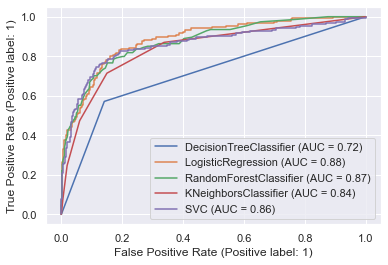

In [1719]:
#how well out model works on test data
disp = plot_roc_curve(dt,x_test,y_test)
plot_roc_curve(log_reg,x_test,y_test, ax= disp.ax_)
plot_roc_curve(rf,x_test,y_test, ax= disp.ax_)
plot_roc_curve(knn,x_test,y_test, ax= disp.ax_)
plot_roc_curve(svc,x_test,y_test, ax= disp.ax_)
plt.show()

In [ ]:
# GridSearchCV By using Knn as a estimator

In [1720]:
param_grid = {'algorithm':['kdtree','brute'], 'leaf_size':[12,11,14,15,18,20,25], 'n_neighbors':[3,5,7,9,11,13]}
gridsearch = GridSearchCV(estimator=knn, param_grid= param_grid) #apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params into knn
knn1 = gridsearch.best_estimator_ #save that best param into one variable
print('Trained Model using best parameters:----->',knn1.fit(x_train,y_train))#train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',knn1.score(x_train,y_train)) #check the accuracy score

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['kdtree', 'brute'],
                         'leaf_size': [12, 11, 14, 15, 18, 20, 25],
                         'n_neighbors': [3, 5, 7, 9, 11, 13]})

 **************************************************
GridSearchCV best parameters:-----> {'algorithm': 'brute', 'leaf_size': 12, 'n_neighbors': 11}

 **************************************************
Trained Model using best parameters:-----> KNeighborsClassifier(algorithm='brute', leaf_size=12, n_neighbors=11)

 **************************************************
Accuracy score:------> 0.8683613254652747


In [ ]:
# GridSearchCV By using SVC as a estimator

In [1721]:
param_grid = {'C': [1,2,4,5,6,7,8,9,10],         
             'gamma': [0.2,0.3,0.4,0.5,0.6,0.7,0.8],
             'kernel': ['rbf']}
gridsearch = GridSearchCV(estimator=svc, param_grid= param_grid)#apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params into svc
svc1 = gridsearch.best_estimator_#save that best param into one variable
print('Trained Model using best parameters:----->',svc1.fit(x_train,y_train))#train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',svc1.score(x_train,y_train))#check the accuracy score

GridSearchCV(estimator=SVC(),
             param_grid={'C': [1, 2, 4, 5, 6, 7, 8, 9, 10],
                         'gamma': [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],
                         'kernel': ['rbf']})

 **************************************************
GridSearchCV best parameters:-----> {'C': 1, 'gamma': 0.2, 'kernel': 'rbf'}

 **************************************************
Trained Model using best parameters:-----> SVC(C=1, gamma=0.2)

 **************************************************
Accuracy score:------> 0.9736722650930549


In [ ]:
# GridSearchCV By using RandomForestClassifier as a estimator

In [1722]:
params = {'n_estimators':[13,15],
         'criterion':['entropy'],
         'max_depth':[10,15],
         'min_samples_split':[10,11],
         'min_samples_leaf':[5,6]}
gridsearch = GridSearchCV(estimator=rf, param_grid= params)#apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params into knn
rfc = gridsearch.best_estimator_
print('Trained Model using best parameters:----->',rfc.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',rfc.score(x_train,y_train))#check the accuracy score

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['entropy'], 'max_depth': [10, 15],
                         'min_samples_leaf': [5, 6],
                         'min_samples_split': [10, 11],
                         'n_estimators': [13, 15]})

 **************************************************
GridSearchCV best parameters:-----> {'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 6, 'min_samples_split': 10, 'n_estimators': 15}

 **************************************************
Trained Model using best parameters:-----> RandomForestClassifier(criterion='entropy', max_depth=15, min_samples_leaf=6,
                       min_samples_split=10, n_estimators=15)

 **************************************************
Accuracy score:------> 0.9255560599182933


In [ ]:
# GridSearchCV By using DecisionTreeClassifier as a estimator

In [1723]:
params = {'criterion':['entropy','gini'],
         'max_depth':range(10,15),
         'min_samples_split':[3,10],
         'min_samples_leaf':[2,10]}
gridsearch = GridSearchCV(estimator=dt, param_grid= params)#apply GridSearchCV
time.sleep(2)
print(gridsearch.fit(x_train,y_train)) #train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('GridSearchCV best parameters:----->',gridsearch.best_params_) #get best parameters
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
#put best params into knn
dtr = gridsearch.best_estimator_
print('Trained Model using best parameters:----->',dtr.fit(x_train,y_train))#train the model
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score:------>',dtr.score(x_train,y_train))#check the accuracy score

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(10, 15),
                         'min_samples_leaf': [2, 10],
                         'min_samples_split': [3, 10]})

 **************************************************
GridSearchCV best parameters:-----> {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 3}

 **************************************************
Trained Model using best parameters:-----> DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=10,
                       min_samples_split=3)

 **************************************************
Accuracy score:------> 0.9010440308669996


In [ ]:
# Bagging Classifier with Bootstrap = True (Using 4 models)

In [ ]:
#Using knn as a best estimator

In [1724]:
bag_knn = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),
                           n_estimators=10, max_samples=0.5,
                           bootstrap=True, random_state=3,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_knn.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_knn.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=KNeighborsClassifier(), max_samples=0.5,
                  oob_score=True, random_state=3)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8408163265306122


In [ ]:
#Using svc as a best estimator

In [1725]:
bag_svc = BaggingClassifier(SVC(),                       #using svc as a best estimator
                           n_estimators=15,
                           bootstrap=True, random_state=5,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_svc.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_svc.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=SVC(), n_estimators=15, oob_score=True,
                  random_state=5)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8693877551020408


In [ ]:
#Using RandomForestClassifier as a best estimator

In [1726]:
bag_rf = BaggingClassifier(RandomForestClassifier(),#using RandomForest as a best estimator
                           n_estimators=15,
                           bootstrap=True, random_state=7,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_rf.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_rf.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=RandomForestClassifier(), n_estimators=15,
                  oob_score=True, random_state=7)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8571428571428571


In [ ]:
#Using DecisionTreeClassifier as a best estimator

In [1727]:
bag_dt = BaggingClassifier(dt,                        #using DecisionTree as a best estimator
                           n_estimators=15,
                           bootstrap=True, random_state=7,
                           oob_score=True)
time.sleep(2)
print('Model is Trained:- ', bag_dt.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_dt.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=15,
                  oob_score=True, random_state=7)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8517006802721089


In [ ]:
# Bagging Classifier with Bootstrap = False (Using 4 models)

In [ ]:
#Using knn as a best estimator

In [1728]:
bag_knn = BaggingClassifier(KNeighborsClassifier(n_neighbors=5),#using knn as a best estimator
                           n_estimators=10, max_samples=0.5,
                           bootstrap=False, random_state=3,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_knn.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_knn.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=KNeighborsClassifier(), bootstrap=False,
                  max_samples=0.5, random_state=3)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8353741496598639


In [ ]:
#Using svc as a best estimator

In [1729]:
bag_svc = BaggingClassifier(SVC(),                  #using svc as a best estimator
                           n_estimators=15,
                           bootstrap=False, random_state=5,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_svc.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_svc.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=SVC(), bootstrap=False, n_estimators=15,
                  random_state=5)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8653061224489796


In [ ]:
#Using RandomForestClassifier as a best estimator

In [1730]:
bag_rf = BaggingClassifier(RandomForestClassifier(),   #using RandomForest as a best estimator
                           n_estimators=15,
                           bootstrap=False, random_state=7,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_rf.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_rf.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=RandomForestClassifier(), bootstrap=False,
                  n_estimators=15, random_state=7)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.8571428571428571


In [ ]:
#Using DecisionTreeClassifier as a best estimator

In [1731]:
bag_dt = BaggingClassifier(dt,                       #using DecisionTree as a best estimator
                           n_estimators=15,
                           bootstrap=False, random_state=7,
                           )
time.sleep(2)
print('Model is Trained:- ', bag_dt.fit(x_train,y_train))
time.sleep(1)
print("\n",'*'*50)
time.sleep(1)
print('Accuracy score by using BaggingClassifier:-', bag_dt.score(x_test,y_test))

Model is Trained:-  BaggingClassifier(base_estimator=DecisionTreeClassifier(), bootstrap=False,
                  n_estimators=15, random_state=7)

 **************************************************
Accuracy score by using BaggingClassifier:- 0.7931972789115647


In [ ]:
#Saving the model

In [ ]:
#By using classification, grid search cv using svc is giving us 97% accuracy, 
#hence, this is our best model for classification

In [ ]:
# with open('weather_forecast_prediction','wb') as f:
#     pickle.dump(svc(),f)

In [1732]:
df.columns

Index(['Location', 'MinTemp', 'Rainfall', 'Sunshine', 'WindGustDir',
       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Cloud9am',
       'Cloud3pm', 'RainToday', 'RainTomorrow', 'Date_Month', 'Date_Day',
       'Date_Years'],
      dtype='object')

In [ ]:
#using Rainfall as a label

In [1733]:
#split x and y
x = df.drop(['Rainfall'], axis=1)
y=df.Rainfall

In [1734]:
#scale the value x
Scaler = StandardScaler()
x_scaled = Scaler.fit_transform(x)
x_scaled

array([[-1.85885419,  1.03929377,  0.16699665, ..., -1.00878124,
        -0.64117664, -1.55442209],
       [-1.85885419,  0.82750702, -1.52455684, ..., -1.00878124,
        -0.52830804, -1.55442209],
       [-1.85885419,  0.40393352, -0.70898641, ..., -1.00878124,
        -0.41543944, -1.55442209],
       ...,
       [ 1.11319941,  2.02121415,  0.07637771, ...,  1.36796237,
        -0.86691385,  0.41237037],
       [ 1.11319941,  2.1367342 , -0.40692328, ...,  1.36796237,
        -0.75404524,  0.41237037],
       [ 1.11319941,  2.02121415,  0.0461714 , ...,  1.36796237,
        -0.64117664,  0.41237037]])

In [1735]:
# Check the multicollinearity between the features
#import library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["vif"]= [ variance_inflation_factor(x_scaled, i)
               for i in range ( x_scaled.shape[1])]
vif['features']= x.columns
vif 

,vif,features
0,2.037729,Location
1,1.682062,MinTemp
2,2.574086,Sunshine
3,1.123925,WindGustDir
4,3.216634,WindGustSpeed
5,1.274677,WindDir9am
6,1.208923,WindDir3pm
7,2.168410,WindSpeed9am
8,2.057718,WindSpeed3pm
9,2.609871,Humidity9am


In [1736]:
#split data into train and test.
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y,test_size = 0.25, random_state=42)

In [1737]:
y_train.head()

8184    2.597872
4715    2.597872
4621    2.597872
1385    2.597872
984     0.400000
Name: Rainfall, dtype: float64

In [1739]:
#Using regression models to check accuracy

In [1740]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor #import library
from sklearn import metrics

In [1741]:
#Model instantiating and training
lr = LinearRegression()
dtr=DecisionTreeRegressor()
rfo = RandomForestRegressor()

In [1742]:
print('Linear Regression',lr.fit(x_train, y_train))
time.sleep(2)
print('Decsion Tree',dtr.fit(x_train, y_train))
time.sleep(2)
print('Random Forest',rfo.fit(x_train, y_train))

Linear Regression LinearRegression()
Decsion Tree DecisionTreeRegressor()
Random Forest RandomForestRegressor()


In [1743]:
#Check How much our model learn
print('Linear regression Score:-------->', lr.score(x_train, y_train))
time.sleep(2)
print('Decision Tree score:------->', dtr.score(x_train,y_train))
time.sleep(2)
print('Random Forest score:------>',rfo.score(x_train, y_train))

Linear regression Score:--------> 0.2366801733320104
Decision Tree score:-------> 1.0
Random Forest score:------> 0.8764913284243654


In [1744]:
#Let's check how well model fits the test data
print('Linear regression Score:-------->', lr.score(x_test, y_test))
time.sleep(2)
print('Decision Tree score:------->', dtr.score(x_test,y_test))
time.sleep(2)
print('Random Forest score:------>',rfo.score(x_test, y_test))

Linear regression Score:--------> 0.2010811489888803
Decision Tree score:-------> -1.6562886445025717
Random Forest score:------> 0.2233254727543772


In [1745]:
y_pred_lr = lr.predict(x_test)#save the predictions in some variables
y_pred_dtr = dtr.predict(x_test)
y_pred_rfo = rfo.predict(x_test)

Linear Regression:


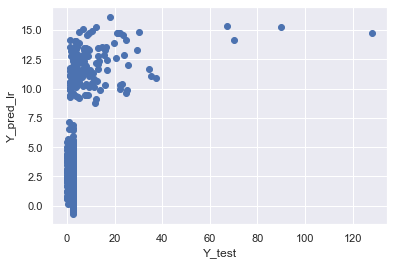

Decision Tree:


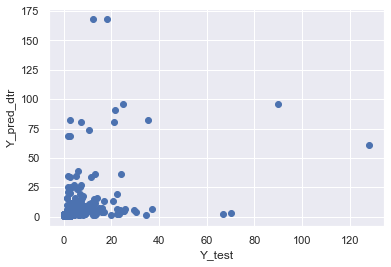

Random Forest:


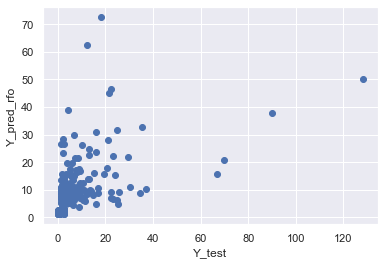

In [1746]:
#plot the actual and predicted value
print("Linear Regression:")
plt.scatter(y_test,y_pred_lr)
plt.xlabel('Y_test')
plt.ylabel('Y_pred_lr')
plt.show()
time.sleep(2)
print("Decision Tree:")
plt.scatter(y_test,y_pred_dtr)
plt.xlabel('Y_test')
plt.ylabel('Y_pred_dtr')
plt.show()
time.sleep(2)
print("Random Forest:")
plt.scatter(y_test,y_pred_rfo)
plt.xlabel('Y_test')
plt.ylabel('Y_pred_rfo')
plt.show()

In [1747]:
#calculate Mean absolute error
print("Linear Regression:")
print('MAE:--------->',mean_absolute_error(y_test, y_pred_lr))#calculate Mean absolute error
time.sleep(1)
print('MSE:----------->',mean_squared_error(y_test,y_pred_lr))#calculate mean squared error
time.sleep(1)
print('RSME:--------->',np.sqrt(mean_squared_error(y_test,y_pred_lr)))#calculate root mean square error

time.sleep(2)
print("Decision Tree:")
print('MAE:--------->',mean_absolute_error(y_test, y_pred_dtr))#calculate Mean absolute error
time.sleep(1)
print('MSE:----------->',mean_squared_error(y_test,y_pred_dtr))#calculate mean squared error
time.sleep(1)
print('RSME:--------->',np.sqrt(mean_squared_error(y_test,y_pred_dtr)))#calculate root mean square error
time.sleep(2)
print("Random Forest:")
print('MAE:--------->',mean_absolute_error(y_test, y_pred_rfo))#calculate Mean absolute error
time.sleep(1)
print('MSE:----------->',mean_squared_error(y_test,y_pred_rfo))#calculate mean squared error
time.sleep(1)
print('RSME:--------->',np.sqrt(mean_squared_error(y_test,y_pred_rfo)))#calculate root mean square error

Linear Regression:
MAE:---------> 2.8520891935018287
MSE:-----------> 49.31600836495463
RSME:---------> 7.022535750350769
Decision Tree:
MAE:---------> 3.4030973064901624
MSE:-----------> 163.96853428383997
RSME:---------> 12.805019886116536
Random Forest:
MAE:---------> 2.3868563747931613
MSE:-----------> 47.94290112696214
RSME:---------> 6.924081247859686


In [ ]:
#Lasso Regression

In [1748]:
#import Ridge, Lasso, RidgeCV, LassoCV
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV

In [1749]:
#to find best alpha
lassocv= LassoCV(alphas=None, max_iter = 1000, normalize = True)

In [1750]:
#train the model
lassocv.fit(x_train,y_train)

LassoCV(normalize=True)

In [1751]:
#best alpha parameter
alpha = lassocv.alpha_
alpha

0.006312565360829798

In [1752]:
#fit the data
lasso_reg = Lasso(alpha)

In [1753]:
lasso_reg.fit(x_train,y_train) #train the data

Lasso(alpha=0.006312565360829798)

In [1754]:
lasso_reg.score(x_test,y_test) #get the score of test data

0.20087567809335072

In [1755]:
# Ridge Regression

In [1756]:
ridgecv= RidgeCV(alphas=np.arange(0.001,0.1,0.01), normalize = True)

In [1757]:
#train the data
ridgecv.fit(x_train,y_train)

RidgeCV(alphas=array([0.001, 0.011, 0.021, 0.031, 0.041, 0.051, 0.061, 0.071, 0.081,
       0.091]),
        normalize=True)

In [1758]:
#best alpha parameter
ridgecv.alpha_

0.05099999999999999

In [1759]:
#fit the data
ridge_model = Ridge(alpha = ridgecv.alpha_)
ridge_model.fit(x_train,y_train)

Ridge(alpha=0.05099999999999999)

In [1760]:
ridge_model.score(x_test,y_test) #get the score

0.20108175714805177

In [1761]:
# Ada Boost Regressor

In [1762]:
ada = AdaBoostRegressor() #using this to improve accuracy

In [1763]:
ada_model= ada.fit(x_train,y_train) # fit the data

In [1764]:
y_pred = ada_model.predict(x_test) #predict it

In [1765]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
r2_score(y_test,y_pred) #get the r2score

0.043226632068207094

In [1766]:
# Using RandomSearchCV by using LinearRegression as a estimator

In [1767]:
params = {'n_estimators': [40,47,49,50], 'learning_rate' :[.30,.40,.45]}

In [1768]:
rnd_srch = RandomizedSearchCV(AdaBoostRegressor(), cv =5, param_distributions = params ) 
#using randomsearchCv

In [1769]:
rnd_srch.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=AdaBoostRegressor(),
                   param_distributions={'learning_rate': [0.3, 0.4, 0.45],
                                        'n_estimators': [40, 47, 49, 50]})

In [1770]:
rnd_srch.best_estimator_ 

AdaBoostRegressor(learning_rate=0.45, n_estimators=40)

In [1771]:
ada = AdaBoostRegressor( base_estimator = lr, learning_rate = 0.45, n_estimators = 47)

In [1772]:
ada.fit(x_train,y_train) #fit the data

AdaBoostRegressor(base_estimator=LinearRegression(), learning_rate=0.45,
                  n_estimators=47)

In [1773]:
y_pred = ada.predict(x_test) #predict it

In [1774]:
r2_score(y_test,y_pred) #get the score

-0.7595959564971109

In [1775]:
# Using GridSearchCV by using DecisionTree as a estimator

In [1776]:
ada = AdaBoostRegressor( base_estimator = dtr, learning_rate = 0.45, n_estimators = 47)

In [1777]:
ada.fit(x_train,y_train) #fit the data

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), learning_rate=0.45,
                  n_estimators=47)

In [1778]:
y_pred = ada.predict(x_test) #predict it

In [1779]:
r2_score(y_test,y_pred) #get the score

0.5454772184829437

In [1780]:
# xgboost regressor

In [1781]:
import xgboost as xgb #import libraries
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [1782]:
xgbr = xgb.XGBRegressor()  #to improve accuracy
xgbr.fit(x_train,y_train)
y_pred = xgbr.predict(x_test)
r2_score(y_test, y_pred)

0.14669247414883346

In [1783]:
# GradientBoostingRegressor

In [1784]:
gradientregressor = GradientBoostingRegressor(max_depth=3, n_estimators=6, learning_rate=.4) 
#using GBR

In [1785]:
gbr = gradientregressor.fit(x_train,y_train) #fit the data

In [1786]:
r2_score(y_test,y_pred) #predict it

0.14669247414883346

In [1787]:
# Using GridSearchCV for GBR to improve accuracy

In [1788]:
grid_params = {
    'max_depth': range(4,12,2),
    'learning_rate': np.arange(0.1,1,0.1),
    'min_samples_split': range(4,8,2)
}

In [1789]:
grid = GridSearchCV(gbr, param_grid = grid_params)

In [1790]:
grid.fit(x_train, y_train) #fit the data

GridSearchCV(estimator=GradientBoostingRegressor(learning_rate=0.4,
                                                 n_estimators=6),
             param_grid={'learning_rate': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'max_depth': range(4, 12, 2),
                         'min_samples_split': range(4, 8, 2)})

In [1791]:
grid.best_params_ # get the best parameters

{'learning_rate': 0.1, 'max_depth': 8, 'min_samples_split': 6}

In [1792]:
a = grid.best_estimator_

In [1793]:
a.fit(x_train,y_train) # fit the data

GradientBoostingRegressor(max_depth=8, min_samples_split=6, n_estimators=6)

In [1794]:
y_pred = a.predict(x_test) # predict it

In [1795]:
r2_score(y_test, y_pred) # get the improved r2 score

0.3387422712332673

In [1796]:
# Saving the model

In [ ]:
#We see, grid search cv by using decision tree as a estimator is giving 54% accuracy, 
#so, this is our best model

In [1797]:
with open('weather_forecast_prediction','wb') as f:
    pickle.dump(DecisionTreeRegressor(),f)